In [1]:
window_size="_256"
# " + window_size + "

In [2]:
import adclasses
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib
from datetime import timedelta
import os
import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


In [3]:
dataset_name_list = ["grok_asg_anomaly", 
                     "rds_cpu_utilization_cc0c53", 
                     "rds_cpu_utilization_e47b3b",
                     "art_daily_flatmiddle",
                     "ec2_cpu_utilization_5f5533",
                     "ec2_cpu_utilization_ac20cd",
                     "art_daily_nojump",
                     "artificial_cd_1",
                     "artificial_cd_2",
                     "artificial_cd_3"]
true_outlier_indices_dict = {}
ad_dict = {}

# grok_asg_anomaly

In [4]:
dataset_name = "grok_asg_anomaly"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="5min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-01-16 00:00:00
End date:  2014-02-01 01:00:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4621
Time step size:  5min
Start Date:  2014-01-16 00:00:00
End Date:  2014-02-01 01:00:00
Date Format:  %Y-%m-%d %H:%M:%S


# rds_cpu_utilization_cc0c53

In [5]:
dataset_name = "rds_cpu_utilization_cc0c53"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '5min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '5min', data, method="linear")

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="5min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-02-14 14:30:00
End date:  2014-02-28 14:30:00
Missing time stamps: 
 DatetimeIndex(['2014-02-25 07:10:00'], dtype='datetime64[ns]', freq='5T')
Fill Missing Time Steps with Interpolation
Length:  4033
Time step size:  5min
Date Format:  %Y-%m-%d %H:%M:%S


# rds_cpu_utilization_e47b3b

In [6]:
dataset_name = "rds_cpu_utilization_e47b3b"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '5min', data))

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="5min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-10 00:02:00
End date:  2014-04-23 23:57:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Date Format:  %Y-%m-%d %H:%M:%S


# art_daily_flatmiddle

In [7]:
dataset_name = "art_daily_flatmiddle"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-11 00:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-14 23:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-14 23:55:00
Date Format:  %Y-%m-%d %H:%M:%S


# ec2_cpu_utilization_5f5533

In [8]:
dataset_name = "ec2_cpu_utilization_5f5533"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-02-14 14:27:00
End date:  2014-02-28 14:22:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-02-14 14:27:00
End Date:  2014-02-28 14:22:00
Date Format:  %Y-%m-%d %H:%M:%S


# ec2_cpu_utilization_ac20cd

In [9]:
dataset_name = "ec2_cpu_utilization_ac20cd"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '5min', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-15 00:49:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-02 14:29:00
End date:  2014-04-16 14:49:00
Missing time stamps: 
 DatetimeIndex(['2014-04-07 13:39:00', '2014-04-07 13:44:00',
               '2014-04-14 23:49:00', '2014-04-14 23:54:00',
               '2014-04-14 23:59:00'],
              dtype='datetime64[ns]', freq=None)
Fill Missing Time Steps with Interpolation
Length:  4037
Time step size:  5min
Start Date:  2014-04-02 14:29:00
End Date:  2014-04-16 14:49:00
Date Format:  %Y-%m-%d %H:%M:%S


# art_daily_nojump

In [10]:
dataset_name = "art_daily_nojump"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-11 09:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-14 23:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-14 23:55:00
Date Format:  %Y-%m-%d %H:%M:%S


# artificial cd dataset 1

In [11]:
dataset_name = "artificial_cd_1"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-03 18:35:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-03 18:35:00
Date Format:  %Y-%m-%d %H:%M:%S


# artificial cd dataset 2

In [12]:
dataset_name = "artificial_cd_2"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-07 05:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-07 05:55:00
Date Format:  %Y-%m-%d %H:%M:%S


# artificial cd dataset 3

In [13]:
dataset_name = "artificial_cd_3"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))


ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-04 11:15:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1000
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-04 11:15:00
Date Format:  %Y-%m-%d %H:%M:%S


In [14]:
weight_fp_list = []
for i in range(1,11):
    weight_fp_list.append(i/10)
print(weight_fp_list)

[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]


# SARIMA Results

In [15]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_sarima = joblib.load("anomaly_scores" + window_size + "/SARIMA_auto/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_sarima["Anomaly Scores"]

In [16]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.2: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.3: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.4: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.5: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.6: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.7: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.8: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.9: {'precision': 0.13333333333333333, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.600000000000001
Best window threshold:  0.9996
Corresponding window overall precision:  0.21568627450980393
Corresponding window overall recall:  0.8148148148148148
Corresponding window overall F score:  0.34108527131782945



--- grok_asg_anomaly ---
Corresponding window precision:  0.125
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  14
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 773, 774, 830, 831, 832, 855, 860, 861, 864, 873, 874, 954, 955, 966, 1134, 1152, 1200, 1201, 1440, 1569, 1728, 2258, 2804, 2805, 2824, 2825, 3071, 3158, 3257, 3600, 3603, 3625, 3700, 3710, 3725, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 378

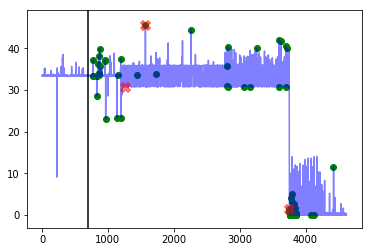




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 683, 690, 708, 718, 978, 992, 1006, 1014, 1043, 1266, 1554, 1873, 1880, 2082, 2088, 2426, 2438, 2445, 2650, 2801, 2971, 2996, 3032, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3447, 3463, 3515, 3523, 3579, 3580, 3858, 3860, 3953]


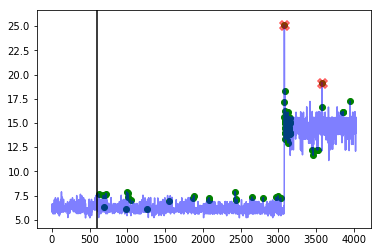




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 864, 946, 947, 948, 949, 950, 951, 1440, 1728, 2399, 2585, 2586, 2619, 2975, 3551, 3593, 3594, 3839]


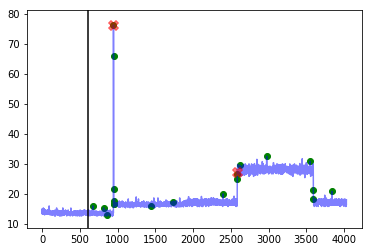




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [756, 864, 1152, 1327, 1338, 1341, 1349, 1440, 1598, 1622, 1633, 1728, 1895, 1928, 2180, 2226, 2459, 2761, 2776, 2792, 2795, 2802, 2880, 2881, 2988, 2989, 2990, 3000, 3096, 3097, 3156, 3615, 3931, 3948]


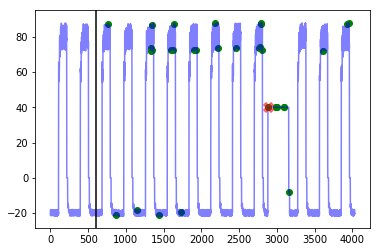




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1271, 1274, 1555, 2968, 2969, 2970, 2973, 2974, 2975, 3283, 3285, 3287, 3859, 3861, 3863]


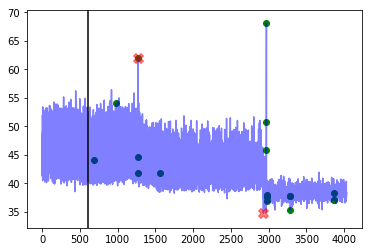




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 1775, 1843, 2338, 2671, 3258, 3567, 3568, 3572, 3573, 3580, 3581, 3582, 3859, 3860]


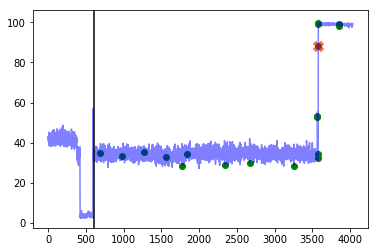




--- art_daily_nojump ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [758, 764, 864, 1152, 1440, 1728, 2172, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3617, 3627, 3632]


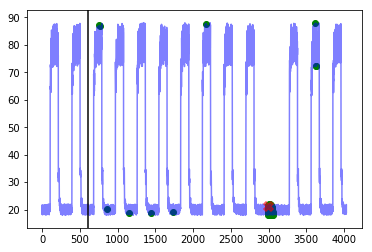




--- artificial_cd_1 ---
Corresponding window precision:  0.42857142857142855
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 288, 400, 402, 404, 405, 406, 407, 516, 576, 601]


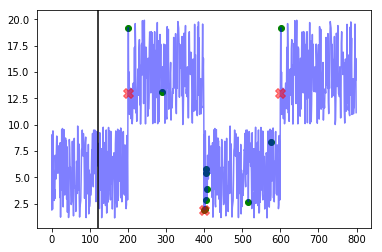




--- artificial_cd_2 ---
Corresponding window precision:  0.25
Corresponding window recall:  0.375
Corresponding window false positives:  9
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [276, 288, 400, 408, 411, 413, 415, 417, 419, 439, 440, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 842, 843, 844, 845, 848, 849, 850, 851, 852, 853, 854, 855, 864, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1029, 1030, 1031, 1033, 1034, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1044, 1045, 1046, 1047, 1048, 1049, 1052]


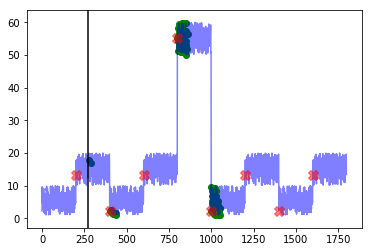




--- artificial_cd_3 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 203, 264, 288, 409, 417, 576, 864]


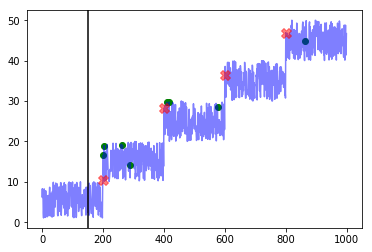

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.599999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.3225806451612903
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.3448275862068965



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 864, 1152, 1440, 1728, 3753, 3754, 3755, 3799]


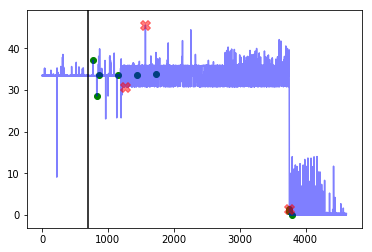




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


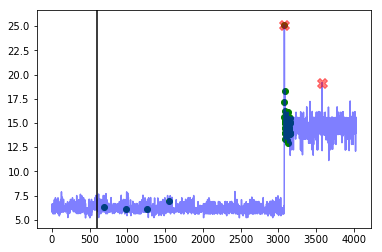




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 947, 948, 949, 950, 1440, 1728, 2585]


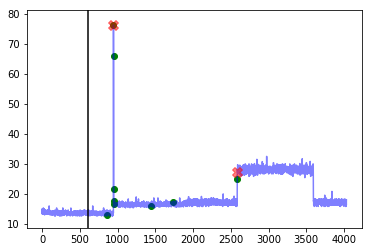




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 3096]


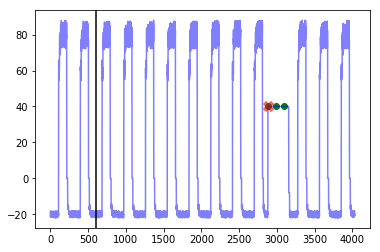




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


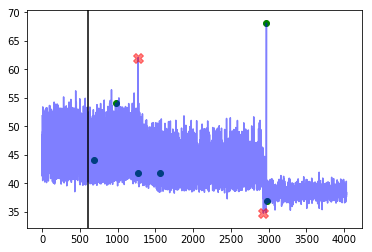




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


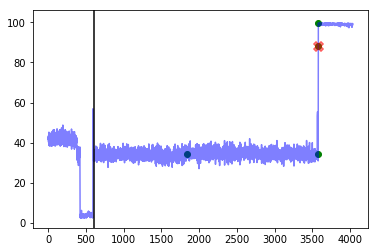




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


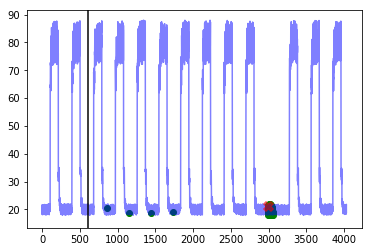




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


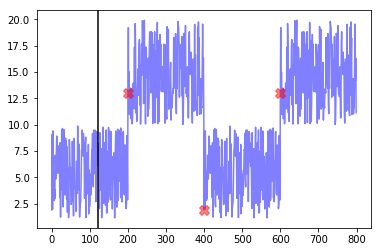




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


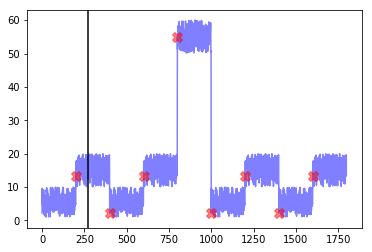




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


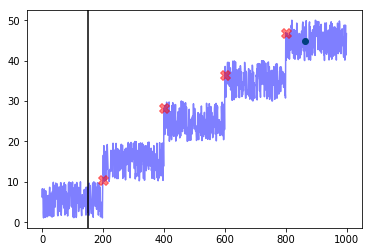

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.400000000000002
Best window threshold:  1.0
Corresponding window overall precision:  0.3225806451612903
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.3448275862068965



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 864, 1152, 1440, 1728, 3753, 3754, 3755, 3799]


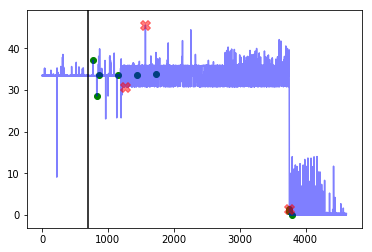




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


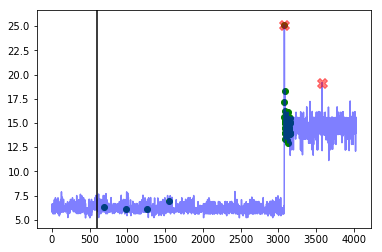




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 947, 948, 949, 950, 1440, 1728, 2585]


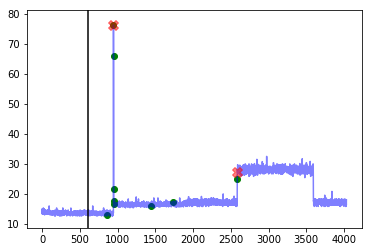




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 3096]


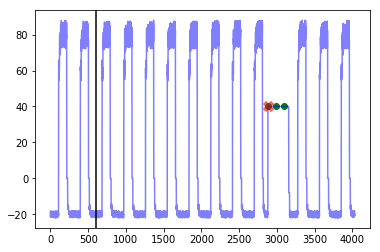




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


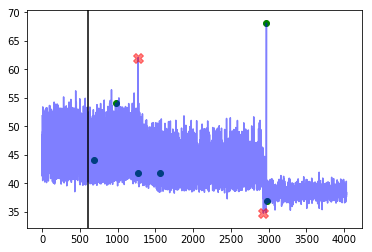




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


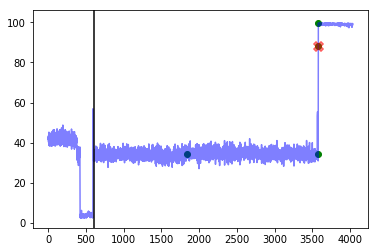




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


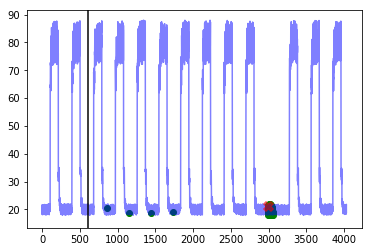




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


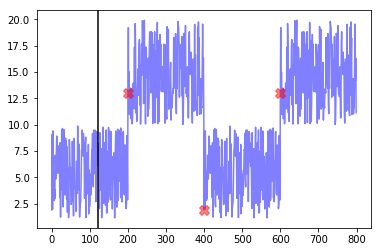




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


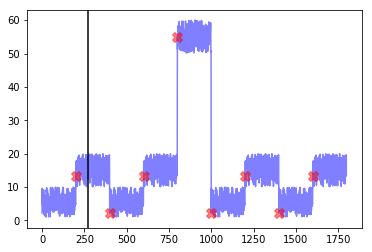




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


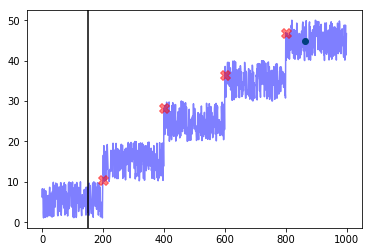

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.200000000000003
Best window threshold:  1.0
Corresponding window overall precision:  0.3225806451612903
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.3448275862068965



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 864, 1152, 1440, 1728, 3753, 3754, 3755, 3799]


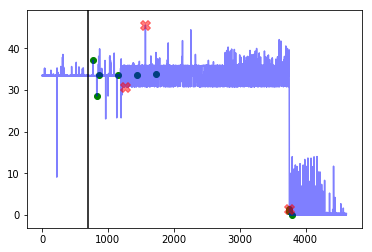




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


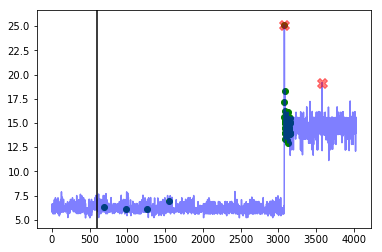




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 947, 948, 949, 950, 1440, 1728, 2585]


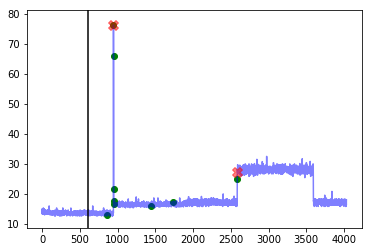




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 3096]


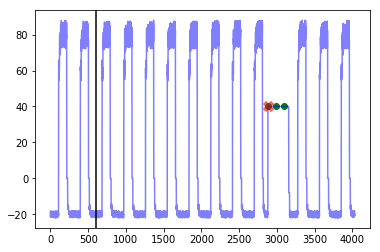




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


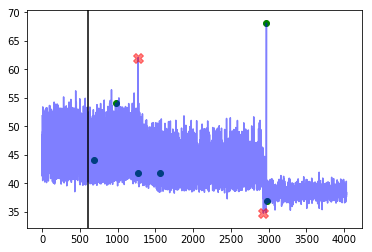




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


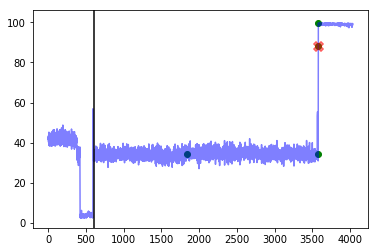




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


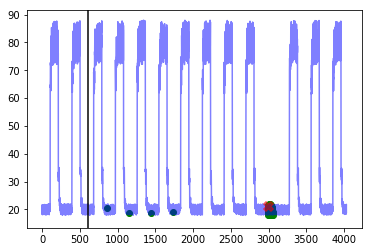




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


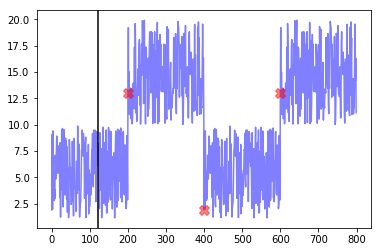




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


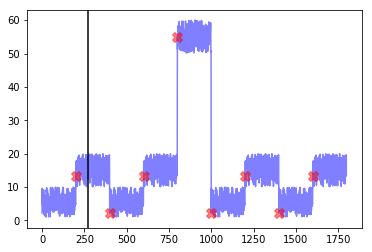




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


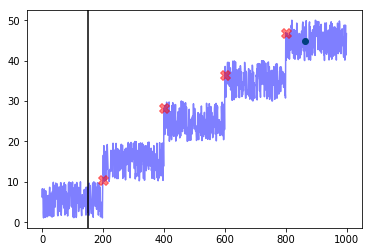

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  27.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3225806451612903
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.3448275862068965



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 864, 1152, 1440, 1728, 3753, 3754, 3755, 3799]


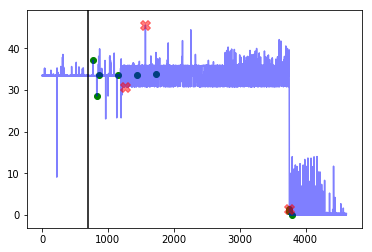




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


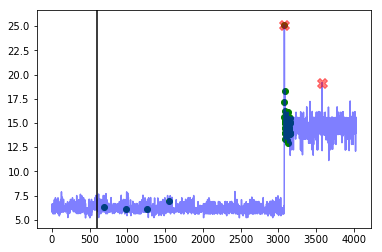




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 947, 948, 949, 950, 1440, 1728, 2585]


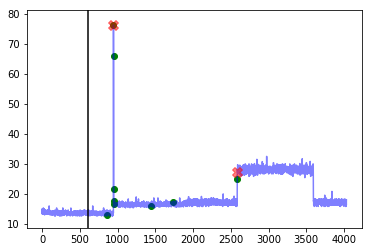




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 3096]


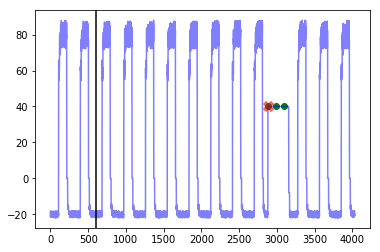




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


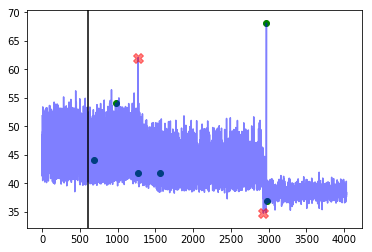




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


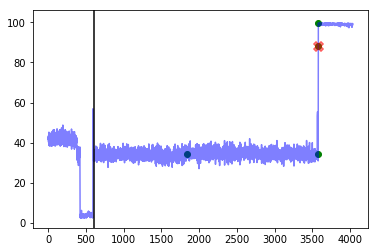




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


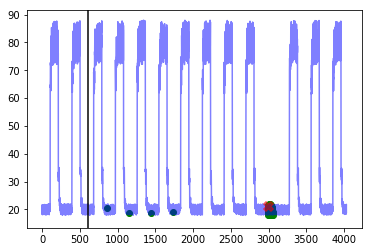




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


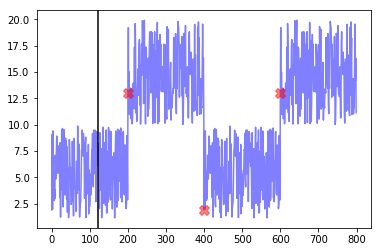




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


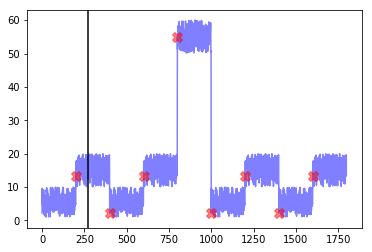




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


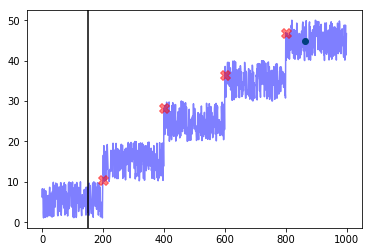

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.799999999999997
Best window threshold:  1.0
Corresponding window overall precision:  0.3225806451612903
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.3448275862068965



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 864, 1152, 1440, 1728, 3753, 3754, 3755, 3799]


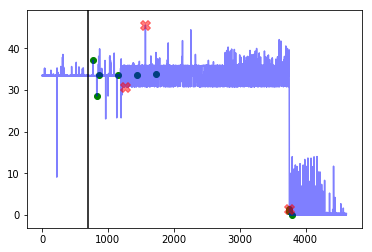




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


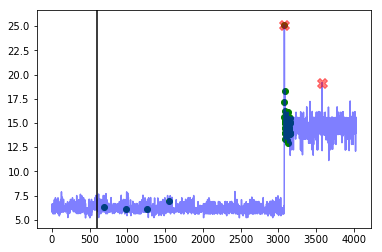




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 947, 948, 949, 950, 1440, 1728, 2585]


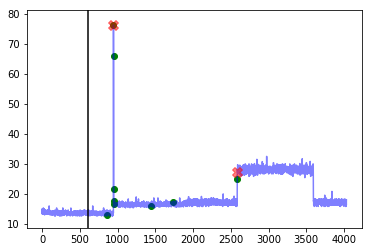




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 3096]


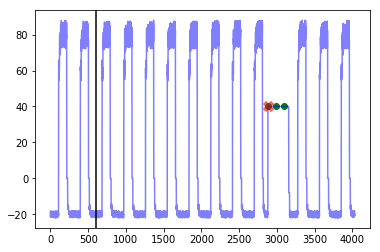




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


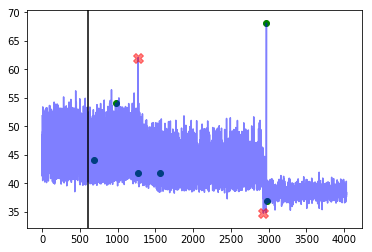




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


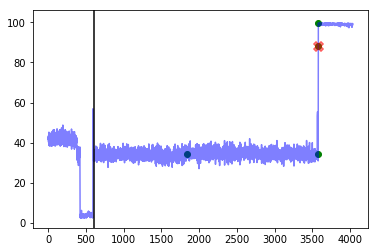




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


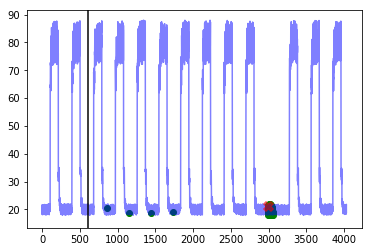




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


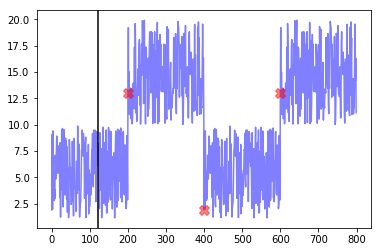




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


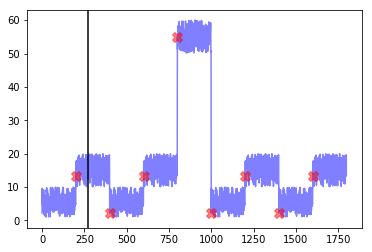




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


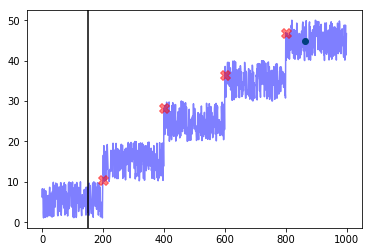

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  30.599999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.3225806451612903
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.3448275862068965



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 864, 1152, 1440, 1728, 3753, 3754, 3755, 3799]


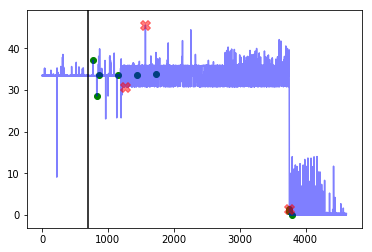




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


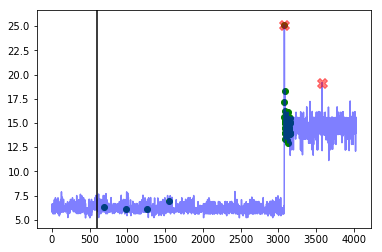




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 947, 948, 949, 950, 1440, 1728, 2585]


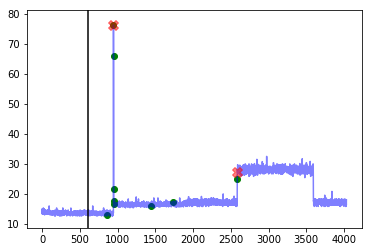




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 3096]


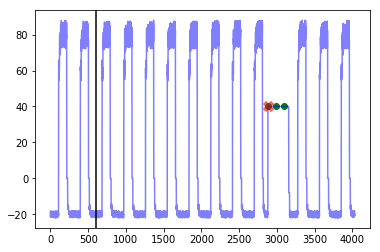




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


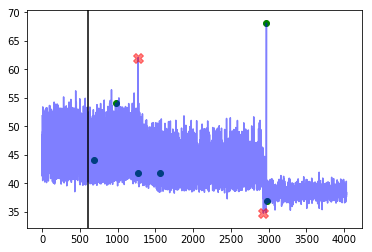




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


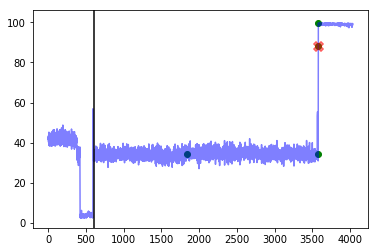




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


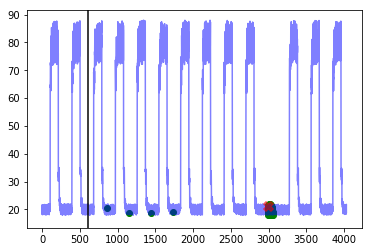




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


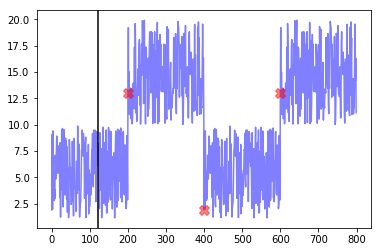




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


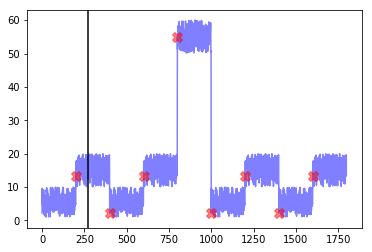




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


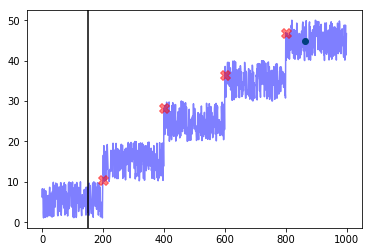

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  32.4
Best window threshold:  1.0
Corresponding window overall precision:  0.3225806451612903
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.3448275862068965



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 864, 1152, 1440, 1728, 3753, 3754, 3755, 3799]


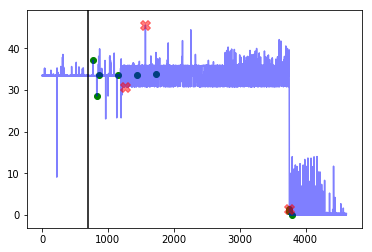




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


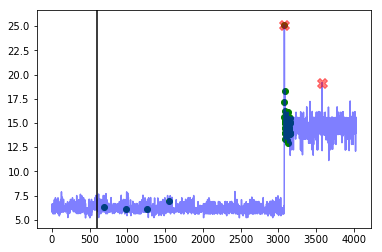




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 947, 948, 949, 950, 1440, 1728, 2585]


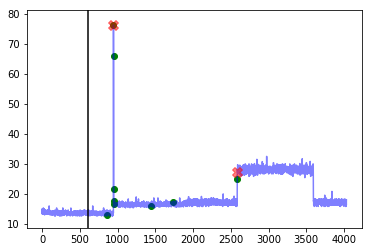




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 3096]


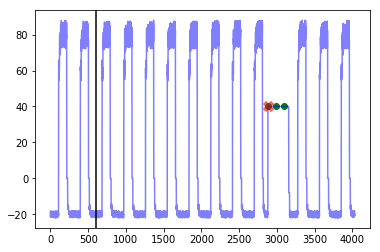




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


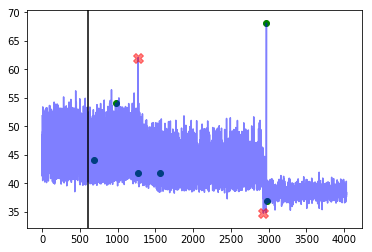




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


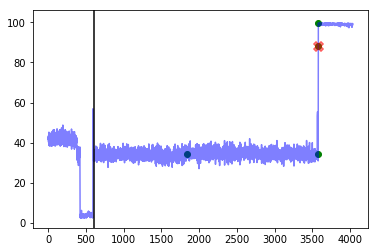




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


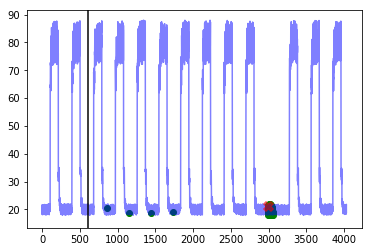




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


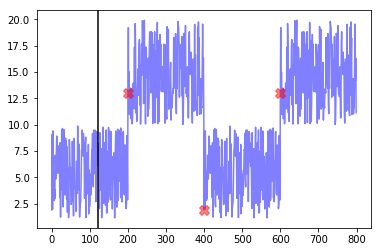




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


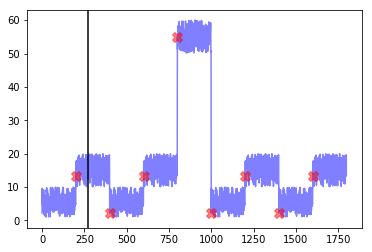




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


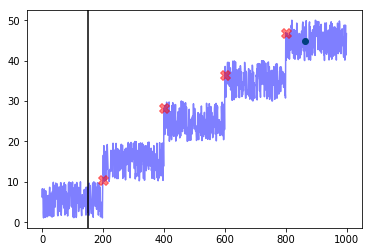

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  34.2
Best window threshold:  1.0
Corresponding window overall precision:  0.3225806451612903
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.3448275862068965



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 864, 1152, 1440, 1728, 3753, 3754, 3755, 3799]


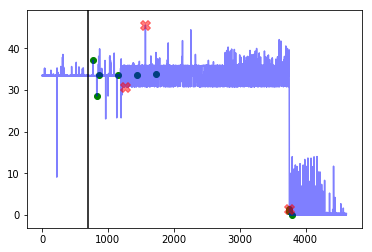




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


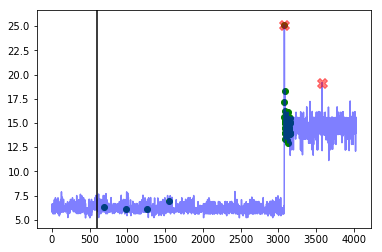




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 947, 948, 949, 950, 1440, 1728, 2585]


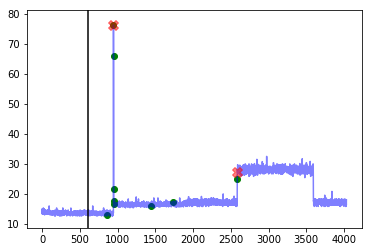




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 3096]


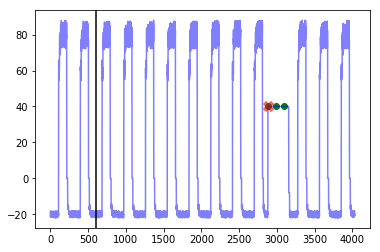




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


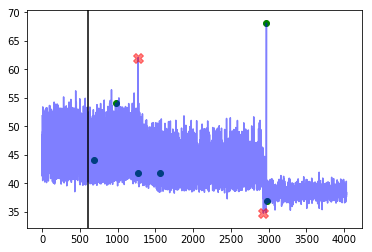




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


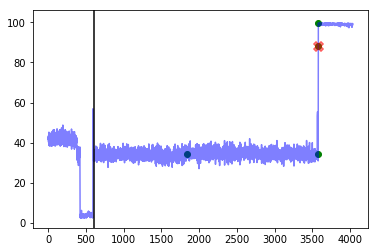




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


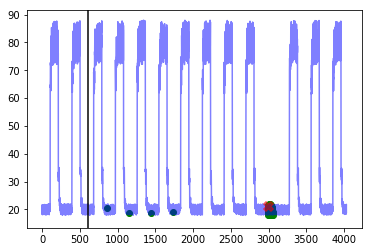




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


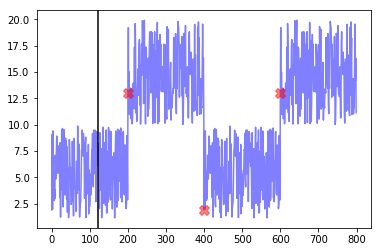




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


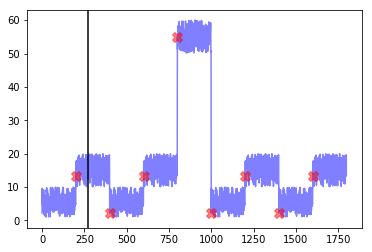




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


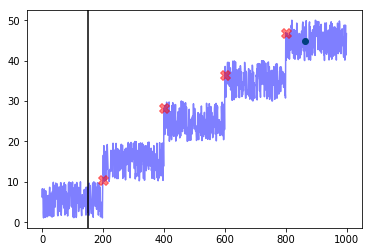

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  36.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3225806451612903
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.3448275862068965



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 864, 1152, 1440, 1728, 3753, 3754, 3755, 3799]


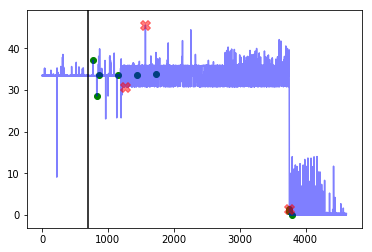




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


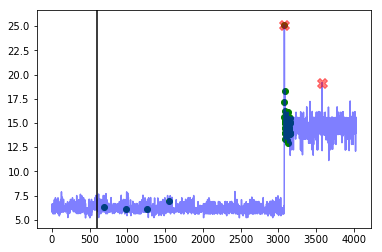




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 947, 948, 949, 950, 1440, 1728, 2585]


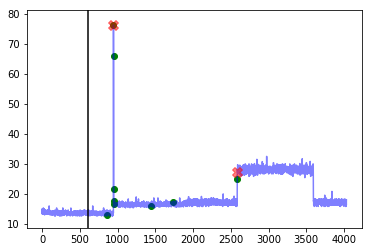




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 3096]


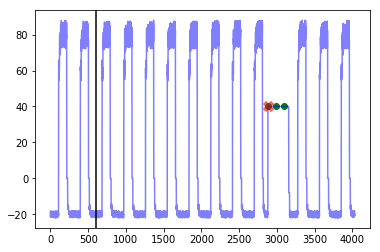




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


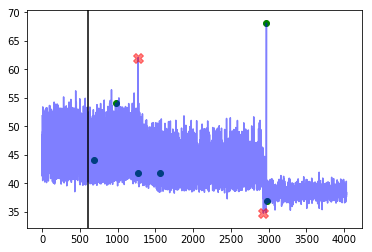




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


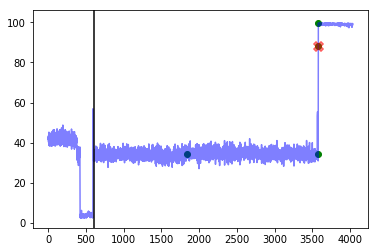




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


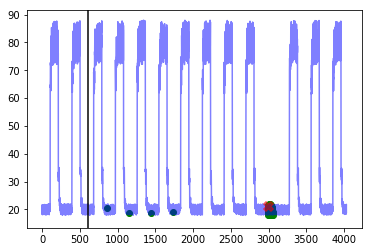




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


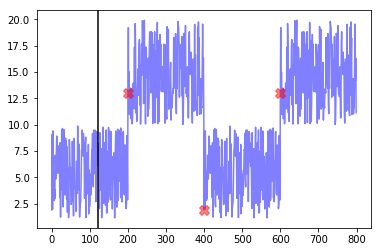




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


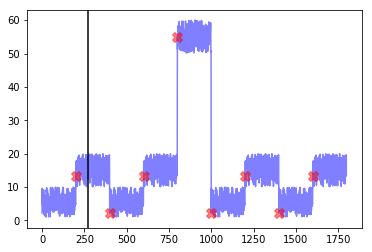




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


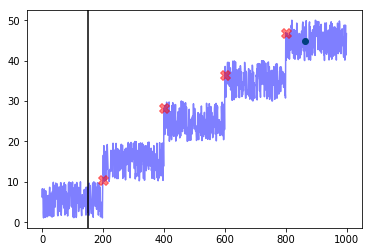

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 15.600000000000001
	 Best window threshold : 0.9996
	 Corresponding window overall precision : 0.21568627450980393
	 Corresponding window overall recall : 0.8148148148148148
	 Corresponding window overall F score : 0.34108527131782945
False Positive Weight:  0.2
	 Minimum number of mistakes : 21.599999999999998
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.3225806451612903
	 Corresponding window overall recall : 0.37037037037037035
	 Corresponding window overall F score : 0.3448275862068965
False Positive Weight:  0.3
	 Minimum number of mistakes : 23.400000000000002
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.3225806451612903
	 Corresponding window overall recall : 0.37037037037037035
	 Corresponding window overall F score : 0.3448275862068965
False Positive Weight:  0.4
	 Minimum number of mistakes : 25.200000000000003
	 Best window threshold : 1.0
	 Cor

In [17]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Facebook Prophet Results

In [18]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_prophet = joblib.load("anomaly_scores" + window_size + "/Prophet/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_prophet["Anomaly Scores"]

In [19]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.2: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.3: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.4: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.5: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.6: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.7: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.8: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.9: {'precision': 0.12121212121212122, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.8
Best window threshold:  0.9994
Corresponding window overall precision:  0.15873015873015872
Corresponding window overall recall:  0.7407407407407407
Corresponding window overall F score:  0.261437908496732



--- grok_asg_anomaly ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  13
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 856, 860, 873, 874, 875, 905, 953, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1042, 1043, 1089, 1090, 1095, 1096, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2840, 2878, 3257, 3600, 3625, 3700, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 377

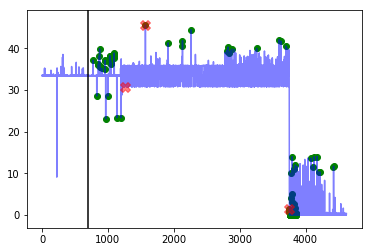




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 718, 992, 1006, 1362, 1417, 1880, 2011, 2426, 2577, 2595, 2801, 2927, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3447, 3463, 3580, 3669, 3673, 4023, 4024]


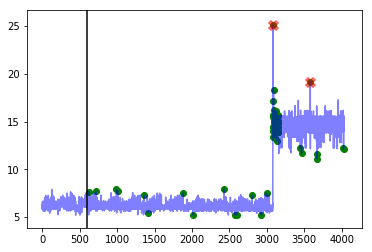




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 1277, 1480, 1535, 1642, 1823, 1907, 1923, 1931, 1933, 1941, 1949, 2111, 2399, 2543, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 2975, 3446, 3551, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 

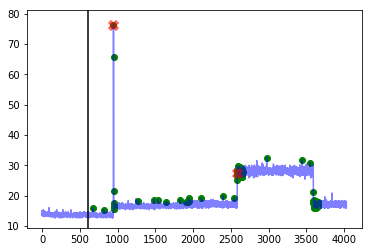




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [679, 680, 681, 682, 683, 684, 685, 686, 791, 792, 968, 969, 970, 971, 972, 973, 1077, 1079, 1080, 1081, 1082, 1257, 1258, 1259, 1260, 1364, 1366, 1367, 1368, 1369, 1370, 1547, 1548, 1655, 1656, 1657, 1834, 1835, 1942, 1944, 2122, 2123, 2230, 2232, 2411, 2412, 2519, 2699, 2807, 2808, 2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2896, 2897, 2898, 2899, 2900, 2901, 2902, 2903, 2904, 2905, 2906, 2907, 2908, 2909, 2910, 2911, 2912, 2913, 2914, 2915, 2916, 2917, 2918, 2919, 2920, 2921, 2922, 2923, 2924, 2925, 2926, 2927, 2928, 2929, 2930, 2931, 2932, 2933, 2934, 2935, 2936, 2937, 2938, 2939, 2940, 2941, 2942, 2943, 2944, 2945, 2946, 2947, 2948, 2949, 2950, 2951, 2952, 2953, 2954, 2955, 

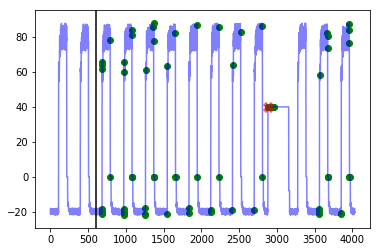




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970, 3668]


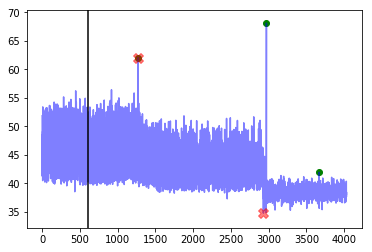




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [633, 640, 642, 643, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 660, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 901, 903, 904, 905, 906, 907, 908, 909, 910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920, 921, 922, 923, 924, 925, 926, 927, 928, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 94

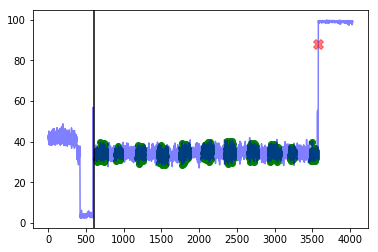




--- art_daily_nojump ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [681, 682, 683, 684, 788, 789, 790, 791, 792, 969, 970, 971, 972, 973, 1076, 1078, 1079, 1080, 1083, 1258, 1259, 1261, 1366, 1367, 1368, 1369, 1547, 1655, 1656, 1835, 1837, 1942, 1943, 1944, 1945, 2122, 2123, 2229, 2230, 2233, 2411, 2517, 2518, 2698, 2699, 2808, 2985, 2986, 2987, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3384, 3560, 3561, 3562, 3563, 3669, 3670, 3672, 3673, 36

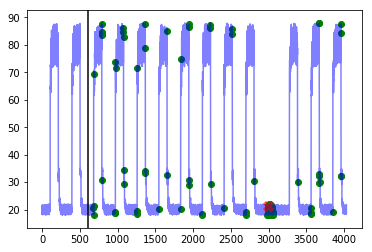




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 217, 219, 238]


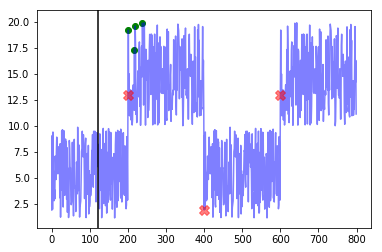




--- artificial_cd_2 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  16
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [315, 318, 319, 326, 330, 333, 335, 336, 344, 347, 351, 352, 354, 384, 385, 389, 390, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 790, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855, 1000, 1002, 1004, 1005, 1007, 1008, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1

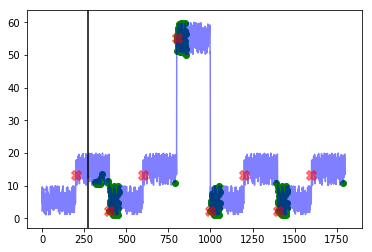




--- artificial_cd_3 ---
Corresponding window precision:  0.5714285714285714
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 208, 211, 214, 409, 417, 429, 601, 609, 611, 613, 626, 631, 632, 635, 651, 820]


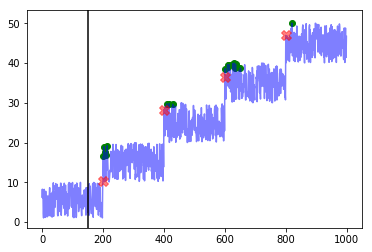

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.6
Best window threshold:  0.9994
Corresponding window overall precision:  0.15873015873015872
Corresponding window overall recall:  0.7407407407407407
Corresponding window overall F score:  0.261437908496732



--- grok_asg_anomaly ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  13
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 856, 860, 873, 874, 875, 905, 953, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1042, 1043, 1089, 1090, 1095, 1096, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2840, 2878, 3257, 3600, 3625, 3700, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 377

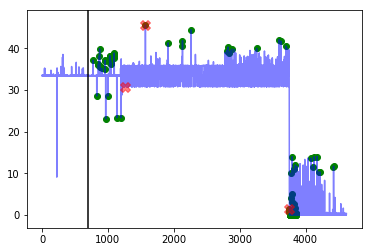




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 718, 992, 1006, 1362, 1417, 1880, 2011, 2426, 2577, 2595, 2801, 2927, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3447, 3463, 3580, 3669, 3673, 4023, 4024]


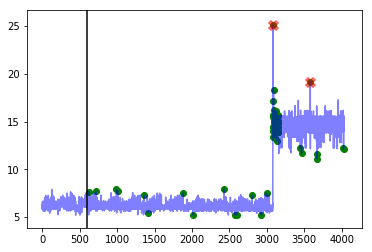




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 1277, 1480, 1535, 1642, 1823, 1907, 1923, 1931, 1933, 1941, 1949, 2111, 2399, 2543, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 2975, 3446, 3551, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 

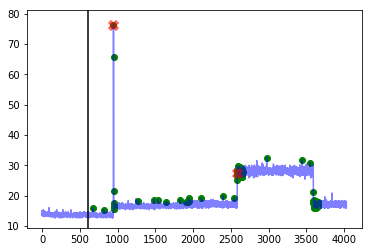




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [679, 680, 681, 682, 683, 684, 685, 686, 791, 792, 968, 969, 970, 971, 972, 973, 1077, 1079, 1080, 1081, 1082, 1257, 1258, 1259, 1260, 1364, 1366, 1367, 1368, 1369, 1370, 1547, 1548, 1655, 1656, 1657, 1834, 1835, 1942, 1944, 2122, 2123, 2230, 2232, 2411, 2412, 2519, 2699, 2807, 2808, 2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2896, 2897, 2898, 2899, 2900, 2901, 2902, 2903, 2904, 2905, 2906, 2907, 2908, 2909, 2910, 2911, 2912, 2913, 2914, 2915, 2916, 2917, 2918, 2919, 2920, 2921, 2922, 2923, 2924, 2925, 2926, 2927, 2928, 2929, 2930, 2931, 2932, 2933, 2934, 2935, 2936, 2937, 2938, 2939, 2940, 2941, 2942, 2943, 2944, 2945, 2946, 2947, 2948, 2949, 2950, 2951, 2952, 2953, 2954, 2955, 

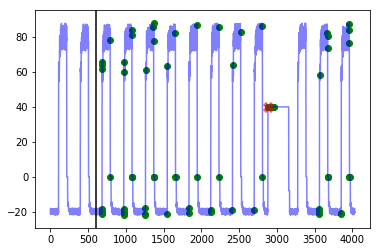




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970, 3668]


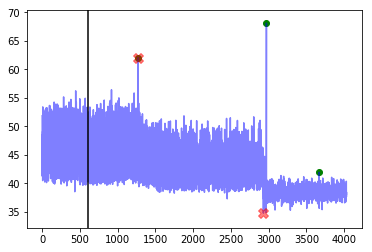




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [633, 640, 642, 643, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 660, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 901, 903, 904, 905, 906, 907, 908, 909, 910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920, 921, 922, 923, 924, 925, 926, 927, 928, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 94

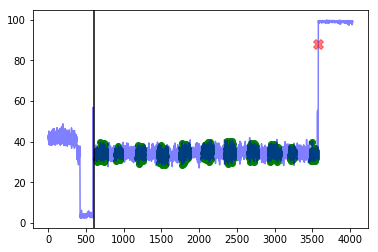




--- art_daily_nojump ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [681, 682, 683, 684, 788, 789, 790, 791, 792, 969, 970, 971, 972, 973, 1076, 1078, 1079, 1080, 1083, 1258, 1259, 1261, 1366, 1367, 1368, 1369, 1547, 1655, 1656, 1835, 1837, 1942, 1943, 1944, 1945, 2122, 2123, 2229, 2230, 2233, 2411, 2517, 2518, 2698, 2699, 2808, 2985, 2986, 2987, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3384, 3560, 3561, 3562, 3563, 3669, 3670, 3672, 3673, 36

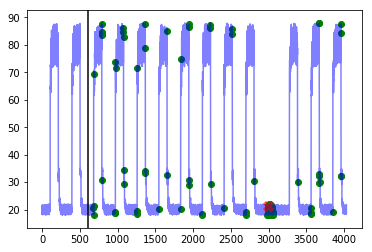




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 217, 219, 238]


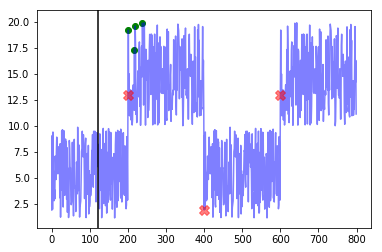




--- artificial_cd_2 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  16
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [315, 318, 319, 326, 330, 333, 335, 336, 344, 347, 351, 352, 354, 384, 385, 389, 390, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 790, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855, 1000, 1002, 1004, 1005, 1007, 1008, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1

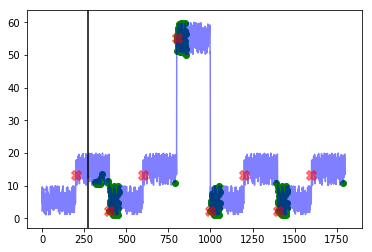




--- artificial_cd_3 ---
Corresponding window precision:  0.5714285714285714
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 208, 211, 214, 409, 417, 429, 601, 609, 611, 613, 626, 631, 632, 635, 651, 820]


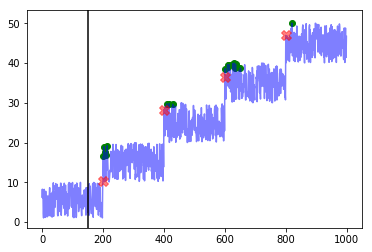

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.8
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.18518518518518517
Corresponding window overall F score:  0.2631578947368421



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 3753, 3754, 3755, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793]


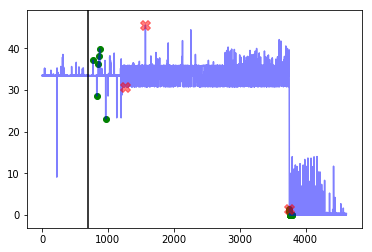




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


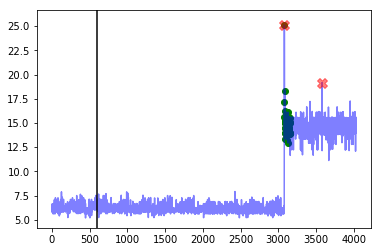




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

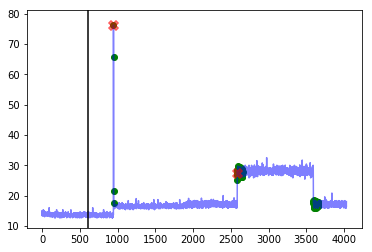




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


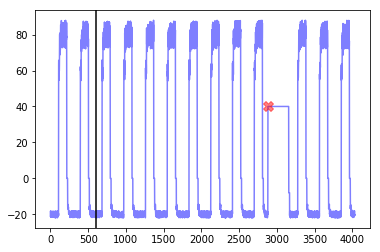




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


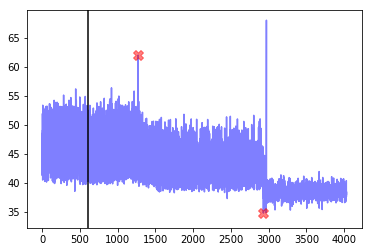




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1543, 1549, 1551, 1554]


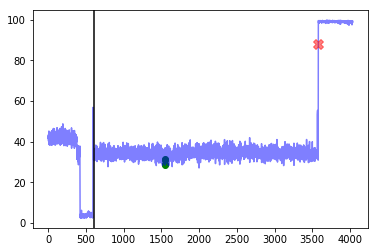




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


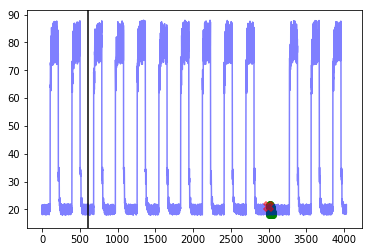




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


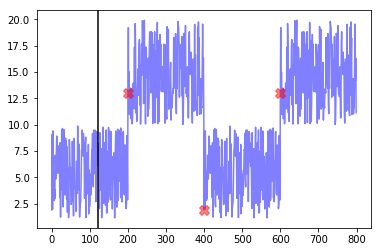




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


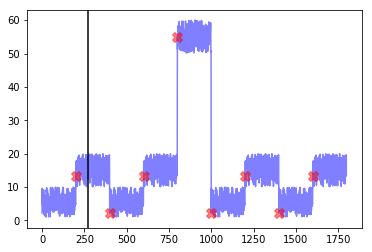




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


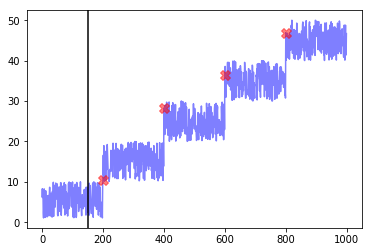

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.4
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.18518518518518517
Corresponding window overall F score:  0.2631578947368421



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 3753, 3754, 3755, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793]


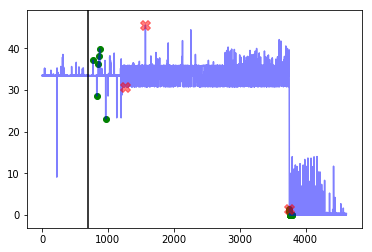




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


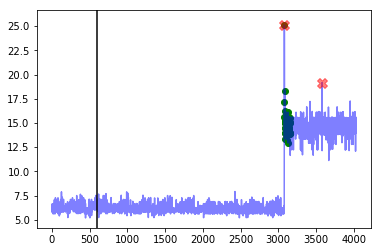




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

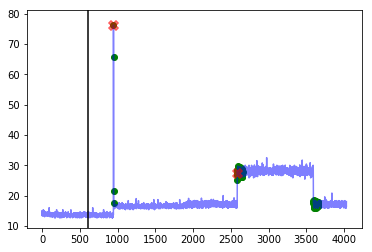




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


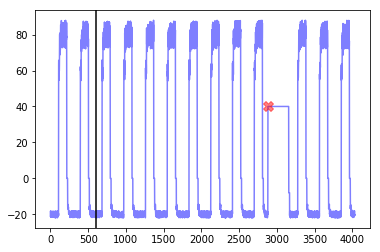




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


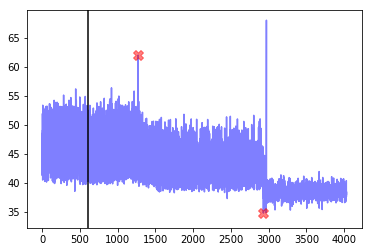




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1543, 1549, 1551, 1554]


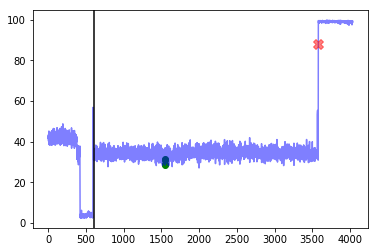




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


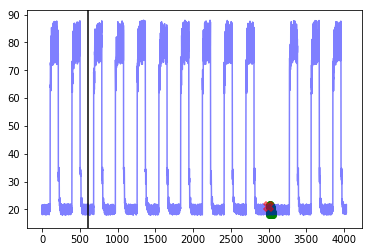




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


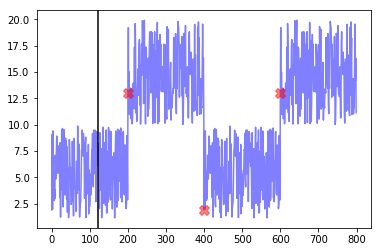




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


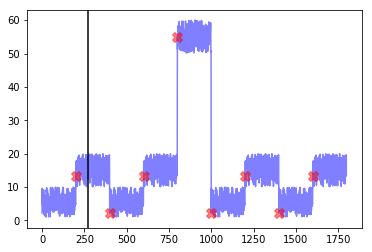




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


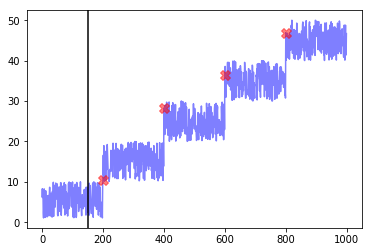

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.0
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.18518518518518517
Corresponding window overall F score:  0.2631578947368421



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 3753, 3754, 3755, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793]


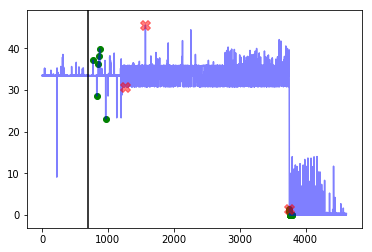




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


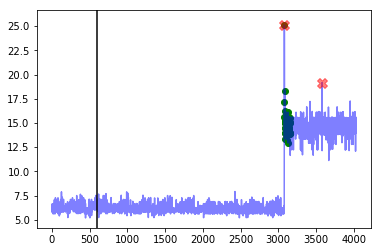




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

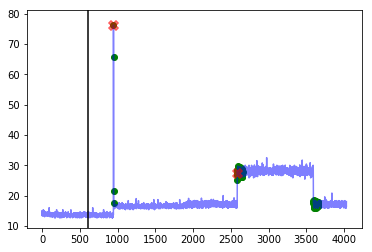




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


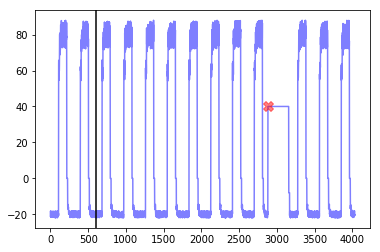




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


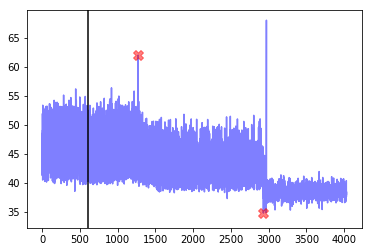




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1543, 1549, 1551, 1554]


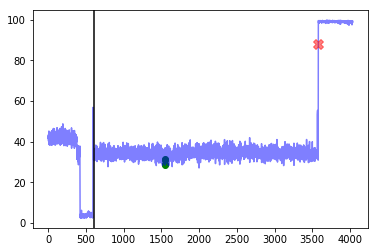




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


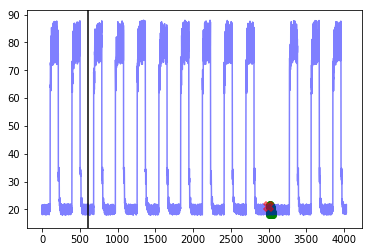




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


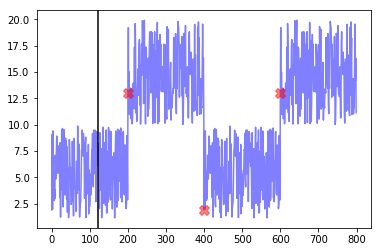




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


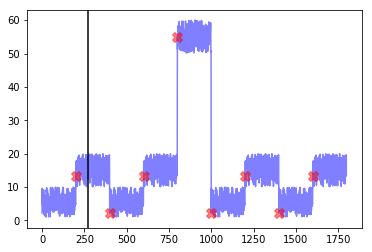




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


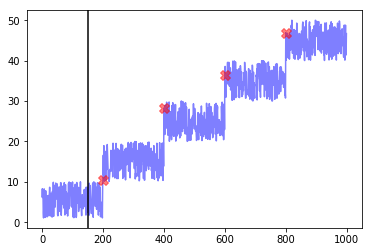

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.6
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.18518518518518517
Corresponding window overall F score:  0.2631578947368421



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 3753, 3754, 3755, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793]


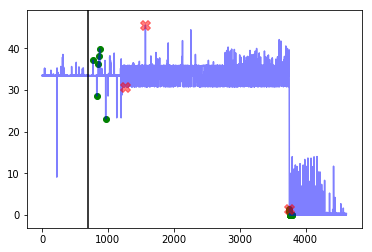




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


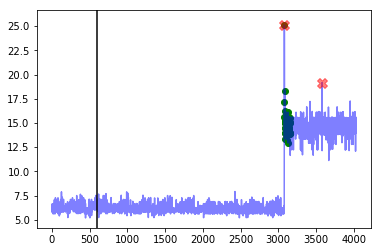




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

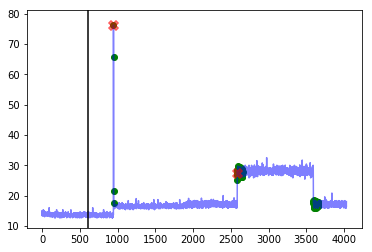




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


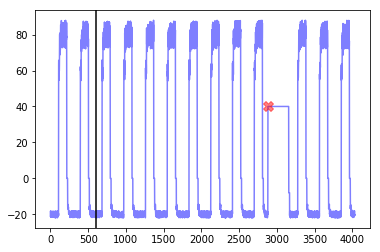




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


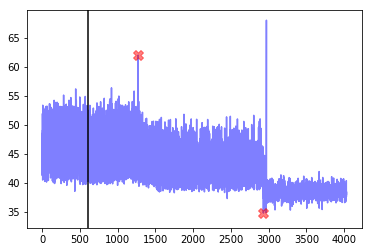




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1543, 1549, 1551, 1554]


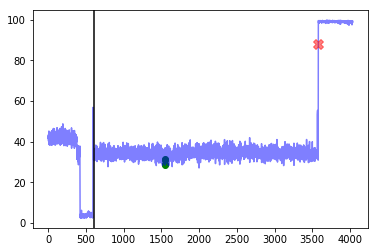




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


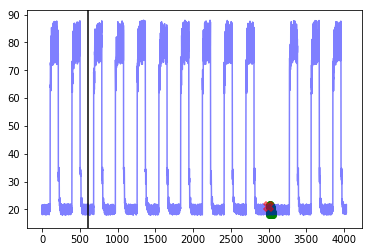




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


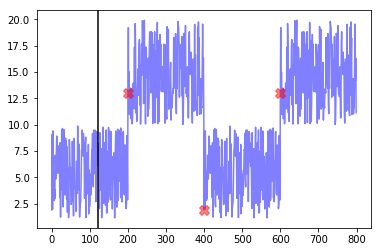




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


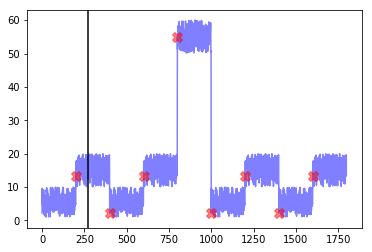




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


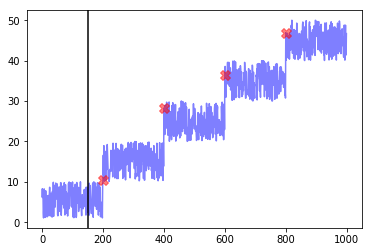

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.2
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.18518518518518517
Corresponding window overall F score:  0.2631578947368421



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 3753, 3754, 3755, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793]


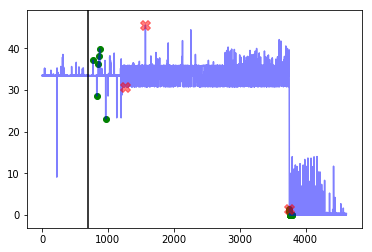




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


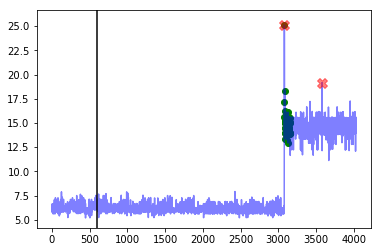




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

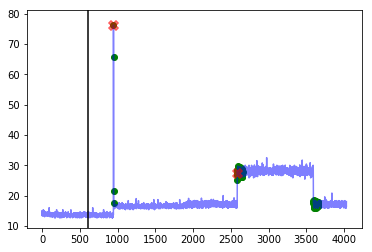




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


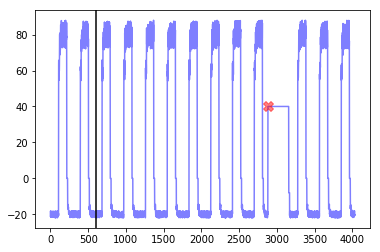




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


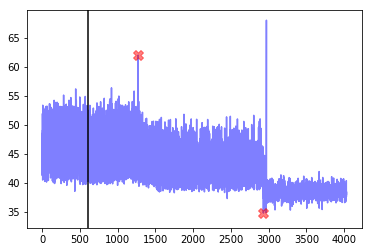




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1543, 1549, 1551, 1554]


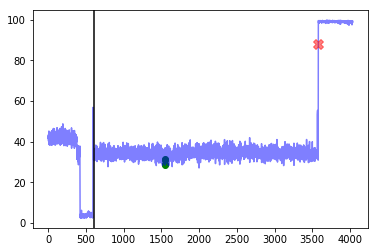




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


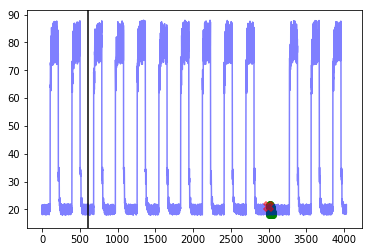




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


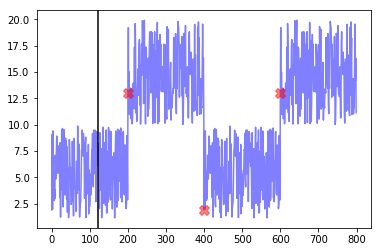




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


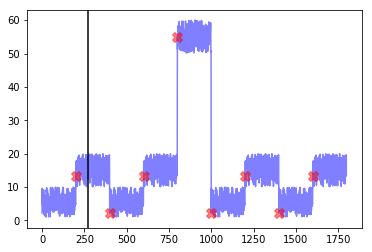




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


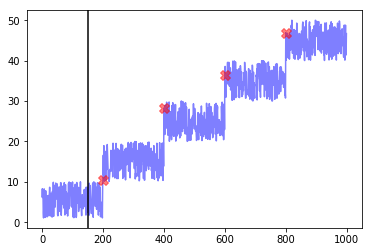

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.8
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.18518518518518517
Corresponding window overall F score:  0.2631578947368421



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 3753, 3754, 3755, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793]


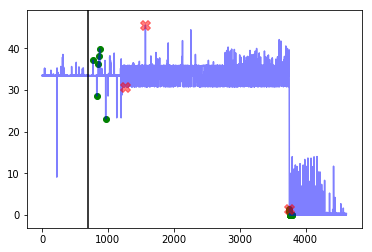




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


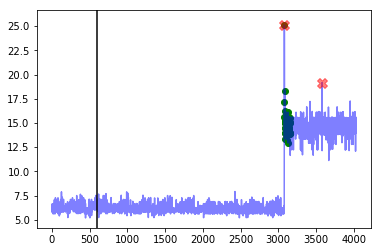




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

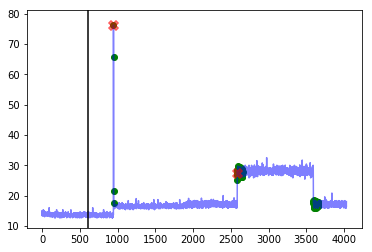




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


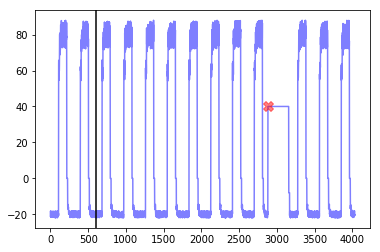




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


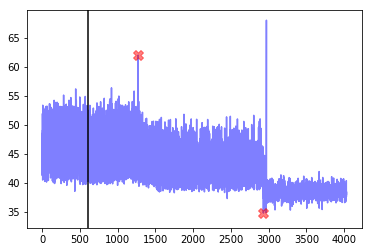




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1543, 1549, 1551, 1554]


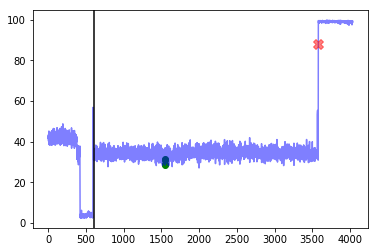




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


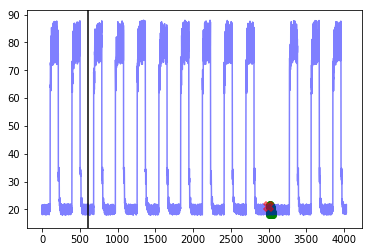




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


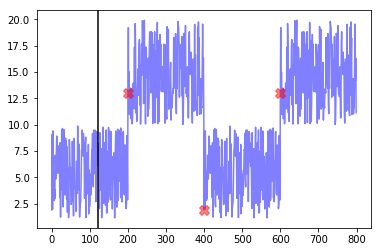




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


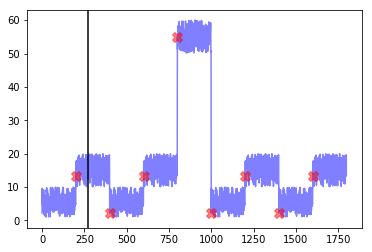




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


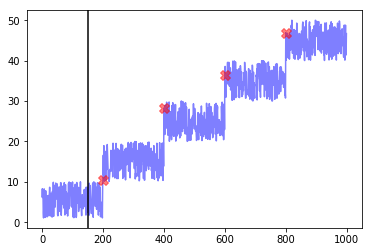

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  27.4
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.18518518518518517
Corresponding window overall F score:  0.2631578947368421



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 3753, 3754, 3755, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793]


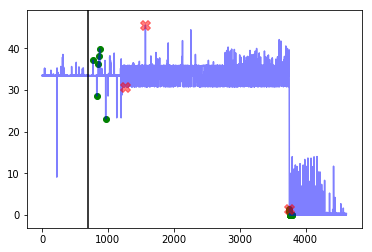




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


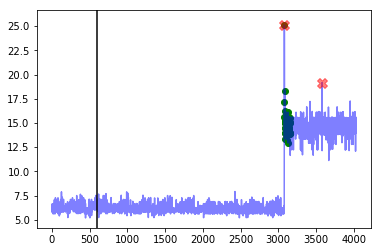




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

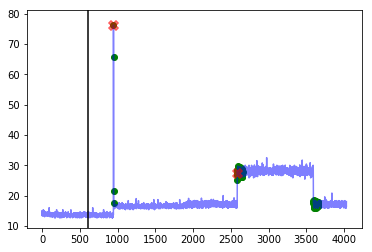




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


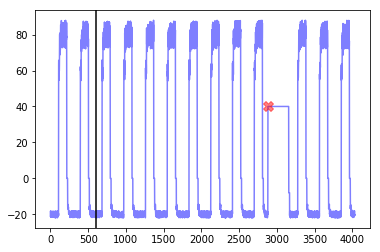




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


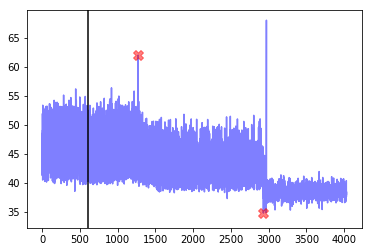




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1543, 1549, 1551, 1554]


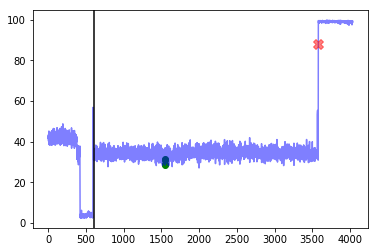




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


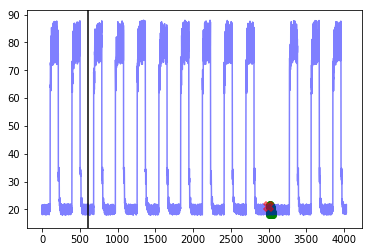




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


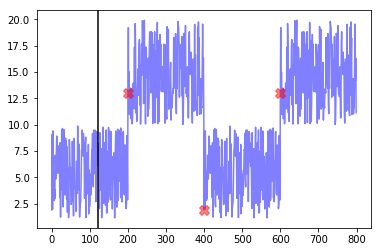




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


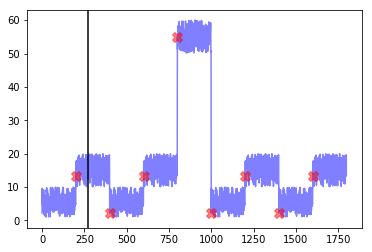




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


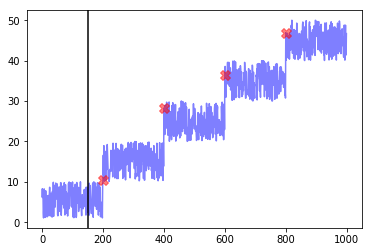

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.0
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.18518518518518517
Corresponding window overall F score:  0.2631578947368421



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 3753, 3754, 3755, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793]


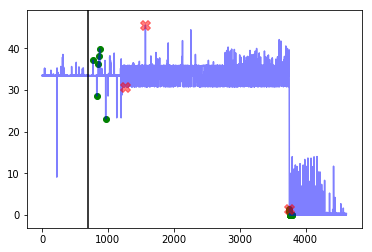




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


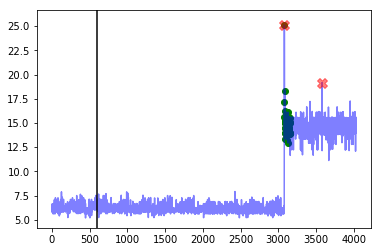




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

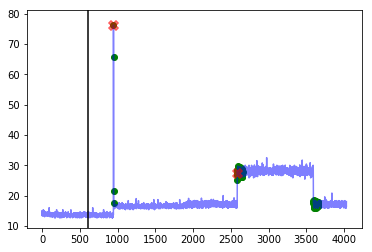




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


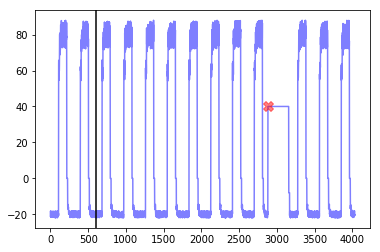




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


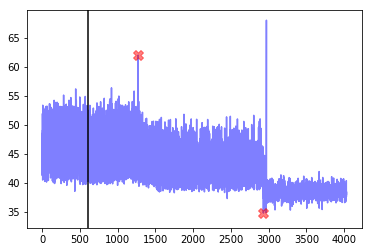




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1543, 1549, 1551, 1554]


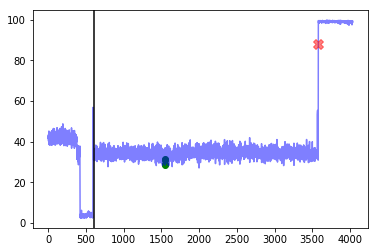




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055]


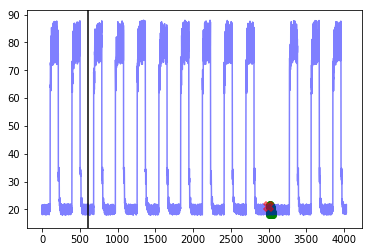




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


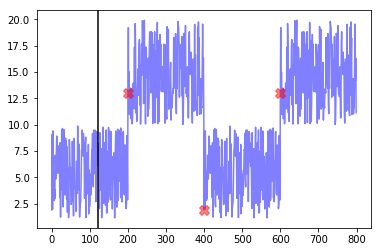




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


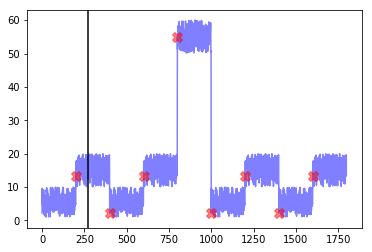




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


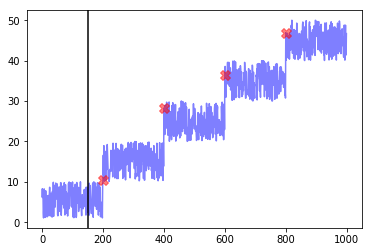

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 14.8
	 Best window threshold : 0.9994
	 Corresponding window overall precision : 0.15873015873015872
	 Corresponding window overall recall : 0.7407407407407407
	 Corresponding window overall F score : 0.261437908496732
False Positive Weight:  0.2
	 Minimum number of mistakes : 22.6
	 Best window threshold : 0.9994
	 Corresponding window overall precision : 0.15873015873015872
	 Corresponding window overall recall : 0.7407407407407407
	 Corresponding window overall F score : 0.261437908496732
False Positive Weight:  0.3
	 Minimum number of mistakes : 23.8
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.45454545454545453
	 Corresponding window overall recall : 0.18518518518518517
	 Corresponding window overall F score : 0.2631578947368421
False Positive Weight:  0.4
	 Minimum number of mistakes : 24.4
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.454545454545454

In [20]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HTM Results

In [21]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/HTM/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [22]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.42857142857142855, 'recall': 0.75},
 0.2: {'precision': 0.5, 'recall': 0.75},
 0.3: {'precision': 0.6, 'recall': 0.75},
 0.4: {'precision': 0.6, 'recall': 0.75},
 0.5: {'precision': 0.75, 'recall': 0.75},
 0.6: {'precision': 0.5, 'recall': 0.25},
 0.7: {'precision': 0.5, 'recall': 0.25},
 0.8: {'precision': 0.5, 'recall': 0.25},
 0.9: {'precision': 0.5, 'recall': 0.25},
 1.0: {'precision': 1.0, 'recall': 0.25}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  12.6
Best window threshold:  0.0562
Corresponding window overall precision:  0.1864406779661017
Corresponding window overall recall:  0.8148148148148148
Corresponding window overall F score:  0.30344827586206896



--- grok_asg_anomaly ---
Corresponding window precision:  0.15789473684210525
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [773, 774, 775, 776, 777, 778, 779, 780, 781, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 874, 875, 876, 877, 878, 879, 880, 881, 882, 883, 884, 955, 956, 957, 958, 959, 960, 961, 962, 963, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035,

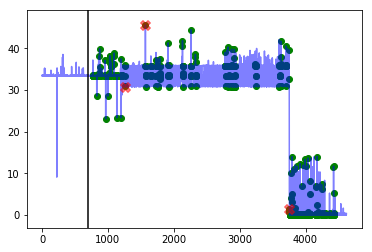




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [993, 994, 995, 996, 997, 998, 999, 1000, 1001, 2427, 2428, 2429, 2430, 2431, 2432, 2433, 2434, 2435, 2436, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3464, 3465, 3466, 3467, 3468, 3469, 3470, 3471, 3472, 3473, 3519, 3520, 3521, 3522, 3523, 3524, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3669, 3670, 3671, 3672, 3673, 367

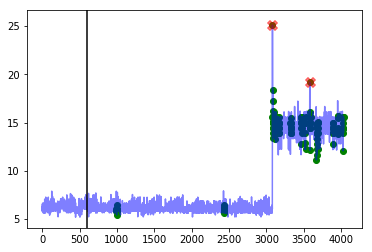




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3840, 3841, 3842, 3843, 3844, 3845, 3846, 3847, 3848, 3849]


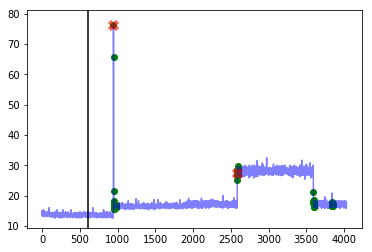




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 992, 996, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393, 1548, 1549, 1550, 1551, 1552, 1553, 1554, 1555, 1556, 1557, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665, 1669, 1670, 1671, 1672, 1673, 1674, 1675, 1676, 1677,

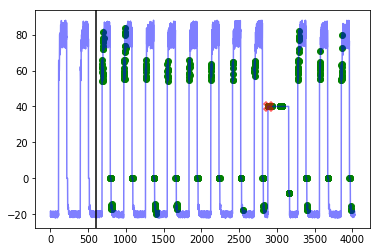




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [669, 670, 671, 672, 673, 674, 675, 676, 677, 725, 726, 727, 730, 731, 732, 733, 734, 778, 787, 885, 886, 887, 888, 889, 890, 909, 919, 920, 921, 922, 923, 924, 925, 926, 927, 928, 999, 1000, 1001, 1016, 1017, 1018, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1339, 1342, 1354, 1361, 1362, 1363, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1376, 1377, 1378, 1379, 1384, 1385, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1449, 1450, 1451, 1452, 1453, 1454, 1455, 1456, 1457, 1458, 1459, 1460, 1461, 1462, 1463, 1464, 1465, 1466, 1467, 1468, 1469, 1470, 1471, 1472, 1473, 1474, 1

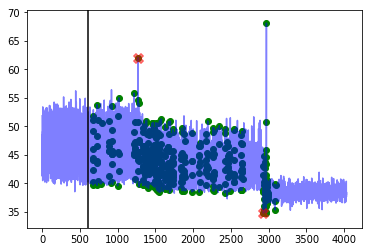




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [605, 606, 607, 608, 609, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592]


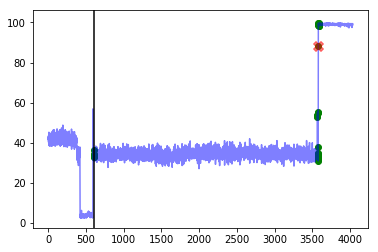




--- art_daily_nojump ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1092, 1100, 1101, 1103, 1104, 1105, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1548, 1549, 1550, 1551, 1552, 1553, 1554, 1555, 1556, 1557, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665, 1673, 1674, 1675, 1676, 1677, 1678, 1679, 1680, 1836, 1837, 1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1960, 1966, 1967, 1968, 1969, 2232, 2233, 2234, 2235, 2

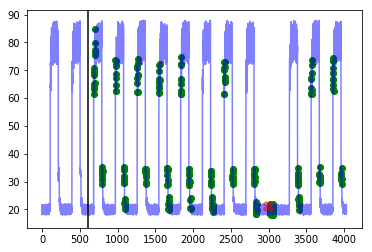




--- artificial_cd_1 ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [388, 389, 390, 391, 392, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 554, 555, 556, 557, 558, 559, 560, 561, 562, 563, 595, 596, 597, 598, 599, 600, 601, 602, 603, 604, 608, 609, 623, 624, 625, 626, 627, 628, 648, 649, 650, 651, 657, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 680, 681, 682, 683, 685, 686, 687, 688, 689, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 721, 722, 723, 724, 725, 761, 762, 763, 764, 765, 766, 767, 769, 770, 773, 774, 775, 776, 777, 778]


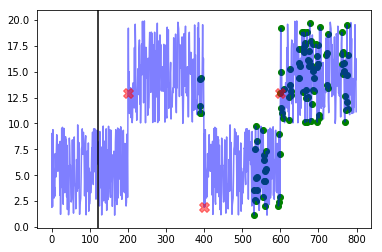




--- artificial_cd_2 ---
Corresponding window precision:  0.29411764705882354
Corresponding window recall:  0.625
Corresponding window false positives:  12
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 450, 453, 454, 455, 456, 457, 458, 459, 461, 462, 464, 465, 466, 467, 468, 469, 470, 479, 480, 481, 484, 485, 486, 487, 488, 524, 603, 604, 645, 646, 650, 652, 654, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 833, 834, 835, 836, 867, 869, 870, 871, 872, 873, 874, 875, 876, 881, 882, 883, 884, 885, 886, 887, 888, 889, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409]


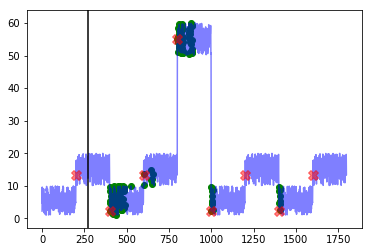




--- artificial_cd_3 ---
Corresponding window precision:  0.42857142857142855
Corresponding window recall:  0.75
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 486, 487, 488, 489, 490, 491, 492, 498, 601, 602, 603, 604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 614, 615, 616, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836]


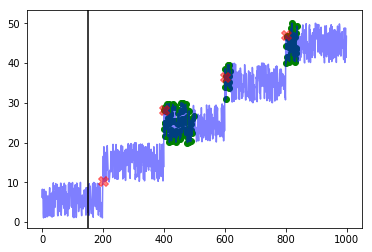

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.8
Best window threshold:  0.3634
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.5245901639344261



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [831, 875, 967, 1028, 1029, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 2132, 2133, 2136, 3754, 3775, 3776, 3796, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3941, 4426]


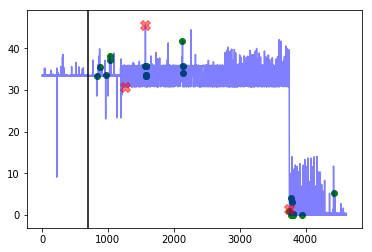




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2427, 2436, 3080, 3081, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3673, 3674]


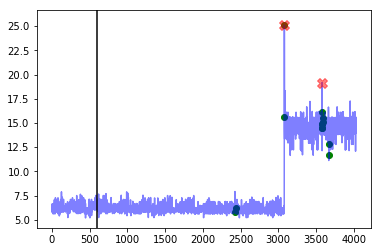




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586]


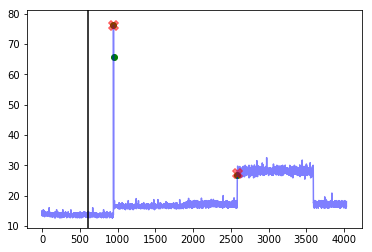




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [693, 2813, 2814, 2815, 2881, 2891, 3279, 3289, 3386, 3387, 3398, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3860, 3861]


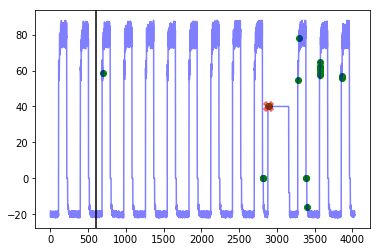




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1516, 1517, 1518, 1519, 1521, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1675, 2929, 2930, 2946, 2947, 2970]


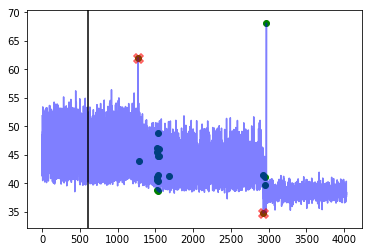




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3568, 3569, 3579, 3580, 3581]


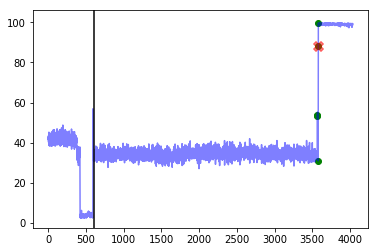




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 692, 693, 2254, 2255, 2256, 2258, 2259, 3025, 3026, 3045]


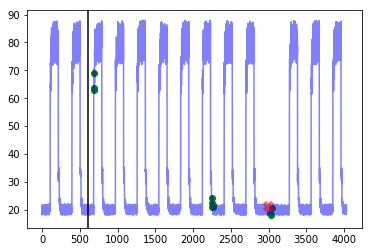




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


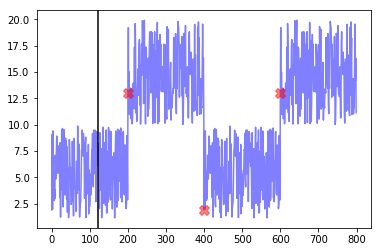




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [406, 431, 432, 434, 801, 826, 827, 828]


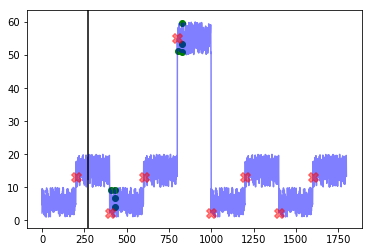




--- artificial_cd_3 ---
Corresponding window precision:  0.6
Corresponding window recall:  0.75
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [401, 434, 438, 458, 459, 460, 604, 605, 606, 611, 806, 807, 808, 809, 810]


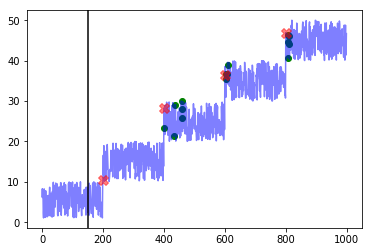

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.7
Best window threshold:  0.3634
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.5245901639344261



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [831, 875, 967, 1028, 1029, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 2132, 2133, 2136, 3754, 3775, 3776, 3796, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3941, 4426]


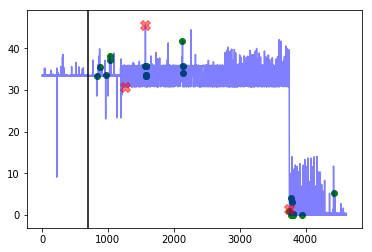




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2427, 2436, 3080, 3081, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3673, 3674]


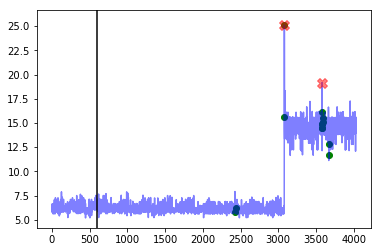




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586]


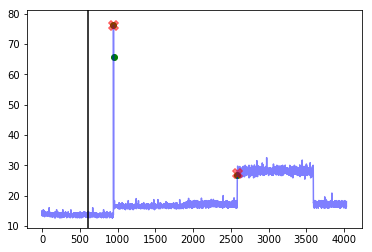




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [693, 2813, 2814, 2815, 2881, 2891, 3279, 3289, 3386, 3387, 3398, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3860, 3861]


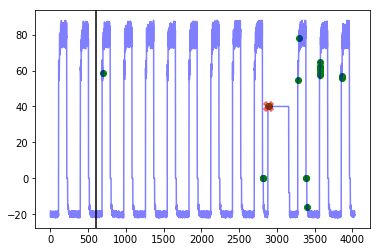




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1516, 1517, 1518, 1519, 1521, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1675, 2929, 2930, 2946, 2947, 2970]


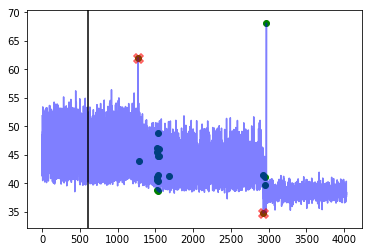




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3568, 3569, 3579, 3580, 3581]


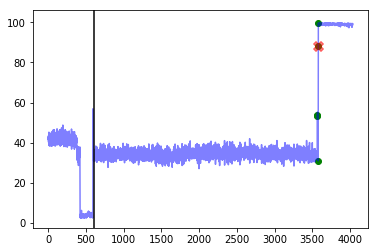




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 692, 693, 2254, 2255, 2256, 2258, 2259, 3025, 3026, 3045]


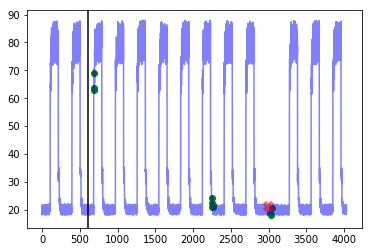




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


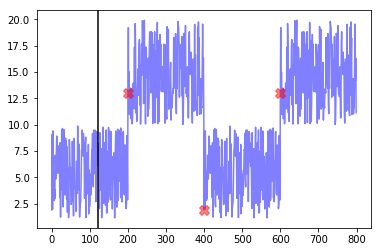




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [406, 431, 432, 434, 801, 826, 827, 828]


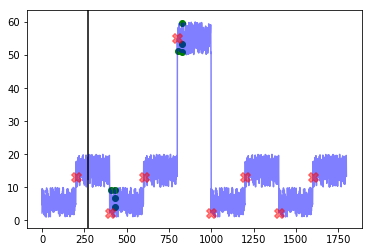




--- artificial_cd_3 ---
Corresponding window precision:  0.6
Corresponding window recall:  0.75
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [401, 434, 438, 458, 459, 460, 604, 605, 606, 611, 806, 807, 808, 809, 810]


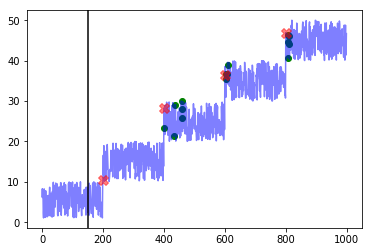

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.6
Best window threshold:  0.3634
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.5245901639344261



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [831, 875, 967, 1028, 1029, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 2132, 2133, 2136, 3754, 3775, 3776, 3796, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3941, 4426]


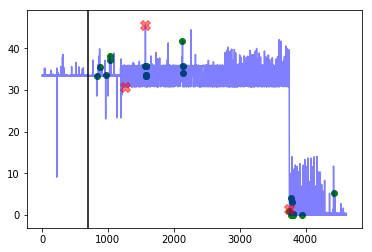




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2427, 2436, 3080, 3081, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3673, 3674]


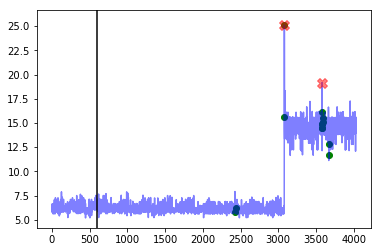




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586]


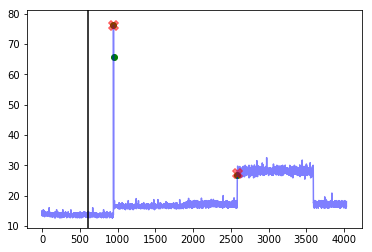




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [693, 2813, 2814, 2815, 2881, 2891, 3279, 3289, 3386, 3387, 3398, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3860, 3861]


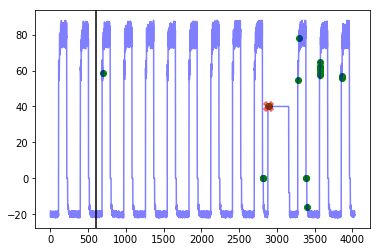




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1516, 1517, 1518, 1519, 1521, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1675, 2929, 2930, 2946, 2947, 2970]


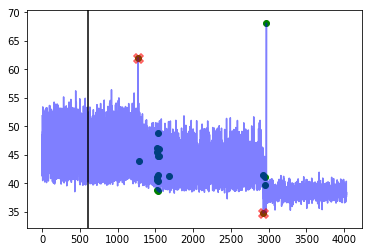




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3568, 3569, 3579, 3580, 3581]


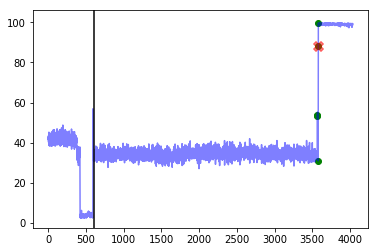




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 692, 693, 2254, 2255, 2256, 2258, 2259, 3025, 3026, 3045]


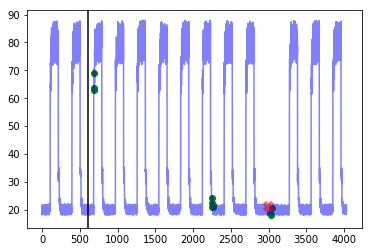




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


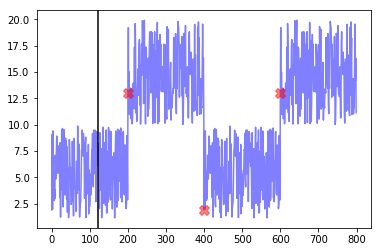




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [406, 431, 432, 434, 801, 826, 827, 828]


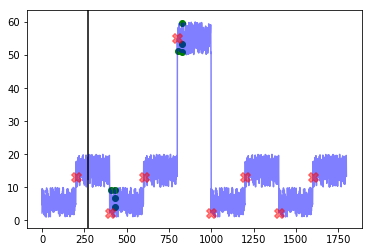




--- artificial_cd_3 ---
Corresponding window precision:  0.6
Corresponding window recall:  0.75
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [401, 434, 438, 458, 459, 460, 604, 605, 606, 611, 806, 807, 808, 809, 810]


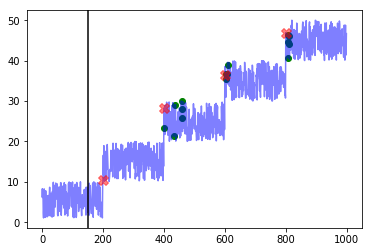

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.5
Best window threshold:  0.6084
Corresponding window overall precision:  0.7333333333333333
Corresponding window overall recall:  0.4074074074074074
Corresponding window overall F score:  0.5238095238095238



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [831, 875, 1029, 3754, 3799]


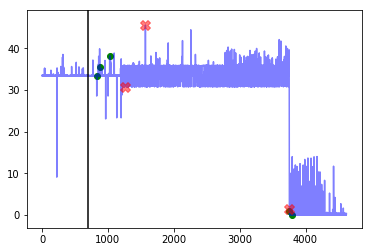




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081, 3674]


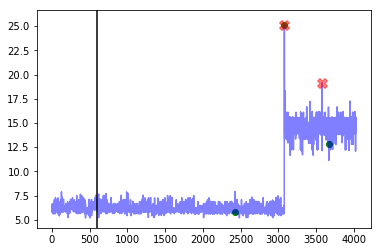




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


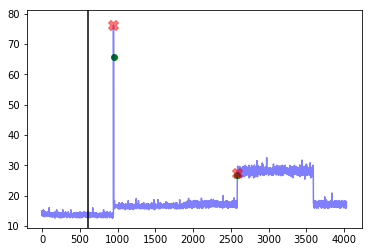




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


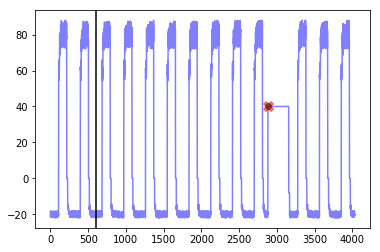




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2930]


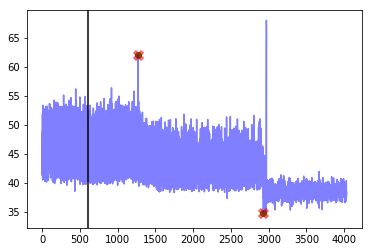




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


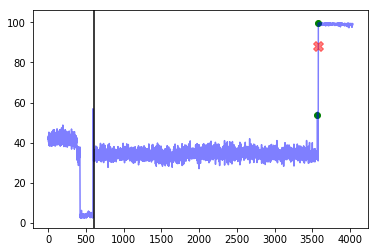




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


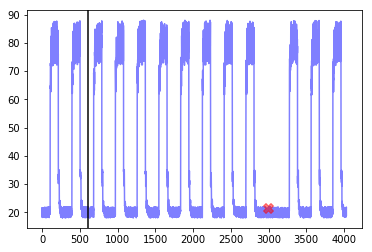




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


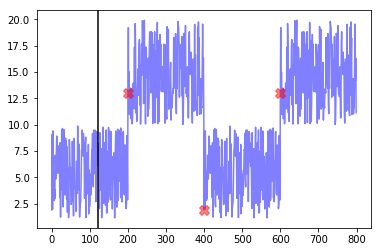




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


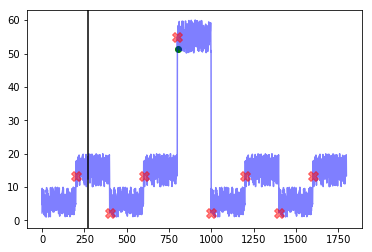




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


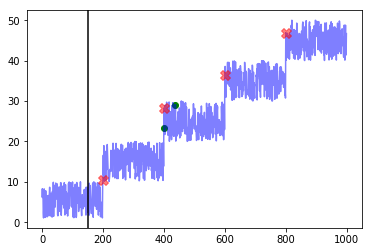

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.8
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


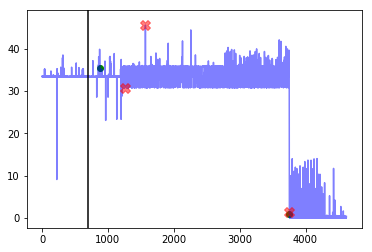




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


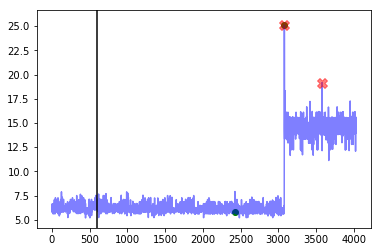




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


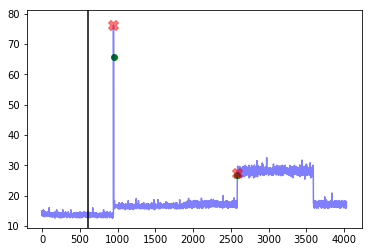




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


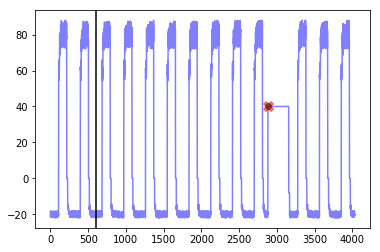




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


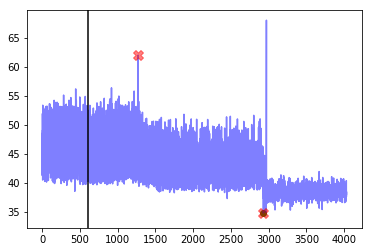




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


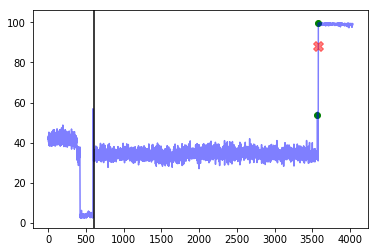




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


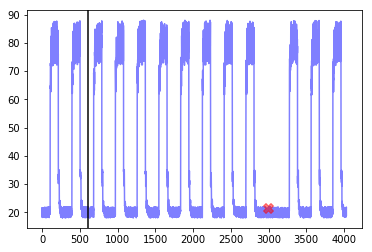




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


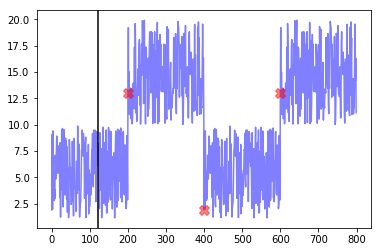




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


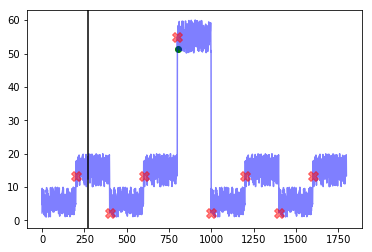




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


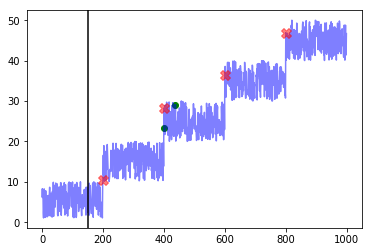

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.099999999999998
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


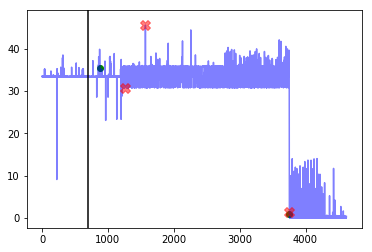




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


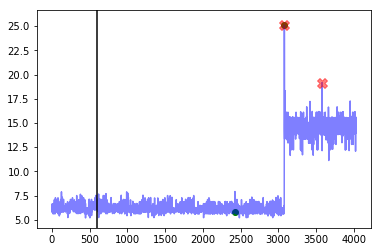




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


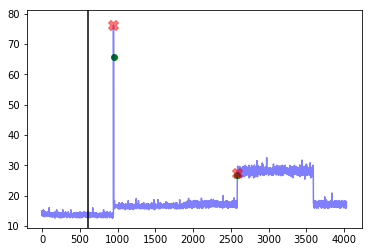




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


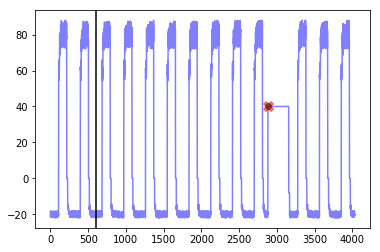




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


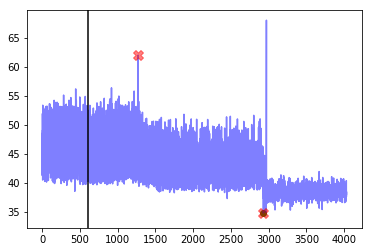




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


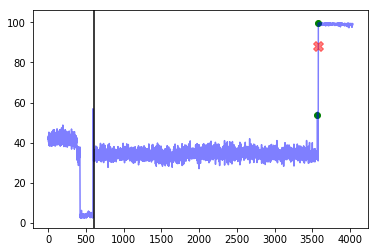




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


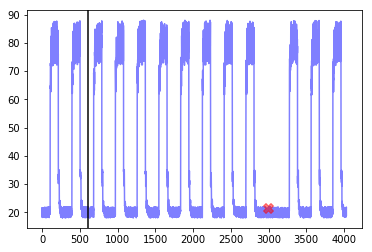




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


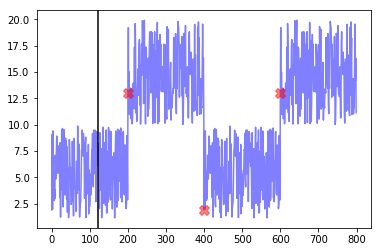




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


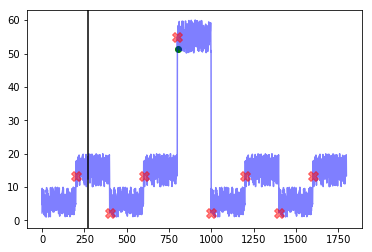




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


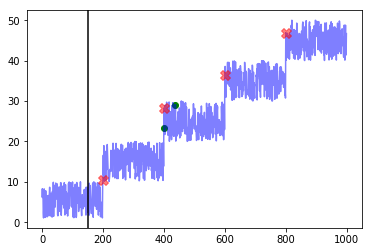

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.400000000000002
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


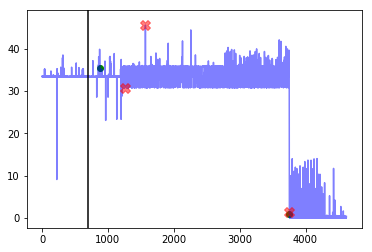




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


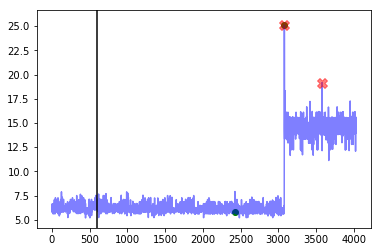




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


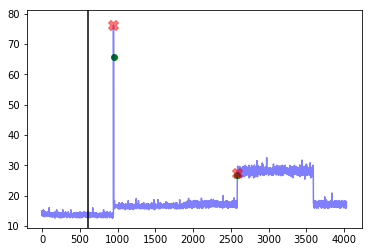




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


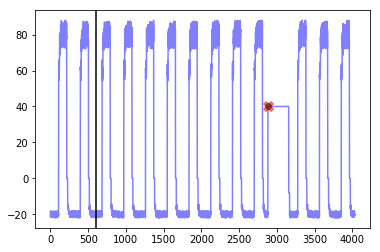




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


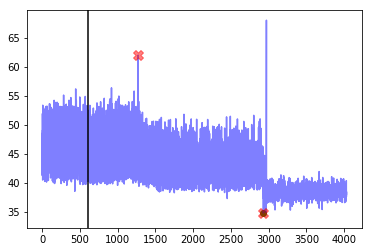




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


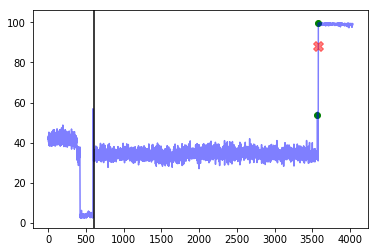




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


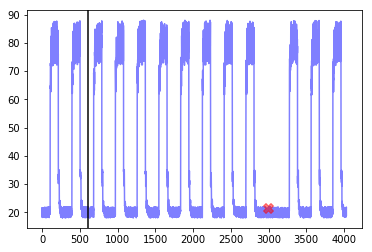




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


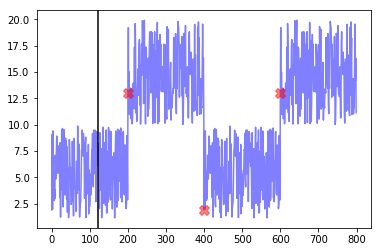




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


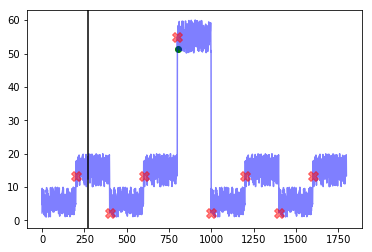




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


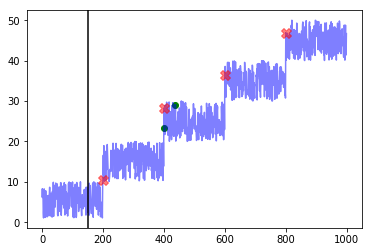

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.7
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


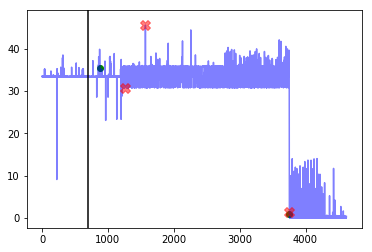




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


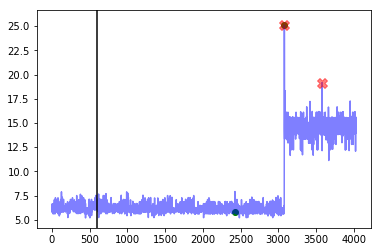




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


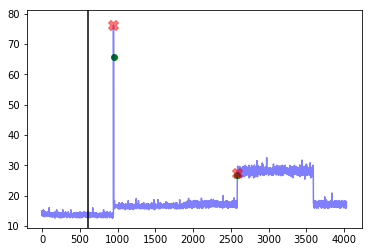




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


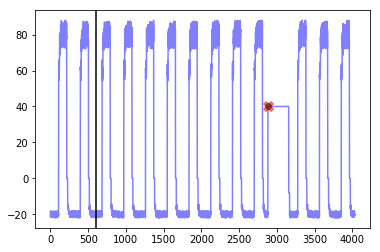




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


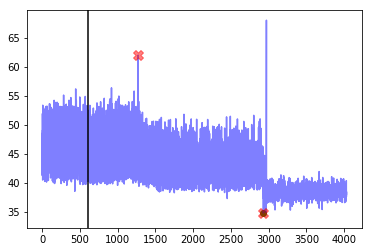




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


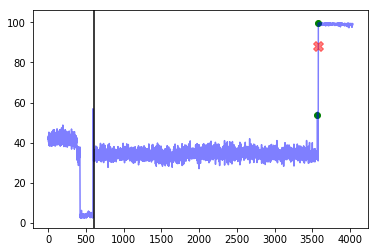




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


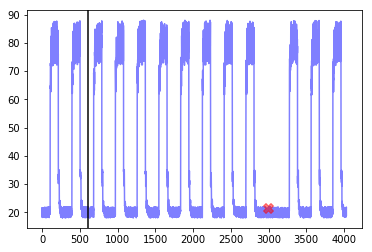




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


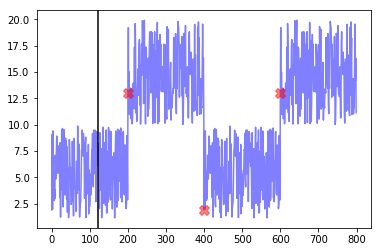




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


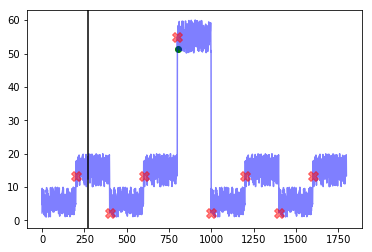




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


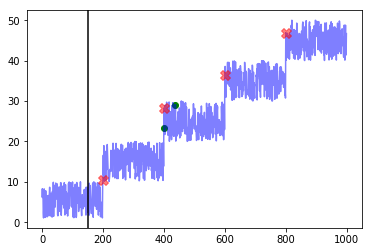

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.0
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


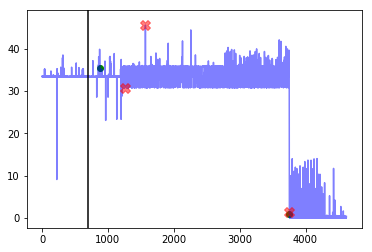




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


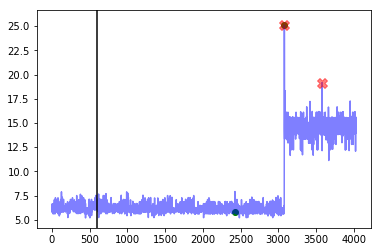




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


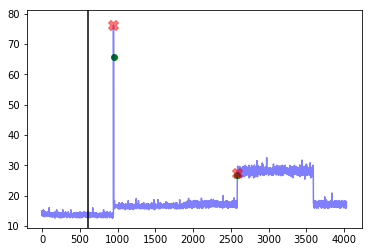




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


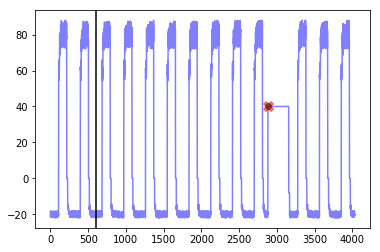




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


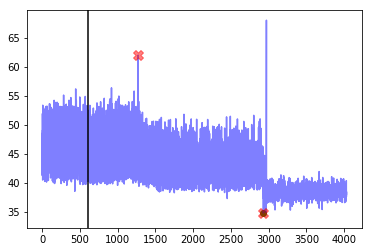




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


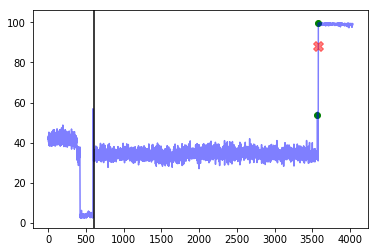




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


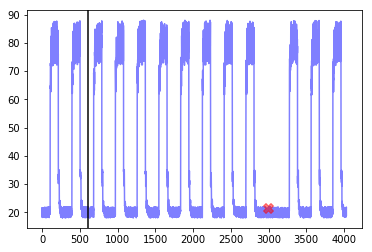




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


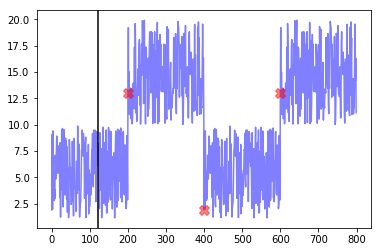




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


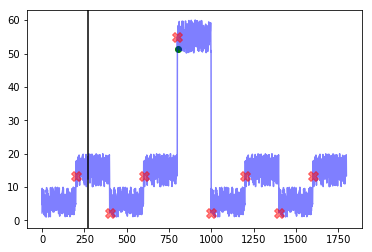




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


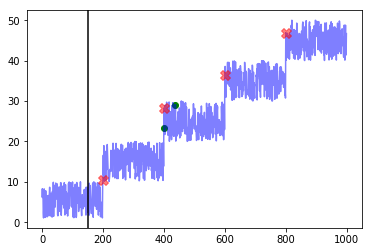

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 12.6
	 Best window threshold : 0.0562
	 Corresponding window overall precision : 0.1864406779661017
	 Corresponding window overall recall : 0.8148148148148148
	 Corresponding window overall F score : 0.30344827586206896
False Positive Weight:  0.2
	 Minimum number of mistakes : 14.8
	 Best window threshold : 0.3634
	 Corresponding window overall precision : 0.47058823529411764
	 Corresponding window overall recall : 0.5925925925925926
	 Corresponding window overall F score : 0.5245901639344261
False Positive Weight:  0.3
	 Minimum number of mistakes : 16.7
	 Best window threshold : 0.3634
	 Corresponding window overall precision : 0.47058823529411764
	 Corresponding window overall recall : 0.5925925925925926
	 Corresponding window overall F score : 0.5245901639344261
False Positive Weight:  0.4
	 Minimum number of mistakes : 18.6
	 Best window threshold : 0.3634
	 Corresponding window overall precision : 0.47058823

In [23]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# windowed gaussian results

In [24]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/windowed_gaussian/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [25]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.2: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.3: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.4: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.5: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.6: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.7: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.8: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.9: {'precision': 0.11764705882352941, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.9
Best window threshold:  0.9994
Corresponding window overall precision:  0.21621621621621623
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.31683168316831684



--- grok_asg_anomaly ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  12
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 856, 860, 873, 874, 875, 901, 905, 953, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1042, 1043, 1090, 1095, 1134, 1200, 1212, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2878, 2919, 3600, 3625, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 37

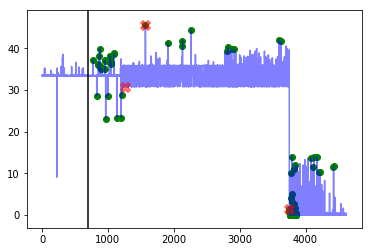




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 683, 708, 718, 920, 992, 1006, 1208, 1235, 1283, 1309, 1362, 1404, 1498, 1534, 1561, 1569, 1580, 1591, 1722, 1808, 1832, 1873, 1880, 2082, 2426, 2438, 2445, 2456, 2513, 2626, 2650, 2801, 2971, 2996, 3021, 3032, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 

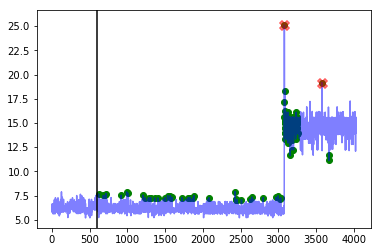




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 1277, 1480, 1535, 1823, 1931, 1941, 1949, 2111, 2399, 2543, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 2975, 3446, 3480, 3551, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 

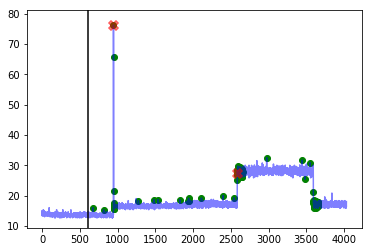




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


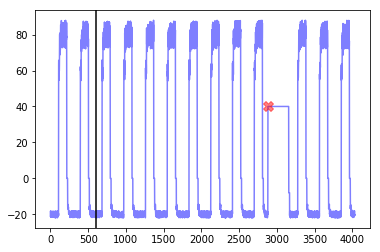




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970, 3668]


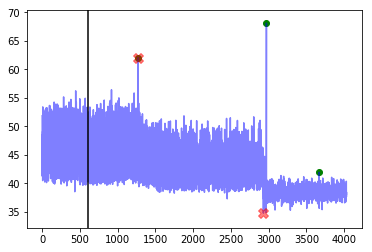




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1882, 1999, 2670, 3032, 3425, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3860, 3874, 3967, 3987, 4027]


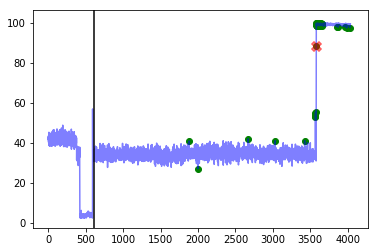




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3387, 3388, 3389, 3390, 3391, 3392, 3393, 3394, 3395, 3396, 3397, 3398, 3400, 3401, 3404, 340

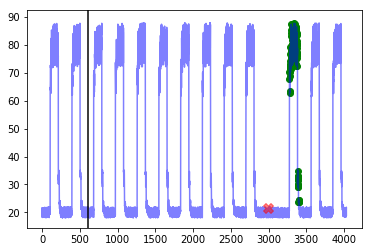




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 203, 217, 219, 220, 238]


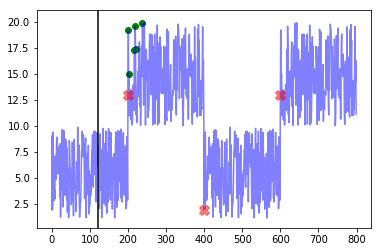




--- artificial_cd_2 ---
Corresponding window precision:  0.25
Corresponding window recall:  0.125
Corresponding window false positives:  3
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855]


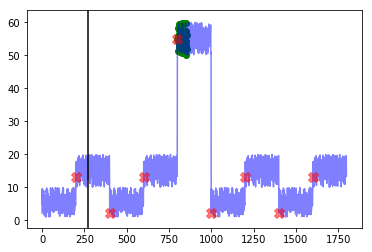




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 208, 211, 214, 233, 409, 417, 429, 601, 609, 611, 613, 626, 631, 632, 635, 651, 820]


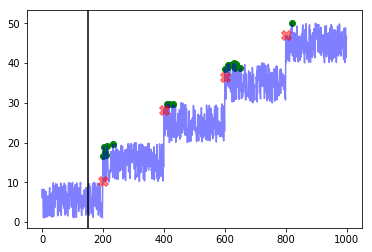

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.8
Best window threshold:  0.9994
Corresponding window overall precision:  0.21621621621621623
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.31683168316831684



--- grok_asg_anomaly ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  12
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 856, 860, 873, 874, 875, 901, 905, 953, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1042, 1043, 1090, 1095, 1134, 1200, 1212, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2878, 2919, 3600, 3625, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 37

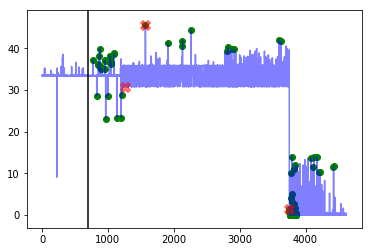




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 683, 708, 718, 920, 992, 1006, 1208, 1235, 1283, 1309, 1362, 1404, 1498, 1534, 1561, 1569, 1580, 1591, 1722, 1808, 1832, 1873, 1880, 2082, 2426, 2438, 2445, 2456, 2513, 2626, 2650, 2801, 2971, 2996, 3021, 3032, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 

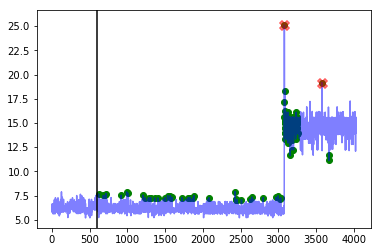




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 1277, 1480, 1535, 1823, 1931, 1941, 1949, 2111, 2399, 2543, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 2975, 3446, 3480, 3551, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 

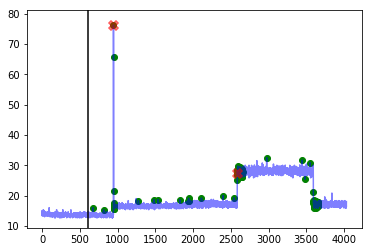




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


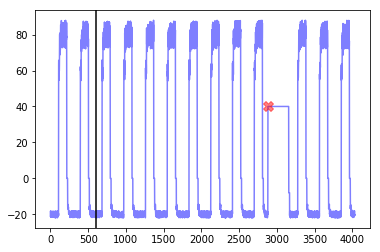




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970, 3668]


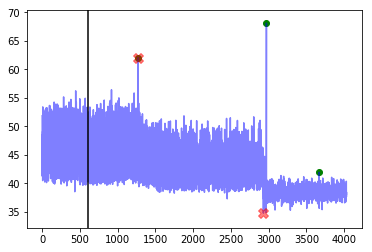




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1882, 1999, 2670, 3032, 3425, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3860, 3874, 3967, 3987, 4027]


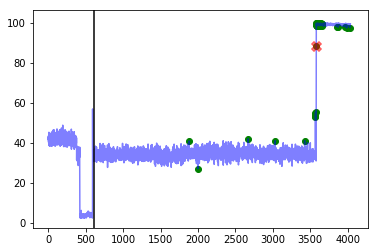




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3387, 3388, 3389, 3390, 3391, 3392, 3393, 3394, 3395, 3396, 3397, 3398, 3400, 3401, 3404, 340

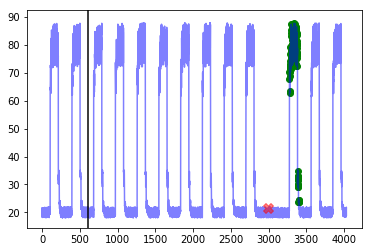




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 203, 217, 219, 220, 238]


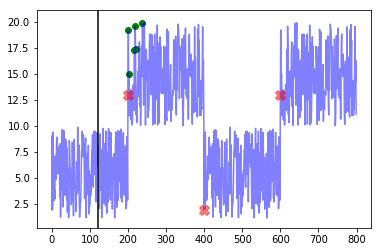




--- artificial_cd_2 ---
Corresponding window precision:  0.25
Corresponding window recall:  0.125
Corresponding window false positives:  3
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855]


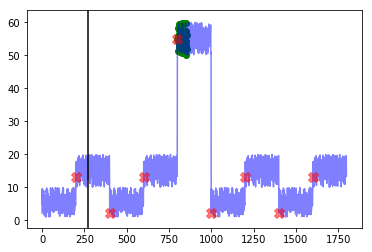




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 208, 211, 214, 233, 409, 417, 429, 601, 609, 611, 613, 626, 631, 632, 635, 651, 820]


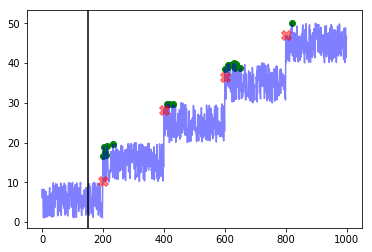

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.299999999999997
Best window threshold:  1.0
Corresponding window overall precision:  0.4375
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3255813953488372



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


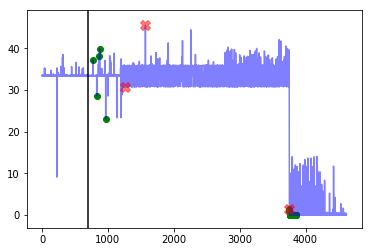




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204,

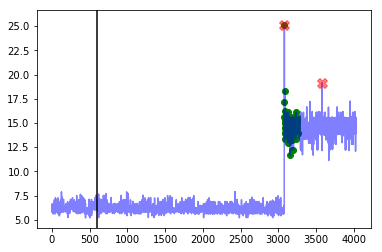




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

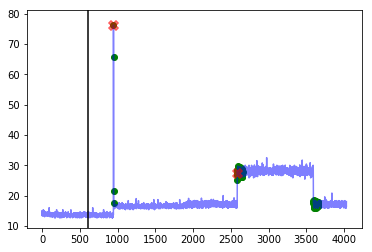




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


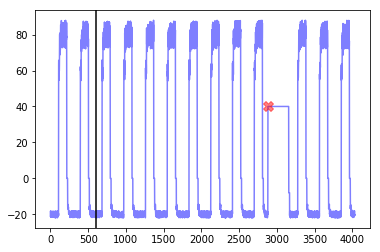




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


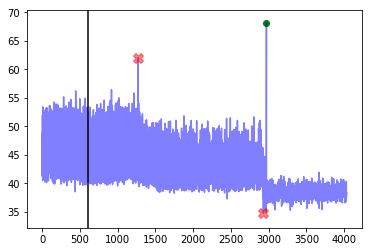




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


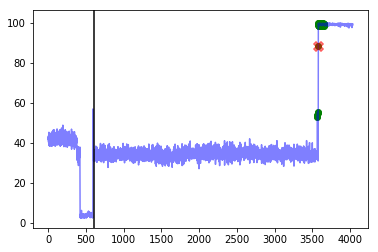




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3389, 3390, 3391, 3392, 3393, 3394, 3395]


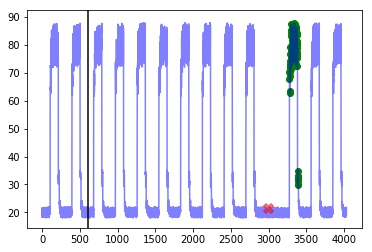




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


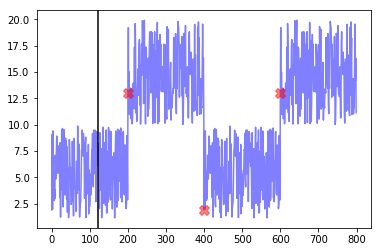




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


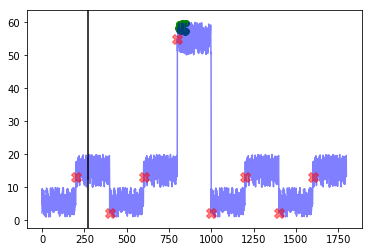




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


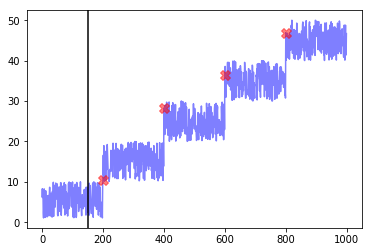

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.4
Best window threshold:  1.0
Corresponding window overall precision:  0.4375
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3255813953488372



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


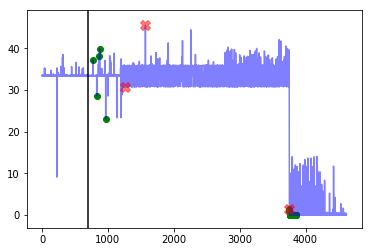




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204,

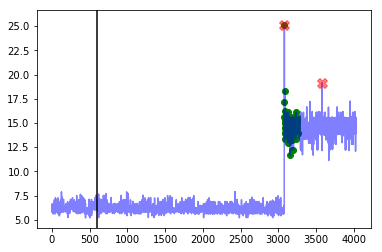




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

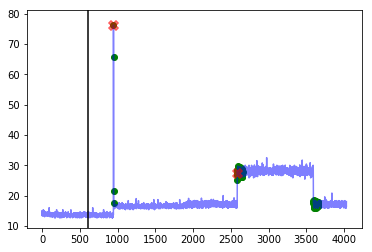




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


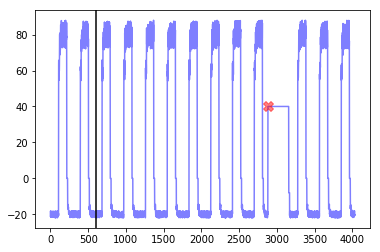




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


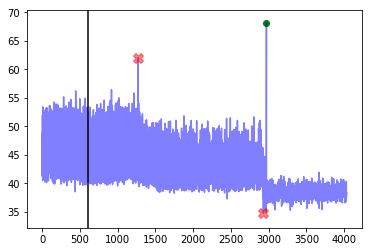




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


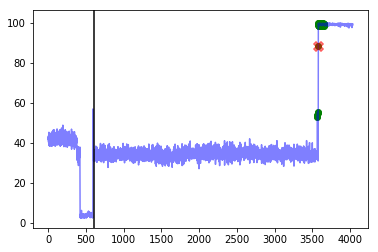




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3389, 3390, 3391, 3392, 3393, 3394, 3395]


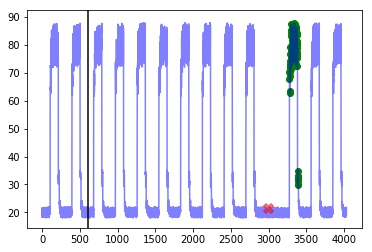




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


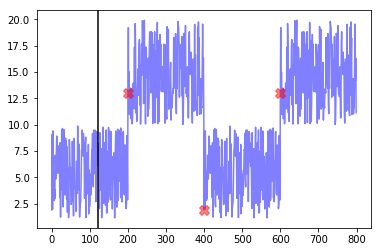




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


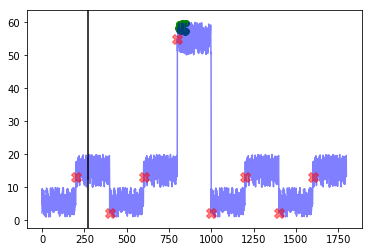




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


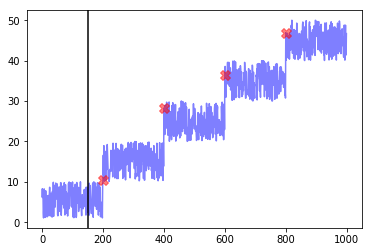

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.5
Best window threshold:  1.0
Corresponding window overall precision:  0.4375
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3255813953488372



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


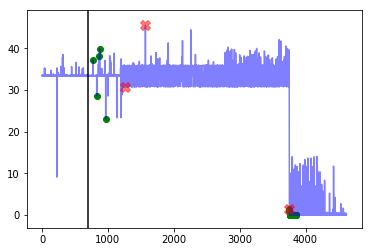




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204,

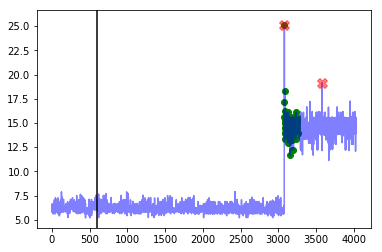




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

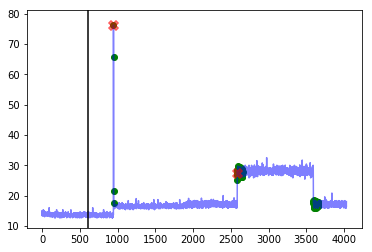




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


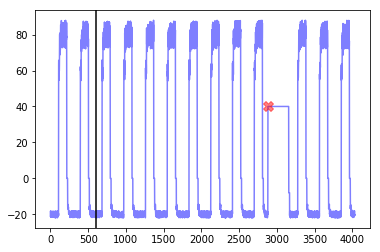




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


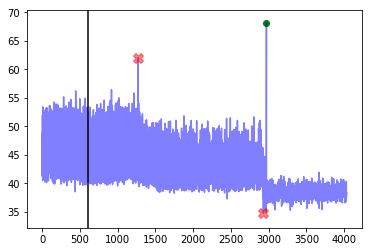




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


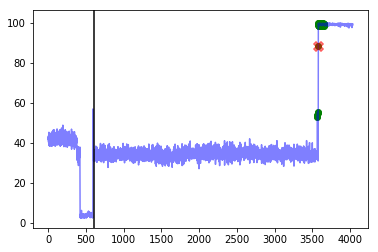




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3389, 3390, 3391, 3392, 3393, 3394, 3395]


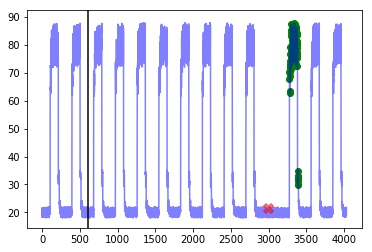




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


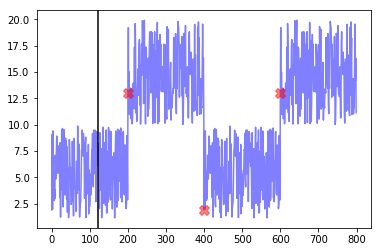




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


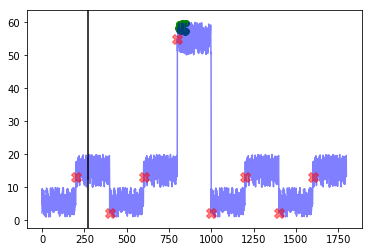




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


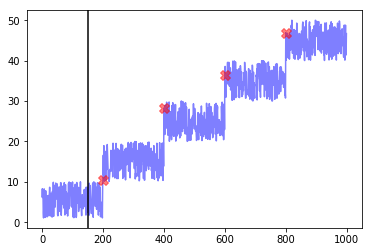

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.599999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.4375
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3255813953488372



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


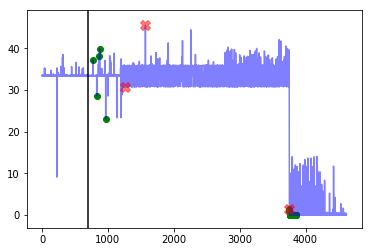




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204,

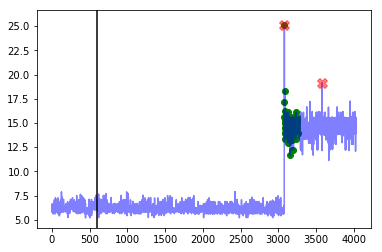




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

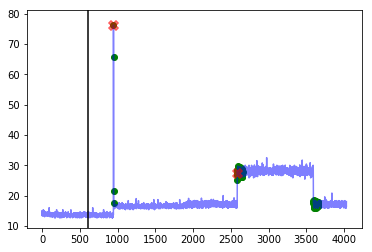




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


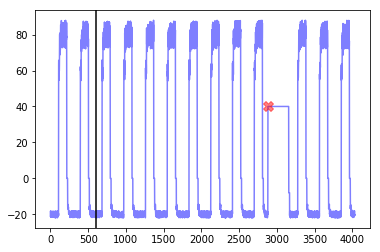




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


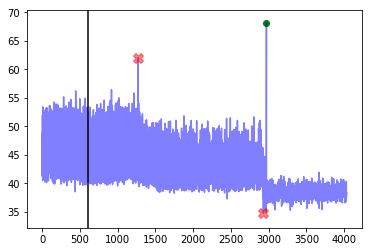




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


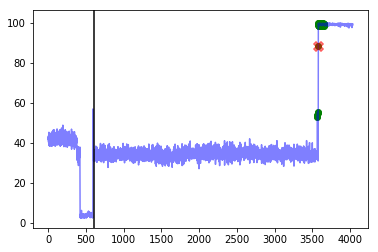




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3389, 3390, 3391, 3392, 3393, 3394, 3395]


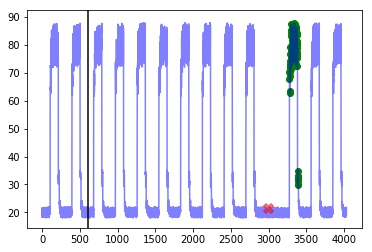




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


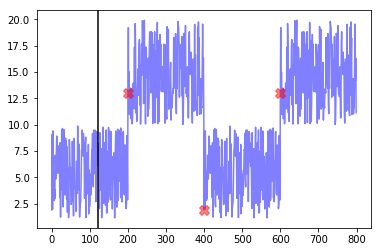




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


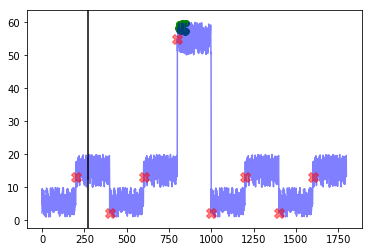




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


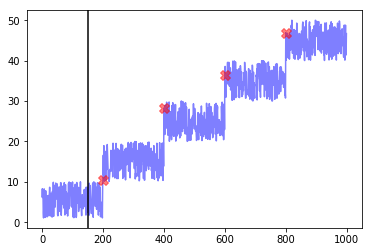

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  27.699999999999996
Best window threshold:  1.0
Corresponding window overall precision:  0.4375
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3255813953488372



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


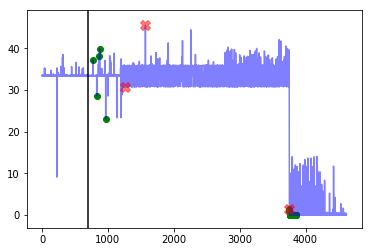




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204,

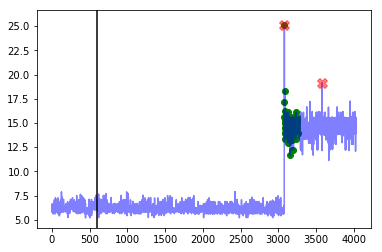




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

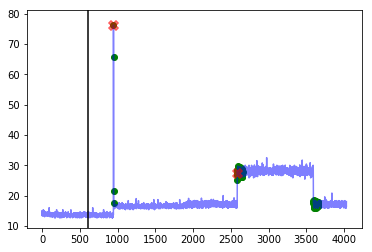




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


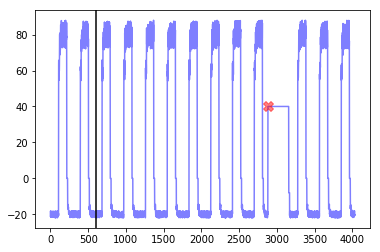




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


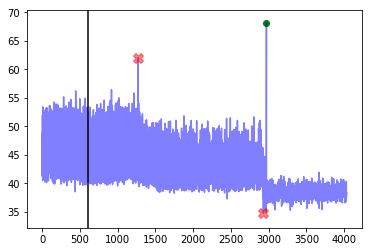




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


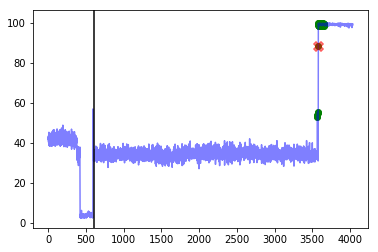




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3389, 3390, 3391, 3392, 3393, 3394, 3395]


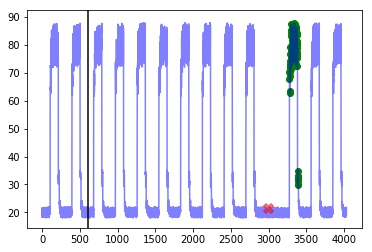




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


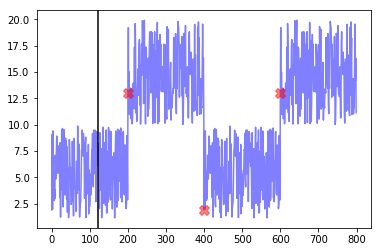




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


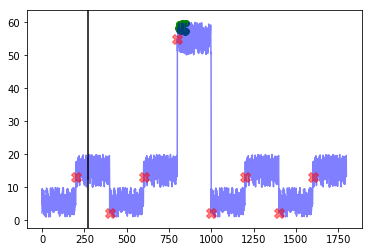




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


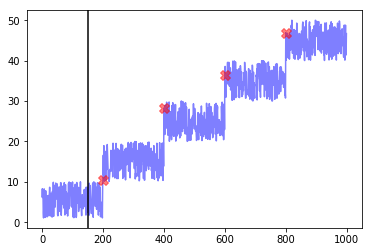

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.800000000000004
Best window threshold:  1.0
Corresponding window overall precision:  0.4375
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3255813953488372



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


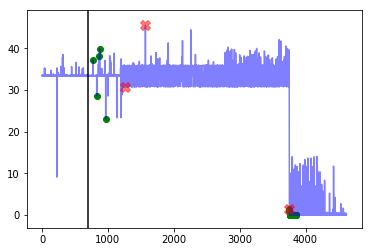




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204,

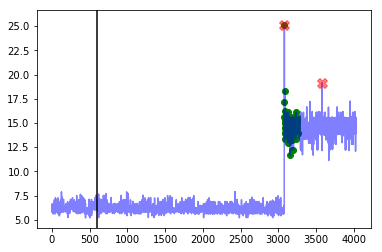




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

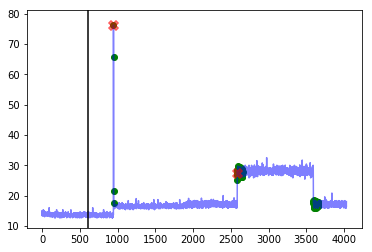




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


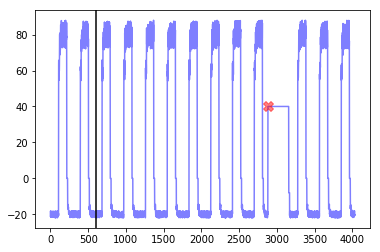




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


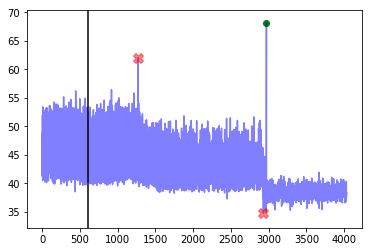




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


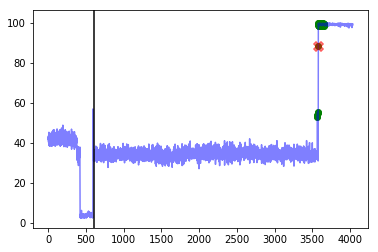




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3389, 3390, 3391, 3392, 3393, 3394, 3395]


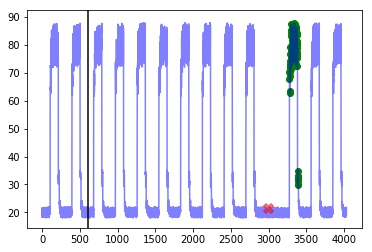




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


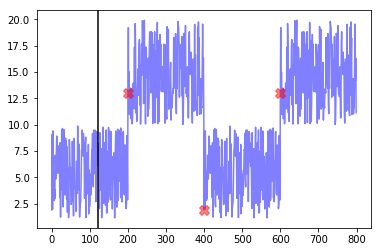




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


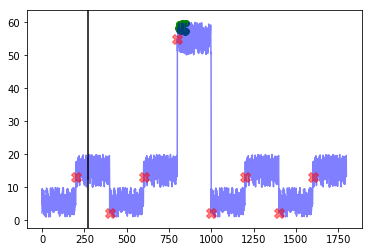




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


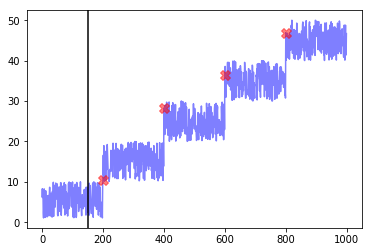

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.900000000000002
Best window threshold:  1.0
Corresponding window overall precision:  0.4375
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3255813953488372



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


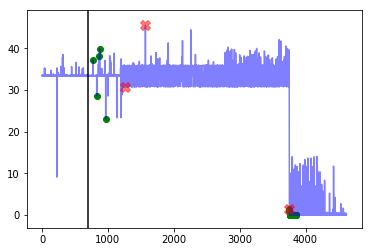




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204,

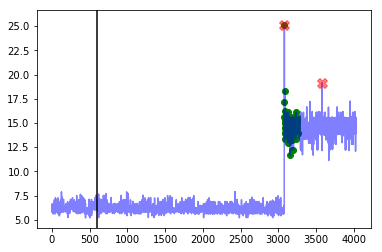




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

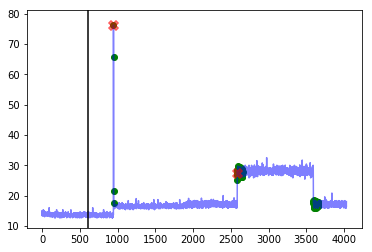




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


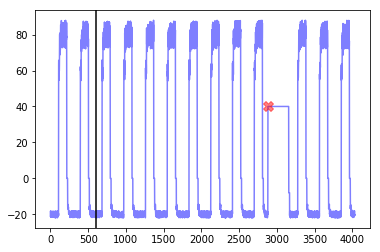




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


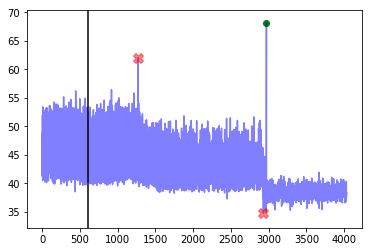




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


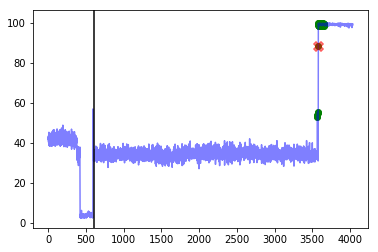




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3389, 3390, 3391, 3392, 3393, 3394, 3395]


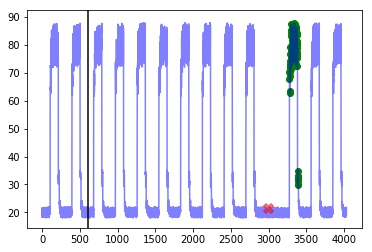




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


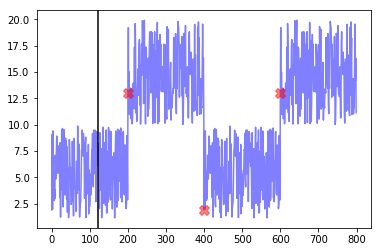




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


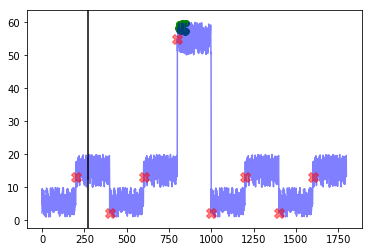




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


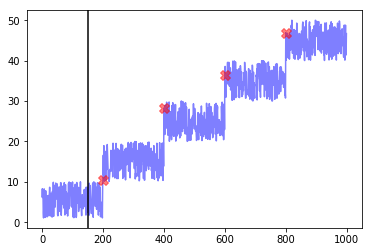

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  31.0
Best window threshold:  1.0
Corresponding window overall precision:  0.4375
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3255813953488372



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


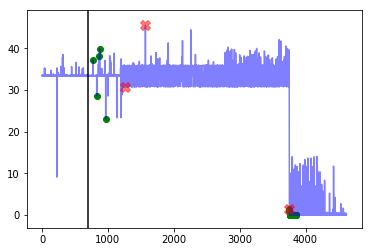




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204,

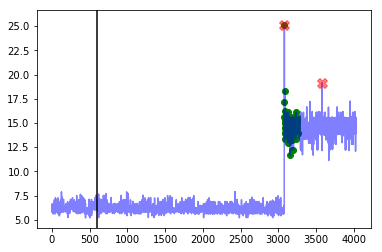




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

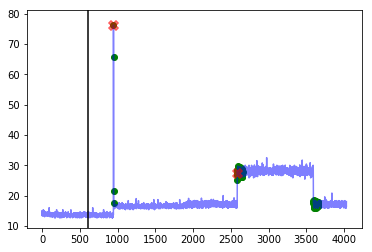




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


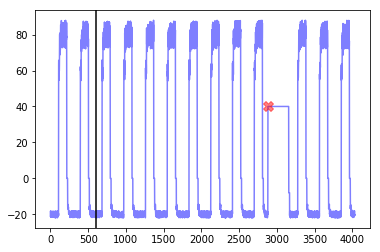




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


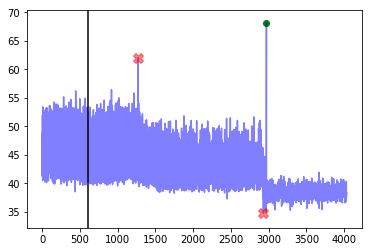




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


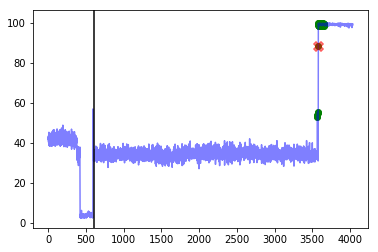




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3389, 3390, 3391, 3392, 3393, 3394, 3395]


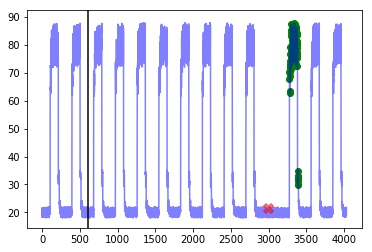




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


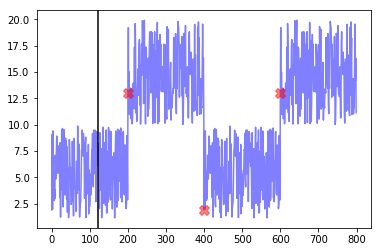




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


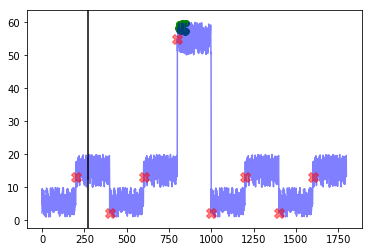




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


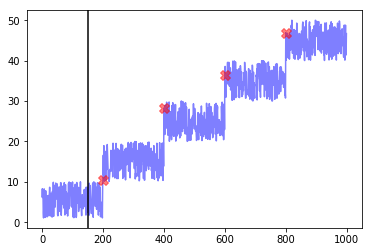

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 16.9
	 Best window threshold : 0.9994
	 Corresponding window overall precision : 0.21621621621621623
	 Corresponding window overall recall : 0.5925925925925926
	 Corresponding window overall F score : 0.31683168316831684
False Positive Weight:  0.2
	 Minimum number of mistakes : 21.8
	 Best window threshold : 0.9994
	 Corresponding window overall precision : 0.21621621621621623
	 Corresponding window overall recall : 0.5925925925925926
	 Corresponding window overall F score : 0.31683168316831684
False Positive Weight:  0.3
	 Minimum number of mistakes : 23.299999999999997
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.4375
	 Corresponding window overall recall : 0.25925925925925924
	 Corresponding window overall F score : 0.3255813953488372
False Positive Weight:  0.4
	 Minimum number of mistakes : 24.4
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.4375
	 Cor

In [26]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HOTSAX results

In [27]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/hotsax/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [28]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.0, 'recall': 0.0},
 0.2: {'precision': 0.0, 'recall': 0.0},
 0.3: {'precision': 0.0, 'recall': 0.0},
 0.4: {'precision': 0.0, 'recall': 0.0},
 0.5: {'precision': 0.0, 'recall': 0.0},
 0.6: {'precision': 0.0, 'recall': 0.0},
 0.7: {'precision': 0.0, 'recall': 0.0},
 0.8: {'precision': 0.0, 'recall': 0.0},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.200000000000003
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


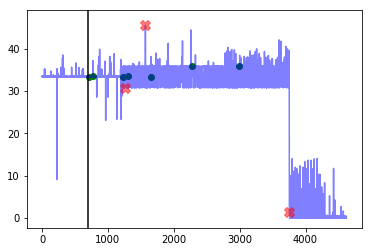




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


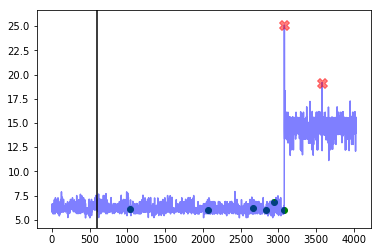




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


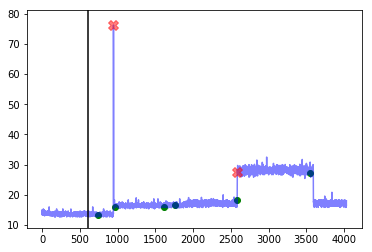




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


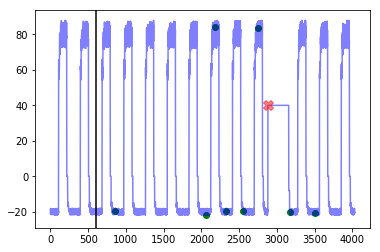




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


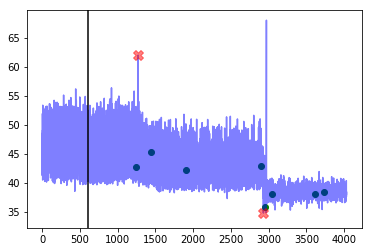




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


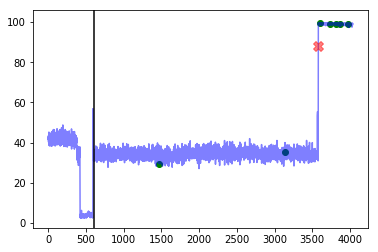




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


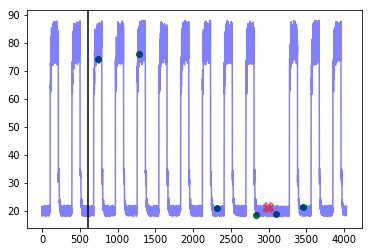




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


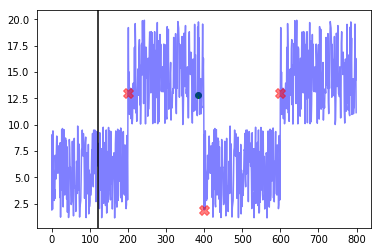




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


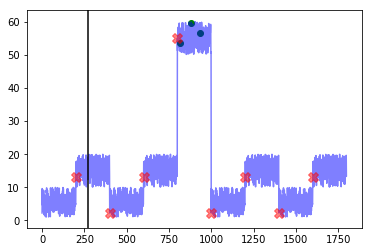




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


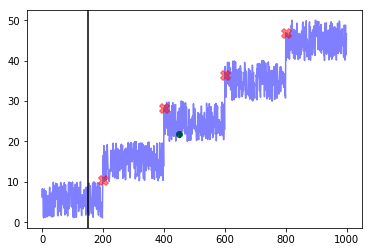

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.400000000000002
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


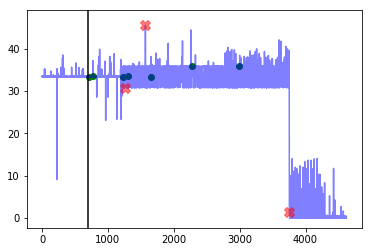




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


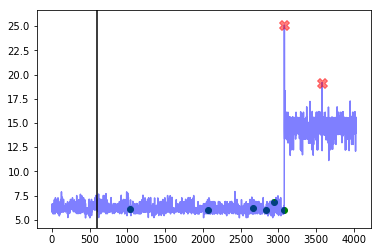




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


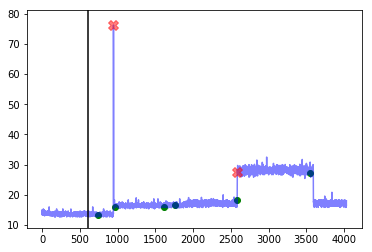




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


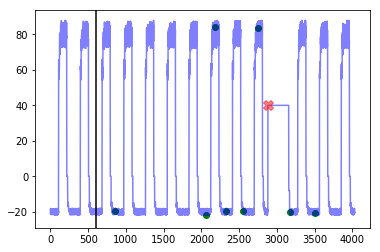




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


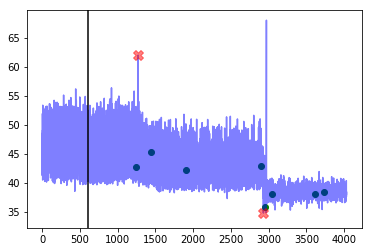




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


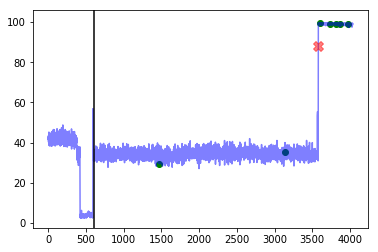




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


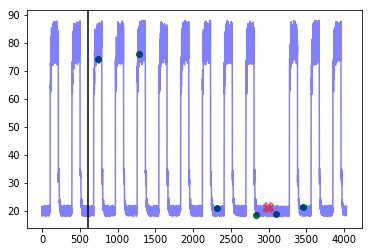




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


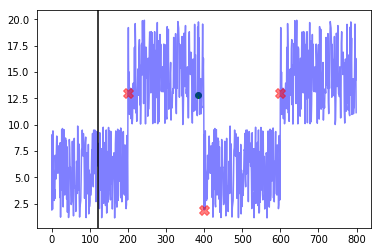




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


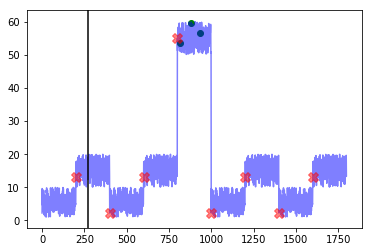




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


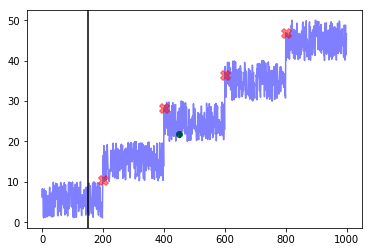

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.6
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


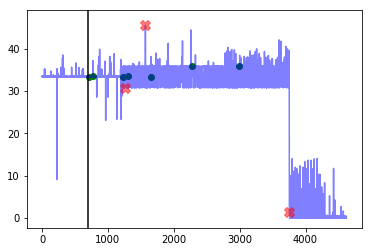




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


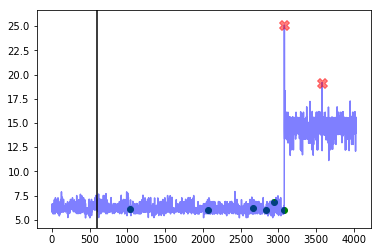




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


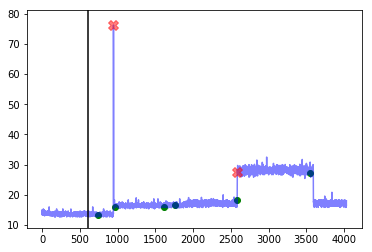




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


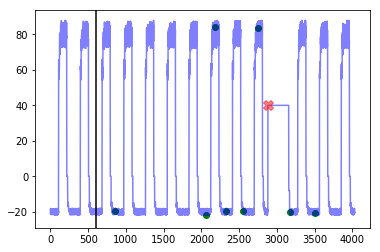




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


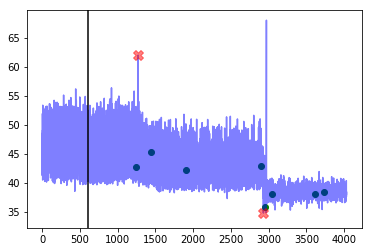




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


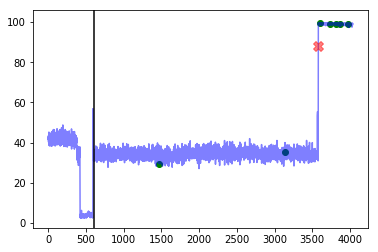




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


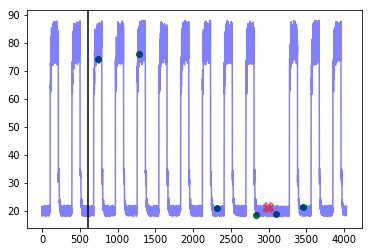




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


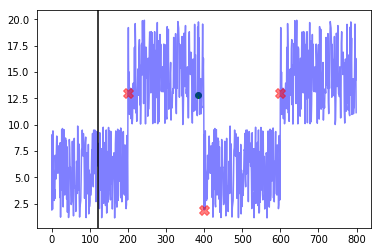




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


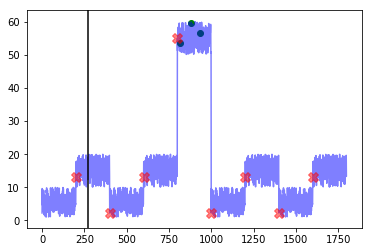




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


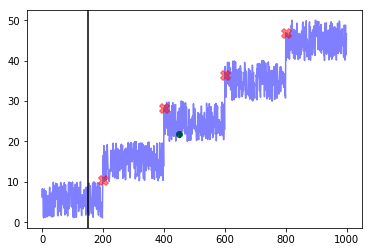

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.799999999999997
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


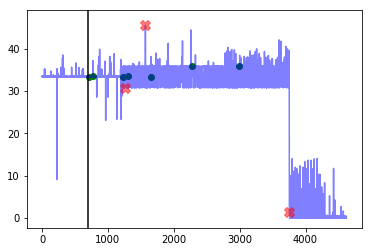




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


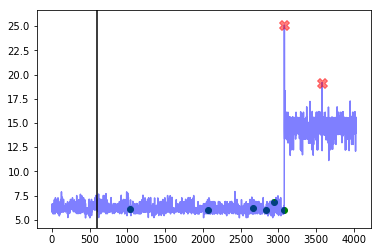




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


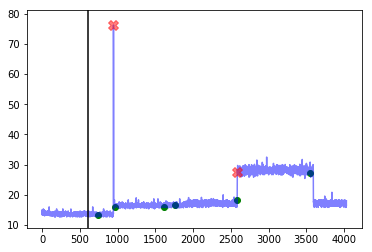




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


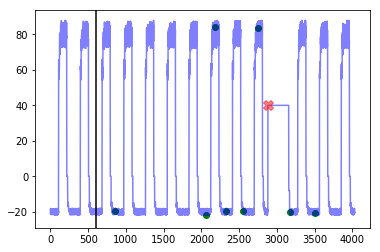




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


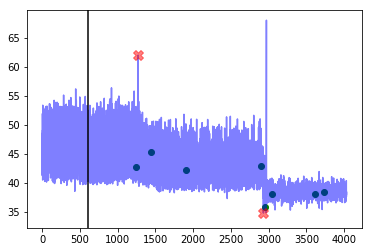




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


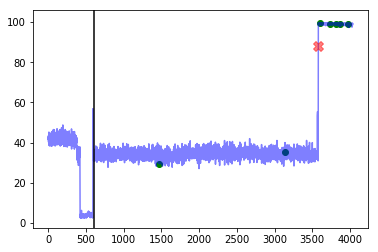




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


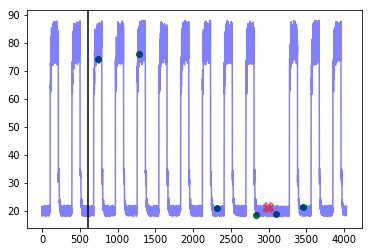




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


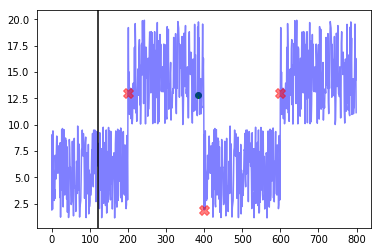




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


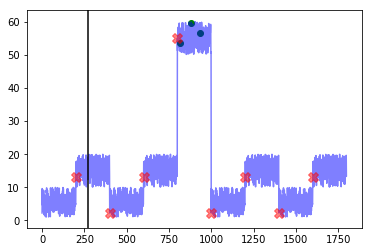




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


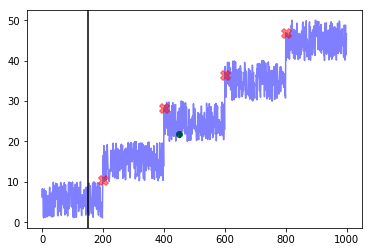

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  32.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


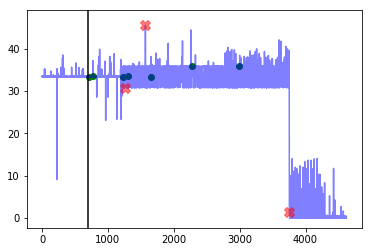




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


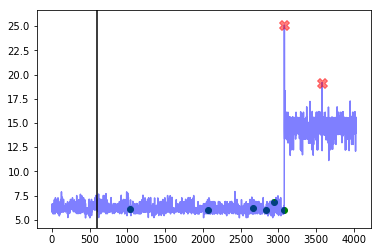




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


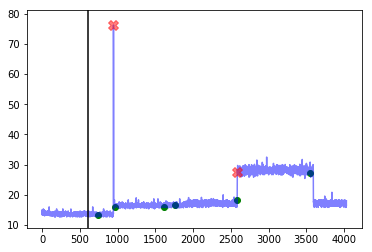




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


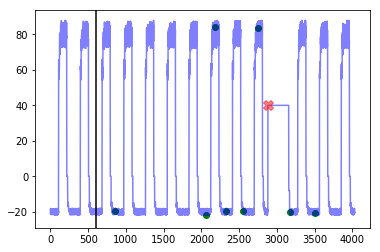




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


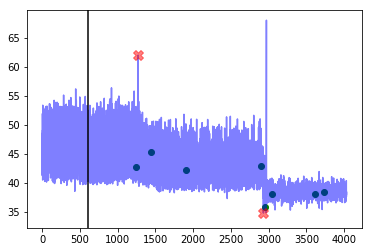




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


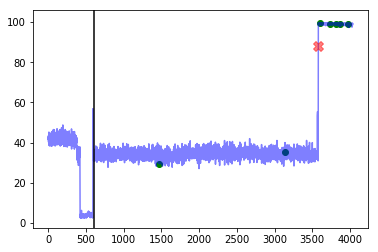




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


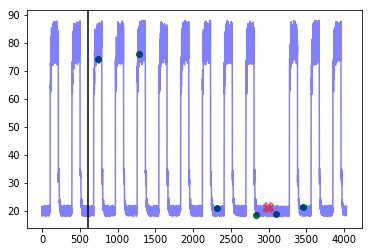




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


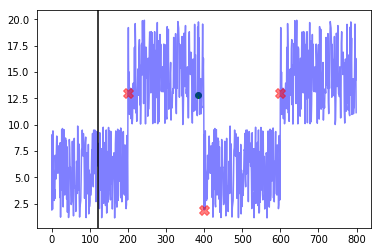




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


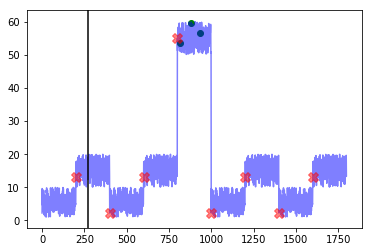




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


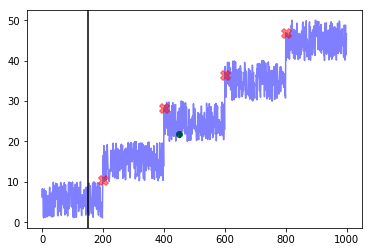

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  35.199999999999996
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


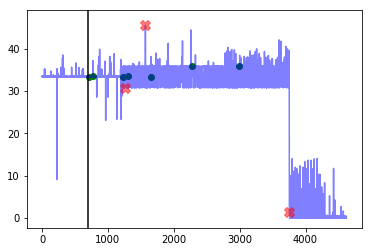




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


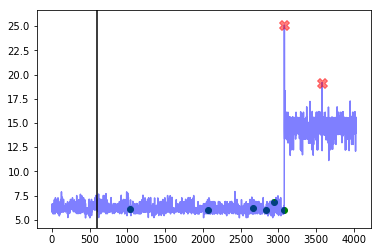




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


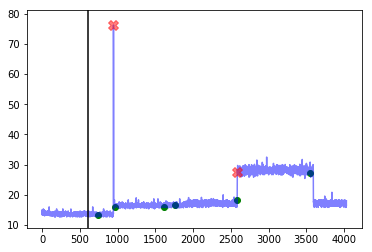




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


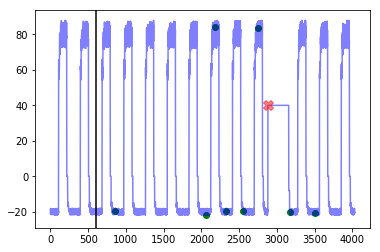




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


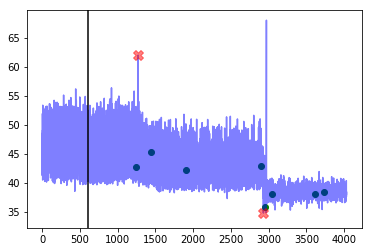




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


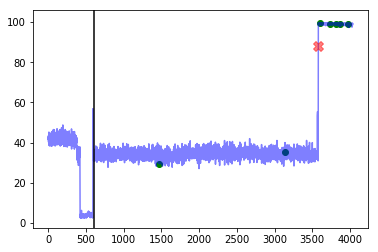




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


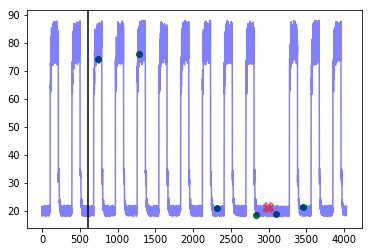




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


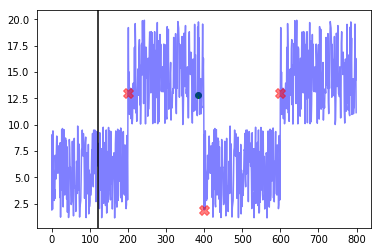




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


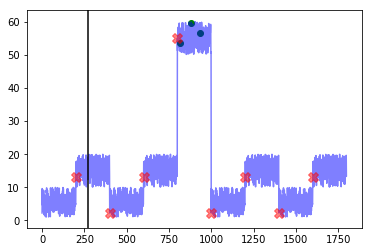




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


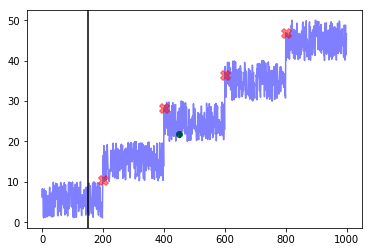

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  38.4
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


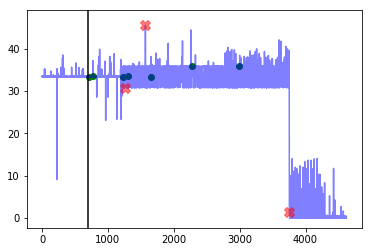




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


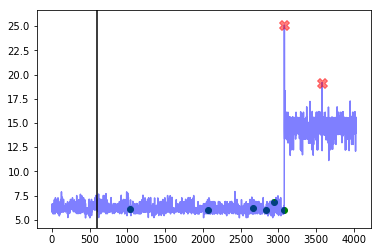




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


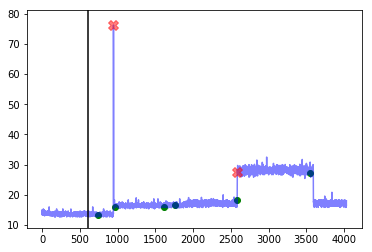




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


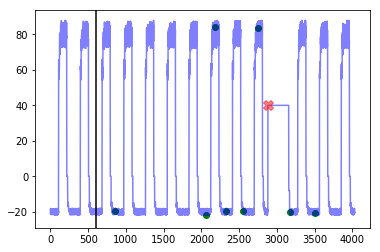




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


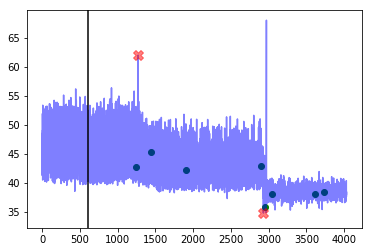




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


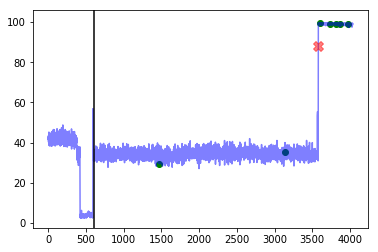




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


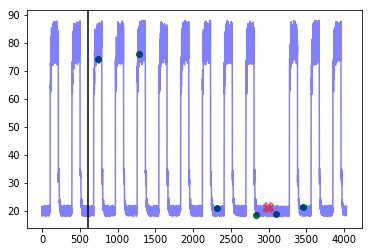




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


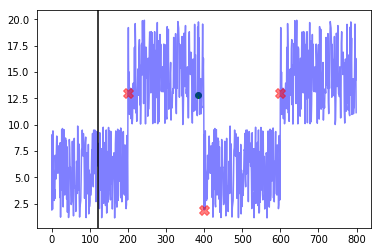




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


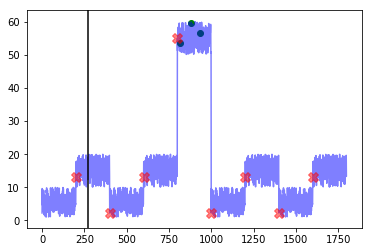




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


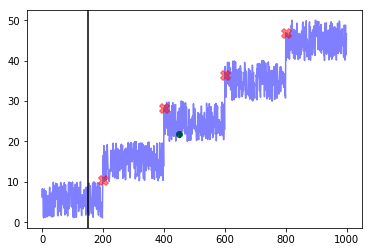

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  41.6
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


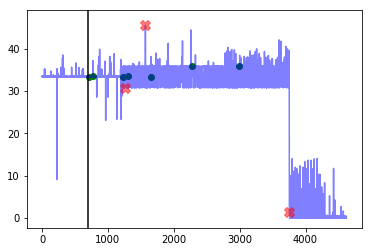




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


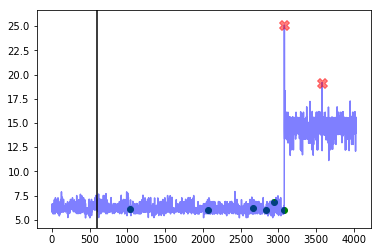




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


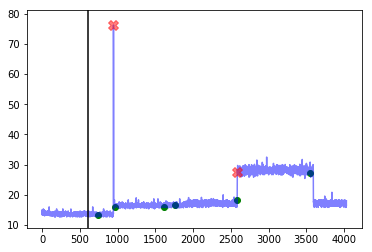




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


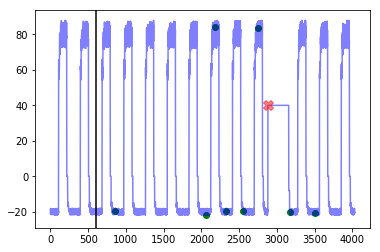




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


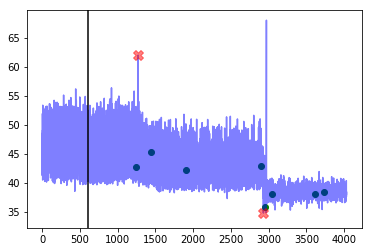




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


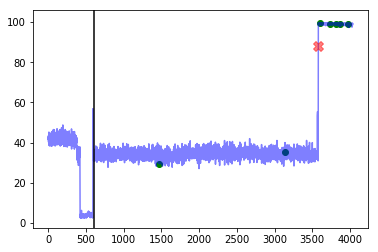




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


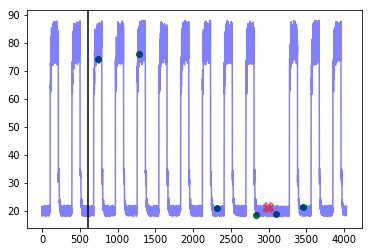




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


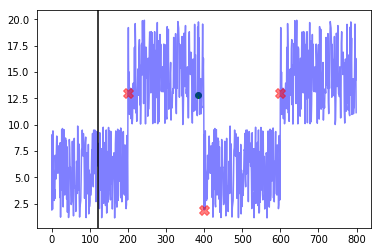




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


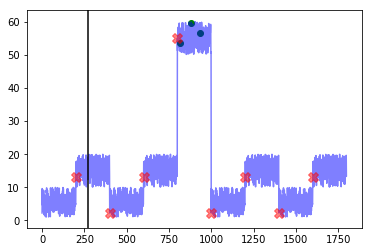




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


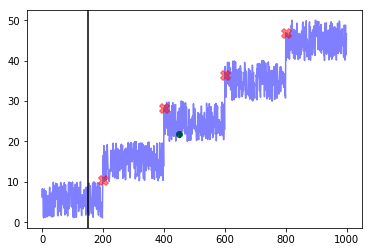

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  44.800000000000004
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


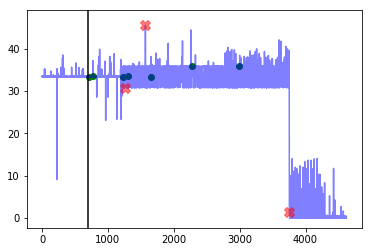




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


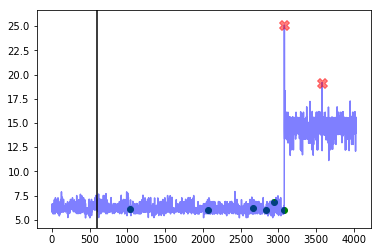




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


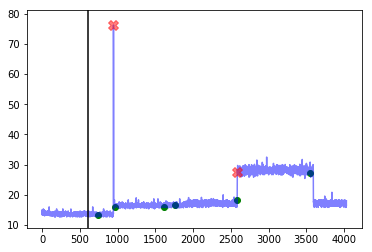




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


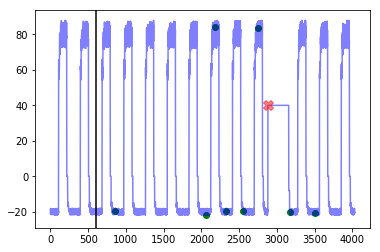




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


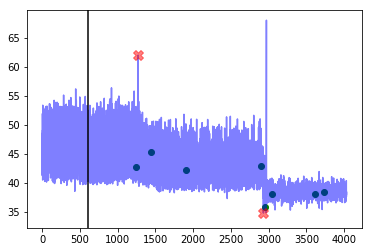




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


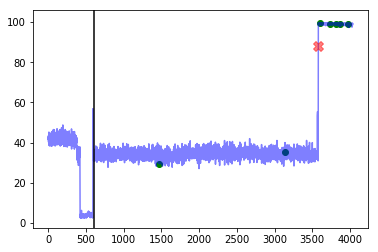




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


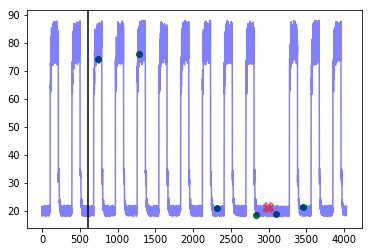




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


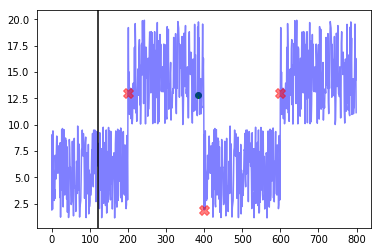




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


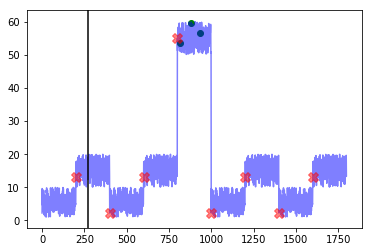




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


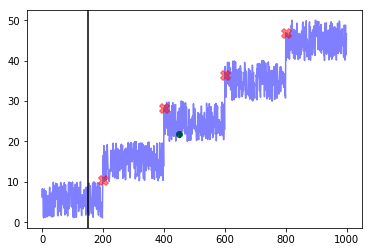

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  48.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


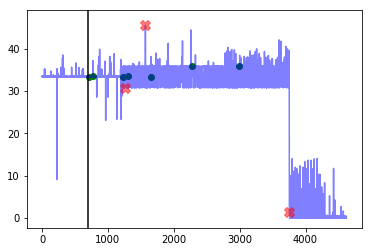




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


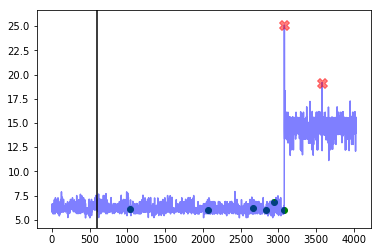




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


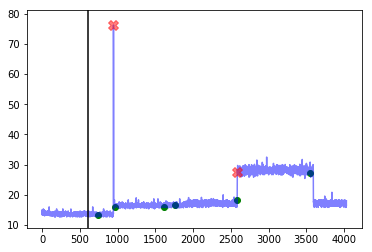




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


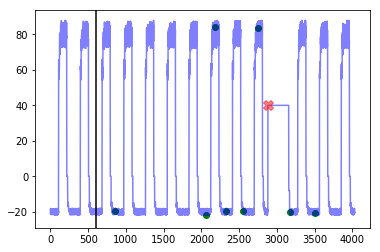




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


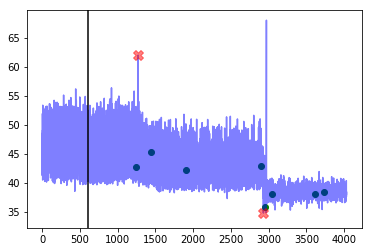




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


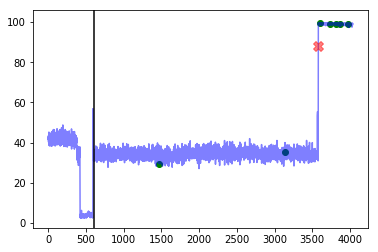




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


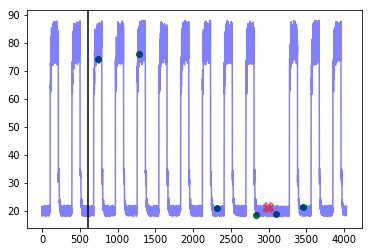




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


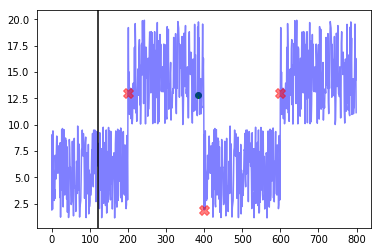




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


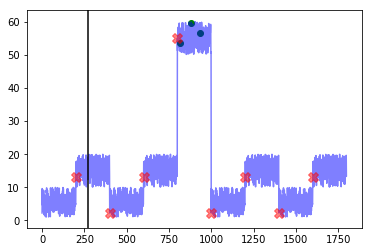




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


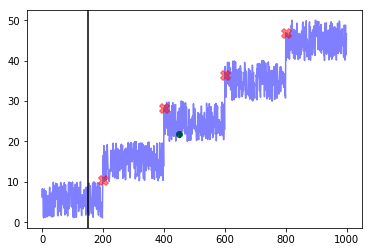

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 19.200000000000003
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16666666666666666
	 Corresponding window overall recall : 0.2962962962962963
	 Corresponding window overall F score : 0.21333333333333335
False Positive Weight:  0.2
	 Minimum number of mistakes : 22.400000000000002
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16666666666666666
	 Corresponding window overall recall : 0.2962962962962963
	 Corresponding window overall F score : 0.21333333333333335
False Positive Weight:  0.3
	 Minimum number of mistakes : 25.6
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16666666666666666
	 Corresponding window overall recall : 0.2962962962962963
	 Corresponding window overall F score : 0.21333333333333335
False Positive Weight:  0.4
	 Minimum number of mistakes : 28.799999999999997
	 Best window threshold : 0.0001
	 Corres

In [30]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# GLM

In [31]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_glm = joblib.load("anomaly_scores" + window_size + "/GLM/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_glm["Anomaly Scores"]

In [32]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.2: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.3: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.4: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.5: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.6: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.7: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.8: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.9: {'precision': 0.125, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.1
Best window threshold:  0.9997
Corresponding window overall precision:  0.2727272727272727
Corresponding window overall recall:  0.7777777777777778
Corresponding window overall F score:  0.40384615384615374



--- grok_asg_anomaly ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  11
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 856, 860, 873, 874, 954, 955, 966, 1002, 1026, 1029, 1089, 1090, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2824, 3600, 3625, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3768, 3769, 4032, 4033, 4034, 4035, 4037, 4038, 4320, 4321, 4322, 4323, 4324, 4325, 4326, 4608, 4609, 4610, 4611, 4612, 4613, 4614, 4615]


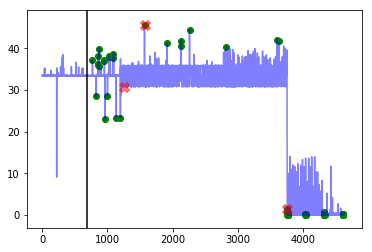




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 683, 708, 718, 920, 992, 1006, 1014, 1208, 1534, 1569, 1808, 1832, 1873, 1880, 2082, 2426, 2650, 2801, 2971, 2996, 3032, 3080, 3081, 3082, 3083, 3084, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3570, 3571, 3572, 3580, 3858, 3859, 3860, 3861, 3862]


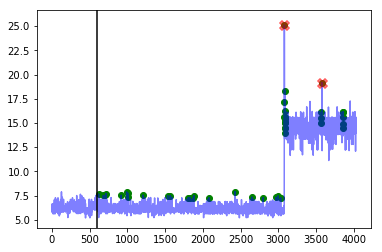




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 946, 947, 1224, 1225, 1226, 1227, 1228, 1229, 1230, 1231, 1512, 1513, 1514, 1519, 1728, 1800, 1801, 1803, 1823, 1941, 2016, 2017, 2018, 2019, 2021, 2033, 2305, 2309, 2317, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2604, 2605, 2606, 2880, 2881, 2882, 2883, 2885, 3168, 3169, 3170, 3171, 3456, 3457, 3458, 3459, 3461, 3468, 3594, 3595, 3596, 3597, 3598, 3600, 3601, 3602]


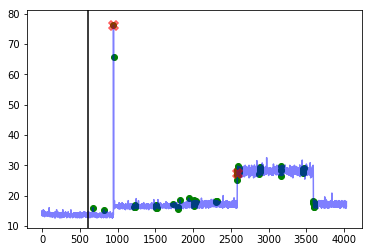




--- art_daily_flatmiddle ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [716, 1327, 2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2988, 2989, 2990, 2991, 2992, 3000, 3001]


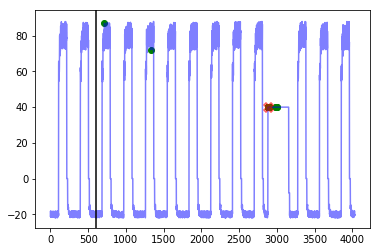




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.25
Corresponding window recall:  0.5
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970, 3287, 3571, 3573, 3574, 3859, 3861, 3863]


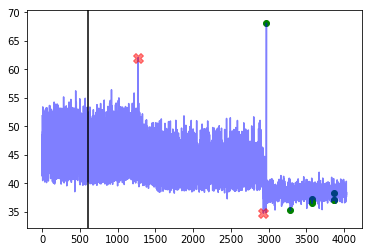




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2131, 2135, 2419, 2420, 2421, 2422, 2423, 2424, 2425, 2426, 2428, 2431, 2432, 2433, 2434, 3032, 3425, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3595, 3596, 3597, 3859, 3860, 3861, 3862, 3863, 3864, 3865]


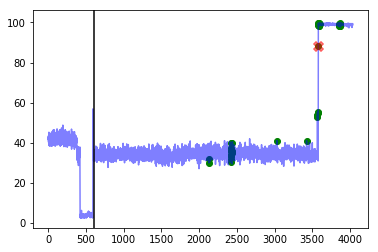




--- art_daily_nojump ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [758, 1004, 1575, 1583, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3012, 3013]


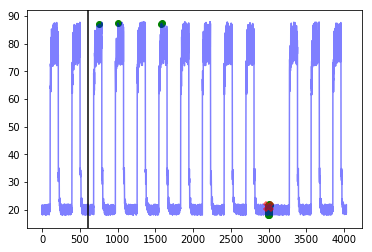




--- artificial_cd_1 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [201, 400, 684]


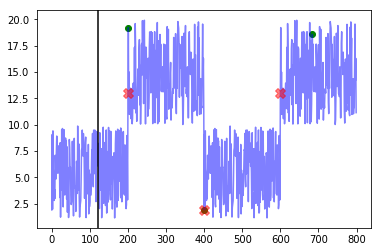




--- artificial_cd_2 ---
Corresponding window precision:  0.17647058823529413
Corresponding window recall:  0.375
Corresponding window false positives:  14
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [400, 504, 696, 720, 800, 801, 802, 803, 804, 816, 828, 840, 864, 1000, 1001, 1002, 1008, 1020, 1092, 1104, 1116, 1128, 1152, 1284, 1296, 1308, 1320]


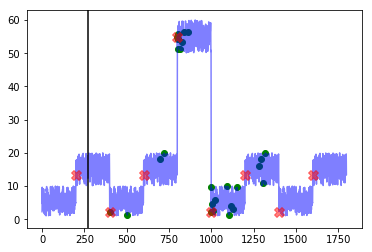




--- artificial_cd_3 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 400, 576, 600, 800, 864]


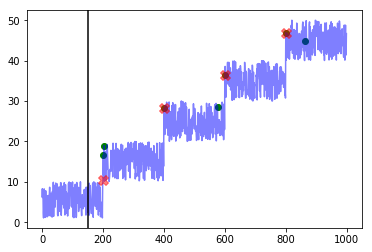

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.0
Best window threshold:  1.0
Corresponding window overall precision:  0.7692307692307693
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.5



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754, 3755]


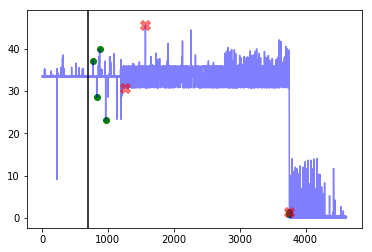




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081]


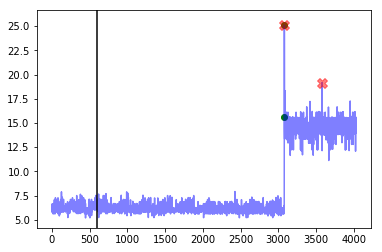




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587]


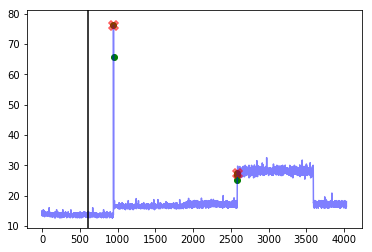




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882]


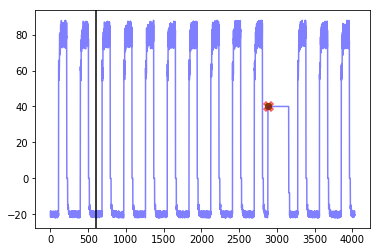




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


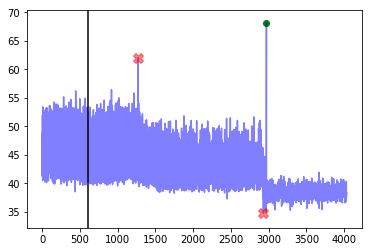




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3580, 3581, 3582, 3583]


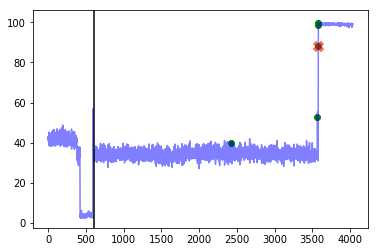




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990]


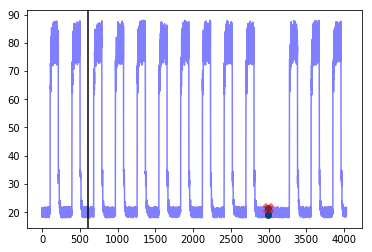




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


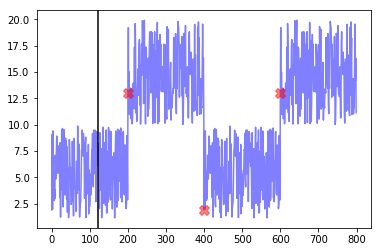




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.125
Corresponding window false positives:  1
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 864]


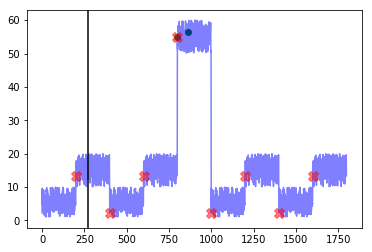




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


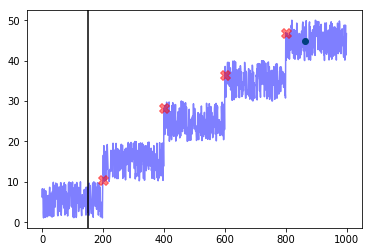

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.5
Best window threshold:  1.0
Corresponding window overall precision:  0.7692307692307693
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.5



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754, 3755]


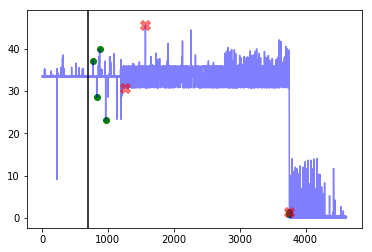




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081]


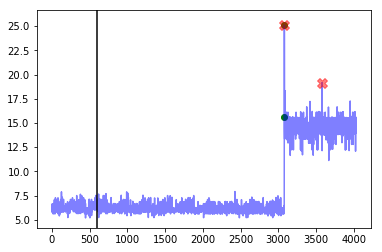




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587]


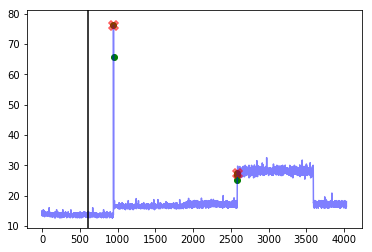




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882]


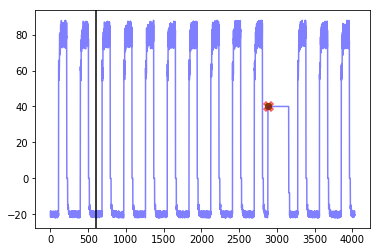




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


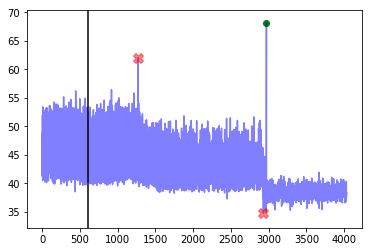




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3580, 3581, 3582, 3583]


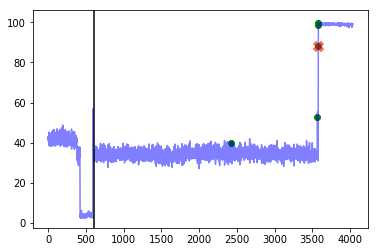




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990]


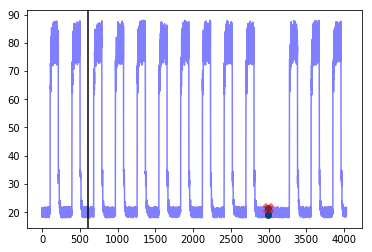




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


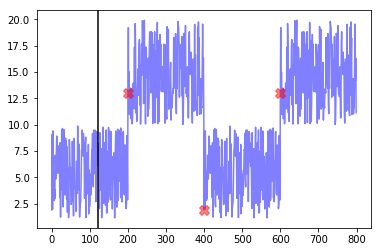




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.125
Corresponding window false positives:  1
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 864]


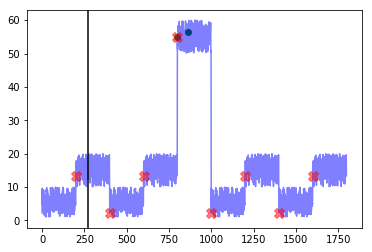




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


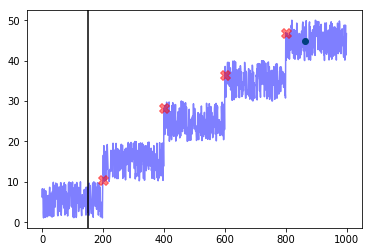

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.0
Best window threshold:  1.0
Corresponding window overall precision:  0.7692307692307693
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.5



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754, 3755]


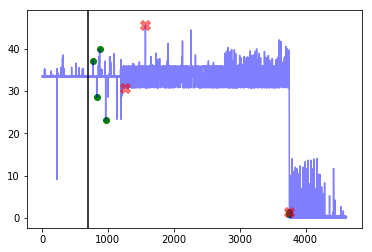




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081]


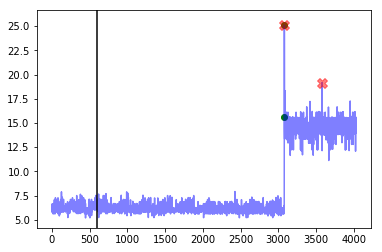




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587]


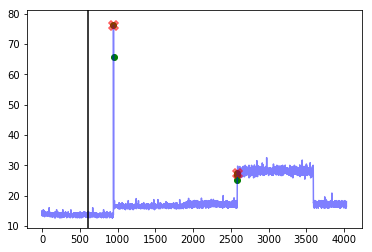




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882]


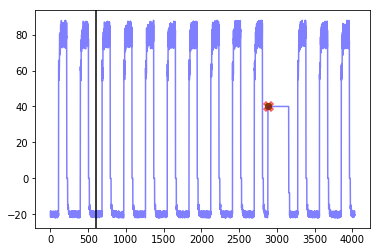




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


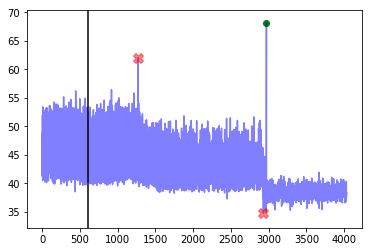




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3580, 3581, 3582, 3583]


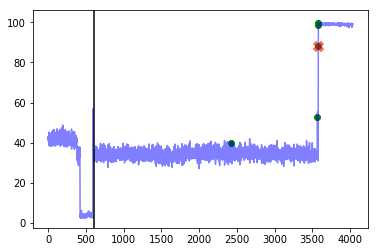




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990]


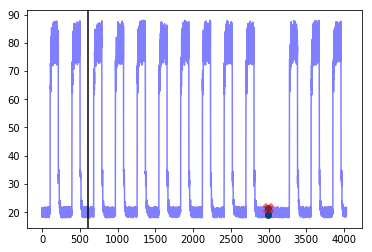




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


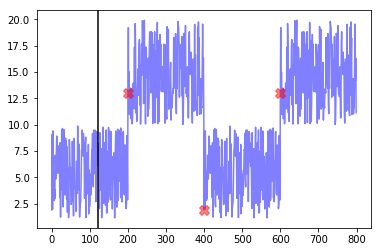




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.125
Corresponding window false positives:  1
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 864]


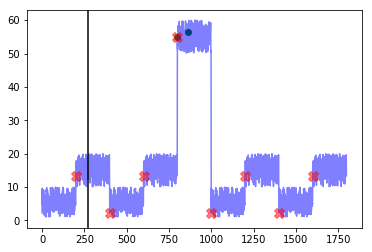




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


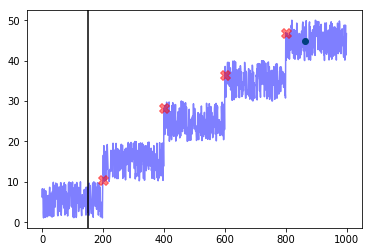

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.5
Best window threshold:  1.0
Corresponding window overall precision:  0.7692307692307693
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.5



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754, 3755]


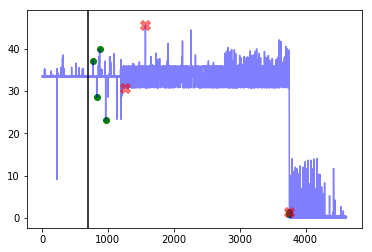




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081]


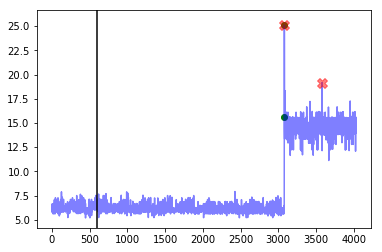




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587]


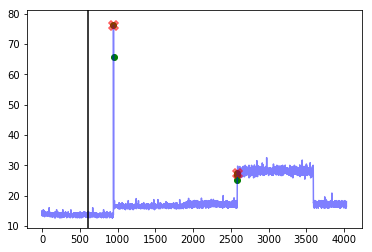




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882]


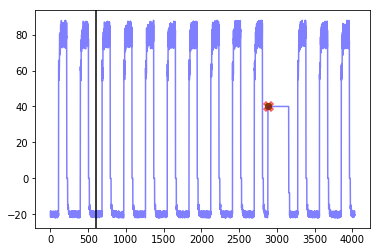




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


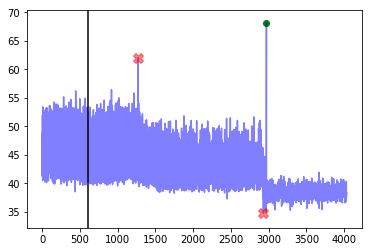




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3580, 3581, 3582, 3583]


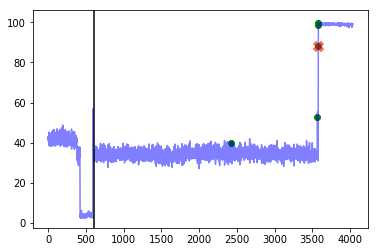




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990]


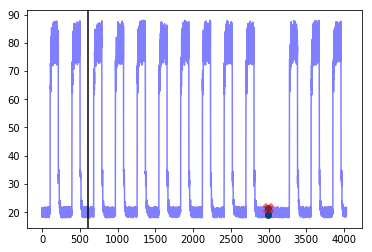




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


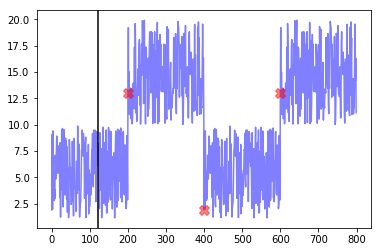




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.125
Corresponding window false positives:  1
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 864]


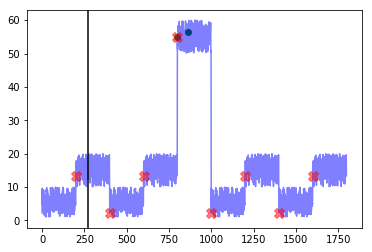




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


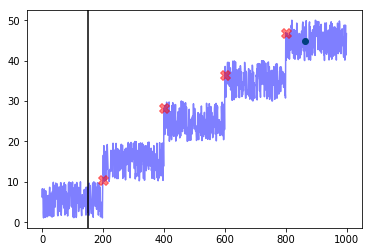

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.0
Best window threshold:  1.0
Corresponding window overall precision:  0.7692307692307693
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.5



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754, 3755]


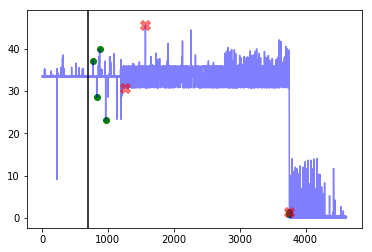




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081]


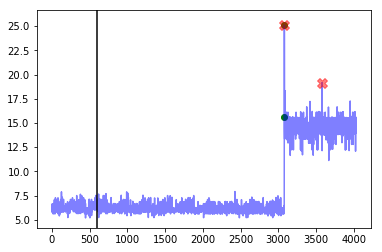




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587]


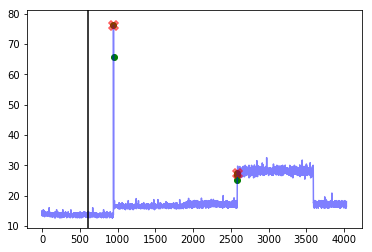




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882]


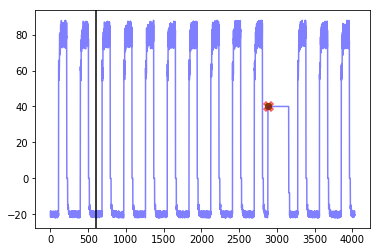




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


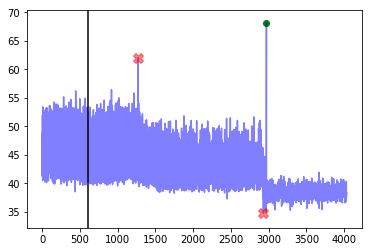




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3580, 3581, 3582, 3583]


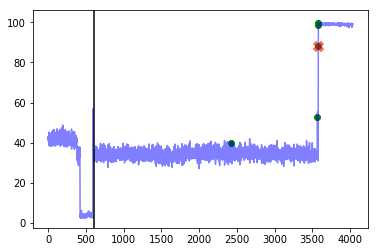




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990]


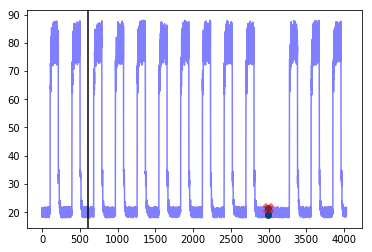




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


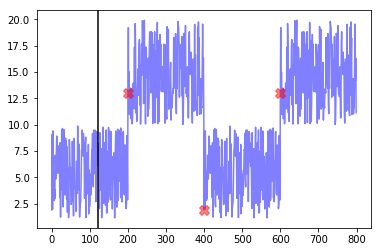




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.125
Corresponding window false positives:  1
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 864]


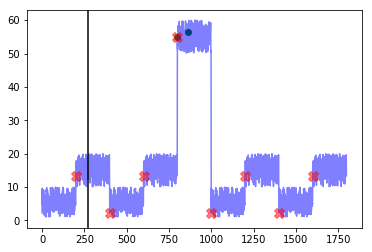




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


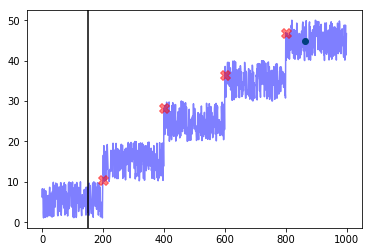

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.5
Best window threshold:  1.0
Corresponding window overall precision:  0.7692307692307693
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.5



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754, 3755]


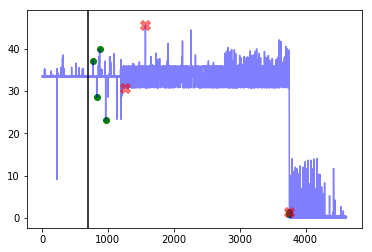




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081]


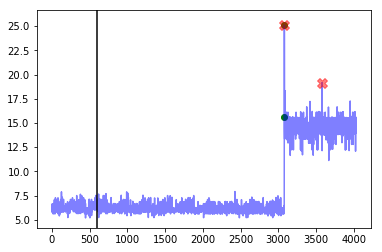




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587]


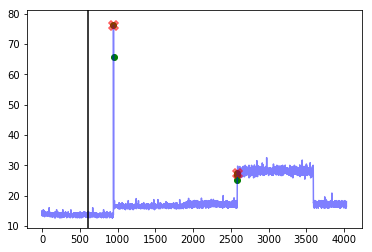




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882]


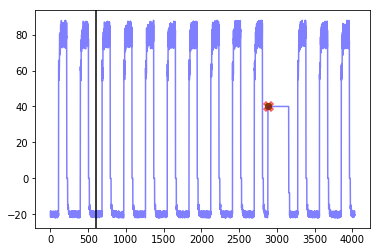




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


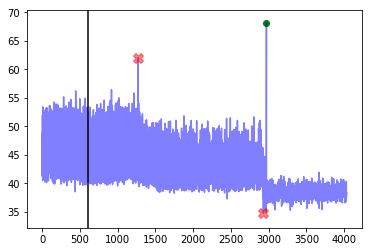




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3580, 3581, 3582, 3583]


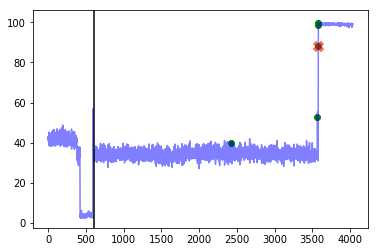




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990]


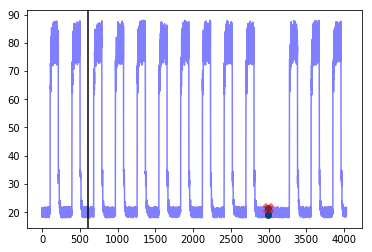




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


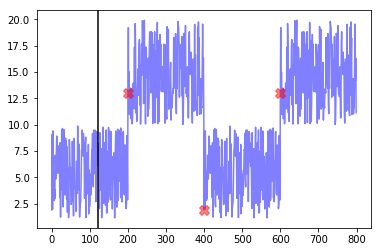




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.125
Corresponding window false positives:  1
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 864]


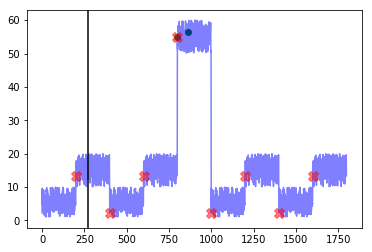




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


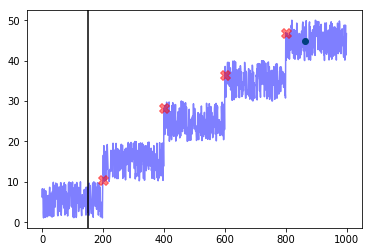

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.0
Best window threshold:  1.0
Corresponding window overall precision:  0.7692307692307693
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.5



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754, 3755]


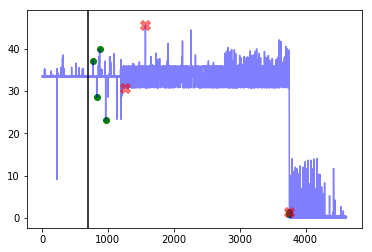




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081]


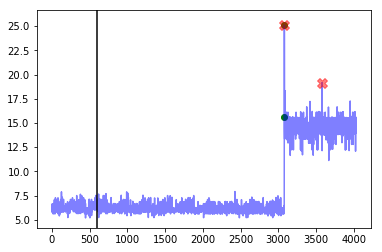




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587]


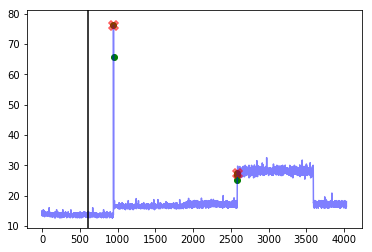




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882]


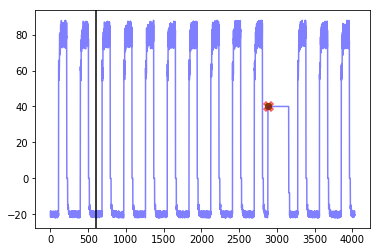




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


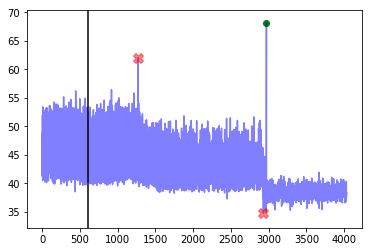




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3580, 3581, 3582, 3583]


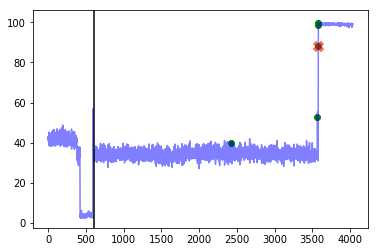




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990]


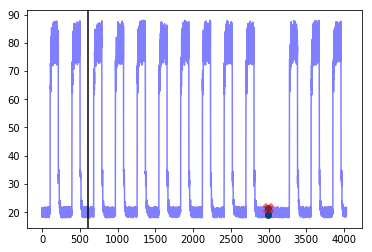




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


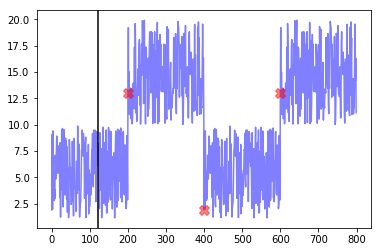




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.125
Corresponding window false positives:  1
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 864]


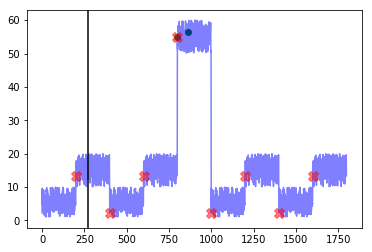




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


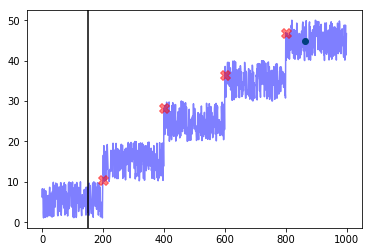

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.5
Best window threshold:  1.0
Corresponding window overall precision:  0.7692307692307693
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.5



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754, 3755]


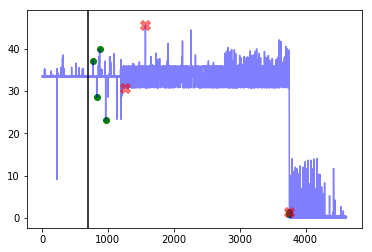




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081]


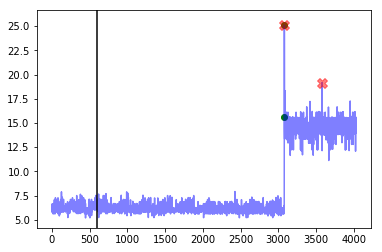




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587]


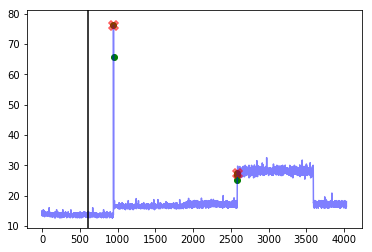




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882]


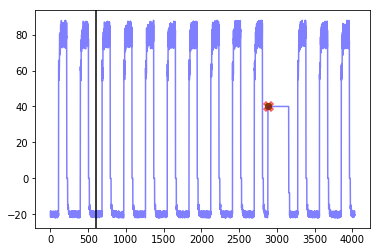




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


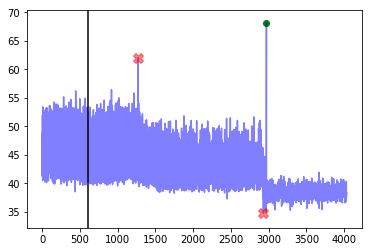




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3580, 3581, 3582, 3583]


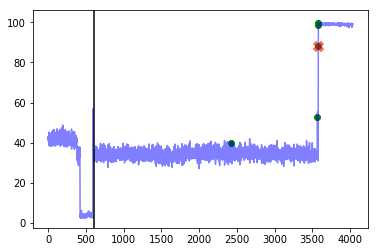




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990]


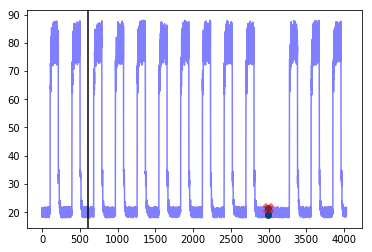




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


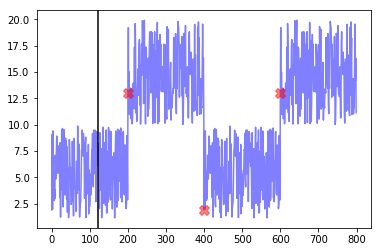




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.125
Corresponding window false positives:  1
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 864]


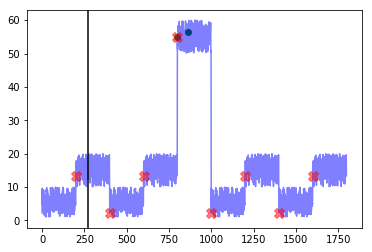




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


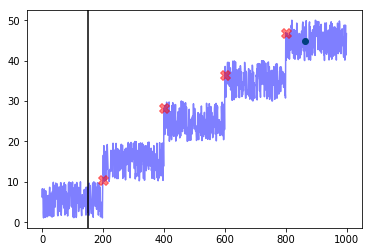

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.0
Best window threshold:  1.0
Corresponding window overall precision:  0.7692307692307693
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.5



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754, 3755]


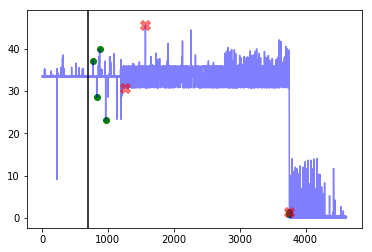




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081]


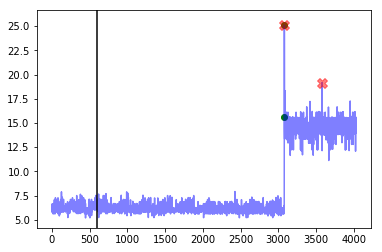




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587]


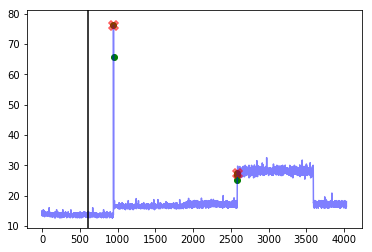




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882]


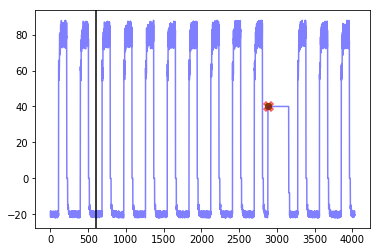




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


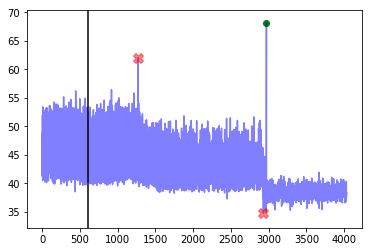




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3580, 3581, 3582, 3583]


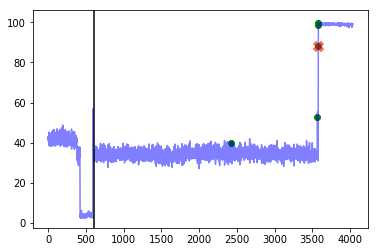




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990]


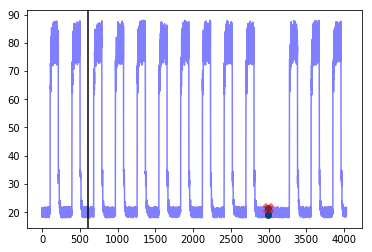




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


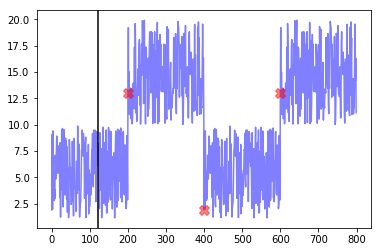




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.125
Corresponding window false positives:  1
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 864]


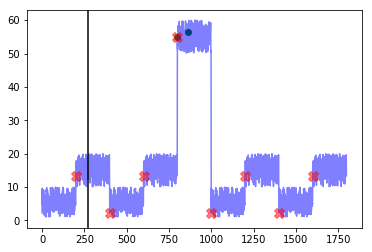




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


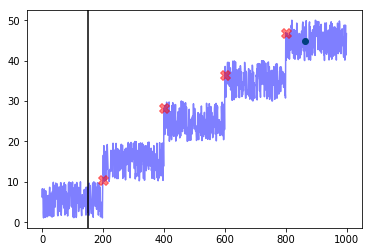

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 14.1
	 Best window threshold : 0.9997
	 Corresponding window overall precision : 0.2727272727272727
	 Corresponding window overall recall : 0.7777777777777778
	 Corresponding window overall F score : 0.40384615384615374
False Positive Weight:  0.2
	 Minimum number of mistakes : 19.0
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.7692307692307693
	 Corresponding window overall recall : 0.37037037037037035
	 Corresponding window overall F score : 0.5
False Positive Weight:  0.3
	 Minimum number of mistakes : 19.5
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.7692307692307693
	 Corresponding window overall recall : 0.37037037037037035
	 Corresponding window overall F score : 0.5
False Positive Weight:  0.4
	 Minimum number of mistakes : 20.0
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.7692307692307693
	 Corresponding window overall

In [33]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# NAB Score

    1. make a python 2.7 virtual environment
    2. pip install pandas
    3. git clone NAB
    4. pip install . in NAB

To obtain NAB scores for every method on the concept drift datasets, we must do the following:

# Have a new dataset?

1. add the new dataset csv with timestamp, value in respective folder in data folder. no missing time steps allowed

2. add the point anomaly dates to combined_labels.json in labels folder

3. add the anomaly windows to combined_windows.json  (start and end dates)

4. in results/null, include null_datasetname.csv with timestamp, value, label, and anomaly_score (all .5). You can just use the adclasses.create_result_csv function and delete irrelevant columns and fill anomaly_score with all .5s

WARNING: Some datasets we use are already in NAB, but they have missing time steps. Replace the dataset csv in the data folder with a prefilled version as the anomaly scores we use assume no missing time steps. You can just use the adclasses.create_result_csv function and delete irrelevant columns

In [34]:
dataset_name = "artificial_cd_1"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]


d = timedelta(minutes=5)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2014-04-01 00:00:00
End date:  2014-04-03 18:35:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-03 18:35:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2014-04-01 15:35:00'), Timestamp('2014-04-01 17:45:00'))
(Timestamp('2014-04-02 08:15:00'), Timestamp('2014-04-02 10:25:00'))
(Timestamp('2014-04-03 00:55:00'), Timestamp('2014-04-03 03:05:00'))


In [35]:
dataset_name = "artificial_cd_2"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

d = timedelta(minutes=5)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2014-04-01 00:00:00
End date:  2014-04-07 05:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-07 05:55:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2014-04-01 15:45:00'), Timestamp('2014-04-01 17:35:00'))
(Timestamp('2014-04-02 08:25:00'), Timestamp('2014-04-02 10:15:00'))
(Timestamp('2014-04-03 01:05:00'), Timestamp('2014-04-03 02:55:00'))
(Timestamp('2014-04-03 17:45:00'), Timestamp('2014-04-03 19:35:00'))
(Timestamp('2014-04-04 10:25:00'), Timestamp('2014-04-04 12:15:00'))
(Timestamp('2014-04-05 03:05:00'), Timestamp('2014-04-05 04:55:00'))
(Timestamp('2014-04-05 19:45:00'), Timestamp('2014-04-05 21:35:00'))
(Timestamp('2014-04-06 12:25:00'), Timestamp('2014-04-06 14:15:00'))


In [36]:
dataset_name = "artificial_cd_3"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))


ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

d = timedelta(minutes=5)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2014-04-01 00:00:00
End date:  2014-04-04 11:15:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1000
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-04 11:15:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2014-04-01 15:40:00'), Timestamp('2014-04-01 17:40:00'))
(Timestamp('2014-04-02 08:20:00'), Timestamp('2014-04-02 10:20:00'))
(Timestamp('2014-04-03 01:00:00'), Timestamp('2014-04-03 03:00:00'))
(Timestamp('2014-04-03 17:40:00'), Timestamp('2014-04-03 19:40:00'))


# For every anomaly detection method "method_name" and dataset "dataset_name", do the following:

0. clear up previous NAB/results/

1. $ python scripts/create_new_detector.py --detector method_name

this creates the method_name folder in results folder with a bunch of datasets folders that are empty. delete the irrelevant ones

2. for every characteristic relevant dataset, create csvs with columns like so: timestamp, value, anomaly_score, label. place in appropriate locations in results/method_name/

3. replace datasets with prefill

4. $ python run.py -d method_name --optimize --score --normalize

WARNING: HAVE TO MAKE CHANGE TO NAB function convertAnomalyScoresToDetections in util.py bc it will think values are strings

In [38]:
prepath="/home/cfreeman/Documents/NextIT/test_python_2/NAB/results_conceptdrift" + window_size + "/"

# SARIMA

Final score for 'SARIMA' detector on 'auto_reward_low_FP_rate' profile = 36.53

Final score for 'SARIMA' detector on 'auto_reward_low_FN_rate' profile = 53.86

Final score for 'SARIMA' detector on 'auto_standard' profile = 39.82


In [39]:
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# Prophet

Final score for 'Prophet' detector on 'reward_low_FP_rate' profile = 2.20

Final score for 'Prophet' detector on 'reward_low_FN_rate' profile = 41.21

Final score for 'Prophet' detector on 'standard' profile = 21.57


In [40]:
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

#  GLM

Final score for 'GLM' detector on 'reward_low_FP_rate' profile = 35.79

Final score for 'GLM' detector on 'reward_low_FN_rate' profile = 54.63

Final score for 'GLM' detector on 'standard' profile = 38.39


In [41]:
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# HTM

Final score for 'HTM' detector on 'reward_low_FP_rate' profile = 39.67

Final score for 'HTM' detector on 'reward_low_FN_rate' profile = 54.73

Final score for 'HTM' detector on 'standard' profile = 40.31



In [42]:
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# Windowed Gaussian

Final score for 'windowed' detector on 'gaussian_reward_low_FP_rate' profile = 19.04

Final score for 'windowed' detector on 'gaussian_reward_low_FN_rate' profile = 46.24

Final score for 'windowed' detector on 'gaussian_standard' profile = 29.67


In [43]:
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# HOTSAX

Final score for 'hotsax' detector on 'reward_low_FP_rate' profile = 34.97

Final score for 'hotsax' detector on 'reward_low_FN_rate' profile = 50.43

Final score for 'hotsax' detector on 'standard' profile = 36.37


In [44]:
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###